# Importation des librairies

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.impute import KNNImputer
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import make_scorer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.impute import KNNImputer
from sklearn.linear_model import SGDClassifier
import seaborn as sns
import numpy as np
import calendar

# Importation des données

In [4]:
# Chemin vers le fichier CSV
file_path_emma = r"C:\Users\emmad\Documents\ISUP\M2\S1\ML\data\\"

# Charger les données 
Test_Benef= pd.read_csv(file_path_emma+"Test_Beneficiarydata-1542969243754.csv")

Test_In= pd.read_csv(file_path_emma+"Test_Inpatientdata-1542969243754.csv")

Test_Out= pd.read_csv(file_path_emma+"Test_Outpatientdata-1542969243754.csv")

Test_Providers= pd.read_csv(file_path_emma+"Test-1542969243754.csv")

Train_Benef= pd.read_csv(file_path_emma+"Train_Beneficiarydata-1542865627584.csv")

Train_In= pd.read_csv(file_path_emma+"Train_Inpatientdata-1542865627584.csv")

Train_Out= pd.read_csv(file_path_emma+"Train_Outpatientdata-1542865627584.csv")

Train_Providers= pd.read_csv(file_path_emma+"Train-1542865627584.csv")



# Construction de la BDD

**Liste des colonnes:**

In [7]:
Train_Benef.columns

Index(['BeneID', 'DOB', 'DOD', 'Gender', 'Race', 'RenalDiseaseIndicator',
       'State', 'County', 'NoOfMonths_PartACov', 'NoOfMonths_PartBCov',
       'ChronicCond_Alzheimer', 'ChronicCond_Heartfailure',
       'ChronicCond_KidneyDisease', 'ChronicCond_Cancer',
       'ChronicCond_ObstrPulmonary', 'ChronicCond_Depression',
       'ChronicCond_Diabetes', 'ChronicCond_IschemicHeart',
       'ChronicCond_Osteoporasis', 'ChronicCond_rheumatoidarthritis',
       'ChronicCond_stroke', 'IPAnnualReimbursementAmt',
       'IPAnnualDeductibleAmt', 'OPAnnualReimbursementAmt',
       'OPAnnualDeductibleAmt'],
      dtype='object')

In [8]:
Train_In.columns

Index(['BeneID', 'ClaimID', 'ClaimStartDt', 'ClaimEndDt', 'Provider',
       'InscClaimAmtReimbursed', 'AttendingPhysician', 'OperatingPhysician',
       'OtherPhysician', 'AdmissionDt', 'ClmAdmitDiagnosisCode',
       'DeductibleAmtPaid', 'DischargeDt', 'DiagnosisGroupCode',
       'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2', 'ClmDiagnosisCode_3',
       'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5', 'ClmDiagnosisCode_6',
       'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8', 'ClmDiagnosisCode_9',
       'ClmDiagnosisCode_10', 'ClmProcedureCode_1', 'ClmProcedureCode_2',
       'ClmProcedureCode_3', 'ClmProcedureCode_4', 'ClmProcedureCode_5',
       'ClmProcedureCode_6'],
      dtype='object')

In [9]:
Train_Out.columns

Index(['BeneID', 'ClaimID', 'ClaimStartDt', 'ClaimEndDt', 'Provider',
       'InscClaimAmtReimbursed', 'AttendingPhysician', 'OperatingPhysician',
       'OtherPhysician', 'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2',
       'ClmDiagnosisCode_3', 'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5',
       'ClmDiagnosisCode_6', 'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8',
       'ClmDiagnosisCode_9', 'ClmDiagnosisCode_10', 'ClmProcedureCode_1',
       'ClmProcedureCode_2', 'ClmProcedureCode_3', 'ClmProcedureCode_4',
       'ClmProcedureCode_5', 'ClmProcedureCode_6', 'DeductibleAmtPaid',
       'ClmAdmitDiagnosisCode'],
      dtype='object')

In [10]:
Train_Providers.columns

Index(['Provider', 'PotentialFraud'], dtype='object')

Ajout d'une **colonne Patient_Type** pour les dataframe Train_In et Train_Out (pour garder cette information au moment de la jointure).

In [12]:
Train_In['Patient_Type'] = 1


In [13]:
Train_Out['Patient_Type'] = 2


Nombre de lignes dans les deux dataframes.

In [15]:
print(Train_In.shape[0])
print(Train_Out.shape[0])

40474
517737


In [16]:
40474+517737

558211

**Jointure 1:**

In [18]:
colonnes_communes = [
    'BeneID',
    'ClaimID',
    'ClaimStartDt',
    'ClaimEndDt',
    'Provider',
    'InscClaimAmtReimbursed',
    'AttendingPhysician',
    'OperatingPhysician',
    'OtherPhysician',
    'ClmAdmitDiagnosisCode',
    'DeductibleAmtPaid',
    'ClmDiagnosisCode_1',
    'ClmDiagnosisCode_2',
    'ClmDiagnosisCode_3',
    'ClmDiagnosisCode_4',
    'ClmDiagnosisCode_5',
    'ClmDiagnosisCode_6',
    'ClmDiagnosisCode_7',
    'ClmDiagnosisCode_8',
    'ClmDiagnosisCode_9',
    'ClmDiagnosisCode_10',
    'ClmProcedureCode_1',
    'ClmProcedureCode_2',
    'ClmProcedureCode_3',
    'ClmProcedureCode_4',
    'ClmProcedureCode_5',
    'ClmProcedureCode_6',
    'Patient_Type'
]


In [19]:
#On supprime 2 colonnes de Train_In

Train_In.drop(['DischargeDt', 'AdmissionDt'], axis=1, inplace=True, errors='ignore')


In [20]:
merged1 = pd.merge(Train_In, Train_Out, on=colonnes_communes, how='outer')  # 'outer' pour une jointure complète


In [21]:
merged1.shape[0]

558211

**Jointure 2:**

In [23]:
merged2 = pd.merge(merged1, Train_Benef, on='BeneID', how='left')

In [24]:
merged2.shape[0]

558211

In [25]:
print(merged1.shape[1])
print(Train_Benef.shape[1])
print(merged2.shape[1])

29
25
53


In [26]:
29+25-1

53

**Jointure 3:**

In [28]:
data = pd.merge(merged2, Train_Providers, on='Provider', how='left')

In [29]:
data.shape[0]

558211

In [30]:
data.shape[1]

54

# Analyse des valeurs manquantes

In [32]:
data.head()

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,ClmAdmitDiagnosisCode,...,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt,PotentialFraud
0,BENE100000,CLM126832,2009-01-08,2009-01-08,PRV57172,50,PHY383401,NaN,NaN,NaN,...,2,1,2,2,2,0,0,120,30,Yes
1,BENE100000,CLM351838,2009-05-10,2009-05-10,PRV57172,70,PHY370909,NaN,PHY363377,NaN,...,2,1,2,2,2,0,0,120,30,Yes
2,BENE100001,CLM229075,2009-03-05,2009-03-05,PRV55158,70,PHY383478,NaN,NaN,64880,...,2,1,1,2,1,0,0,2530,540,No
3,BENE100001,CLM258631,2009-03-21,2009-03-21,PRV54966,70,PHY347511,NaN,NaN,36401,...,2,1,1,2,1,0,0,2530,540,Yes
4,BENE100001,CLM332544,2009-04-30,2009-05-02,PRV54890,90,PHY343317,PHY408367,PHY408367,78009,...,2,1,1,2,1,0,0,2530,540,No


In [33]:

# Analyse des valeurs manquantes
def analyser_valeurs_manquantes(data):
    # Calculer le nombre de valeurs manquantes par colonne
    valeurs_manquantes = data.isnull().sum()
    
    # Calculer le pourcentage de valeurs manquantes par colonne
    pourcentage_manquant = (valeurs_manquantes / len(data)) * 100

    # Créer un DataFrame résumant l'analyse
    analyse = pd.DataFrame({
        'Colonnes': data.columns,
        'Valeurs_manquantes': valeurs_manquantes,
        'Pourcentage_manquant': pourcentage_manquant
    })
    
    # Trier par ordre décroissant des valeurs manquantes
    analyse = analyse.sort_values(by='Valeurs_manquantes', ascending=False).reset_index(drop=True)
    
    return analyse

# Appeler la fonction
resultat_analyse = analyser_valeurs_manquantes(data)

# Afficher les résultats
print(resultat_analyse)

# Facultatif : Afficher uniquement les colonnes avec des valeurs manquantes
colonnes_avec_manquantes = resultat_analyse[resultat_analyse['Valeurs_manquantes'] > 0]
print("\nColonnes avec valeurs manquantes :\n", colonnes_avec_manquantes)


                           Colonnes  Valeurs_manquantes  Pourcentage_manquant
0                ClmProcedureCode_6              558211            100.000000
1                ClmProcedureCode_5              558202             99.998388
2                ClmProcedureCode_4              558093             99.978861
3                ClmProcedureCode_3              557242             99.826410
4                               DOD              554080             99.259957
5               ClmDiagnosisCode_10              553201             99.102490
6                ClmProcedureCode_2              552721             99.016501
7                ClmProcedureCode_1              534901             95.824160
8                DiagnosisGroupCode              517737             92.749337
9                ClmDiagnosisCode_9              516396             92.509105
10               ClmDiagnosisCode_8              504767             90.425843
11               ClmDiagnosisCode_7              492034         

In [34]:
# Pour Train_In


# Appeler la fonction
resultat_analyseIN = analyser_valeurs_manquantes(Train_In)

# Afficher les résultats
print(resultat_analyseIN)

# Facultatif : Afficher uniquement les colonnes avec des valeurs manquantes
colonnes_avec_manquantesIN = resultat_analyseIN[resultat_analyseIN['Valeurs_manquantes'] > 0]
print("\nColonnes avec valeurs manquantes :\n", colonnes_avec_manquantesIN)


                  Colonnes  Valeurs_manquantes  Pourcentage_manquant
0       ClmProcedureCode_6               40474            100.000000
1       ClmProcedureCode_5               40465             99.977764
2       ClmProcedureCode_4               40358             99.713396
3       ClmProcedureCode_3               39509             97.615753
4      ClmDiagnosisCode_10               36547             90.297475
5           OtherPhysician               35784             88.412314
6       ClmProcedureCode_2               35020             86.524683
7       ClmProcedureCode_1               17326             42.807728
8       OperatingPhysician               16644             41.122696
9       ClmDiagnosisCode_9               13497             33.347334
10      ClmDiagnosisCode_8                9942             24.563918
11      ClmDiagnosisCode_7                7258             17.932500
12      ClmDiagnosisCode_6                4838             11.953353
13      ClmDiagnosisCode_5        

In [35]:
# Pour Train_Out


# Appeler la fonction
resultat_analyseOUT = analyser_valeurs_manquantes(Train_Out)

# Afficher les résultats
print(resultat_analyseOUT)

# Facultatif : Afficher uniquement les colonnes avec des valeurs manquantes
colonnes_avec_manquantesOUT = resultat_analyseOUT[resultat_analyseOUT['Valeurs_manquantes'] > 0]
print("\nColonnes avec valeurs manquantes :\n", colonnes_avec_manquantesOUT)


                  Colonnes  Valeurs_manquantes  Pourcentage_manquant
0       ClmProcedureCode_6              517737            100.000000
1       ClmProcedureCode_5              517737            100.000000
2       ClmProcedureCode_4              517735             99.999614
3       ClmProcedureCode_3              517733             99.999227
4       ClmProcedureCode_2              517701             99.993047
5       ClmProcedureCode_1              517575             99.968710
6      ClmDiagnosisCode_10              516654             99.790820
7       ClmDiagnosisCode_9              502899             97.134066
8       ClmDiagnosisCode_8              494825             95.574587
9       ClmDiagnosisCode_7              484776             93.633640
10      ClmDiagnosisCode_6              468981             90.582864
11      ClmDiagnosisCode_5              443393             85.640586
12      OperatingPhysician              427120             82.497484
13   ClmAdmitDiagnosisCode        

Beaucoup plus de valeurs manquantes dans Train_Out, mais aussi plus de lignes dans train_Out ce qui nous plombe nos pourcentages de valeurs manquantes au global...

**Transformation colonnes:** On ajoute une colonne NbDiagnosis et on supprime les colonnes ClmDiagnosisCode.

In [38]:

# Liste des colonnes à analyser
diagnosis_columns = [
    'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2', 'ClmDiagnosisCode_3',
    'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5', 'ClmDiagnosisCode_6',
    'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8', 'ClmDiagnosisCode_9',
    'ClmDiagnosisCode_10'
]

# Calculer le nombre de colonnes non vides par ligne
data['NbDiagnosis'] = data[diagnosis_columns].notna().sum(axis=1)


In [39]:

# Supprimer les colonnes inutiles
data = data.drop(columns=diagnosis_columns)


In [40]:
data.shape[1]

45

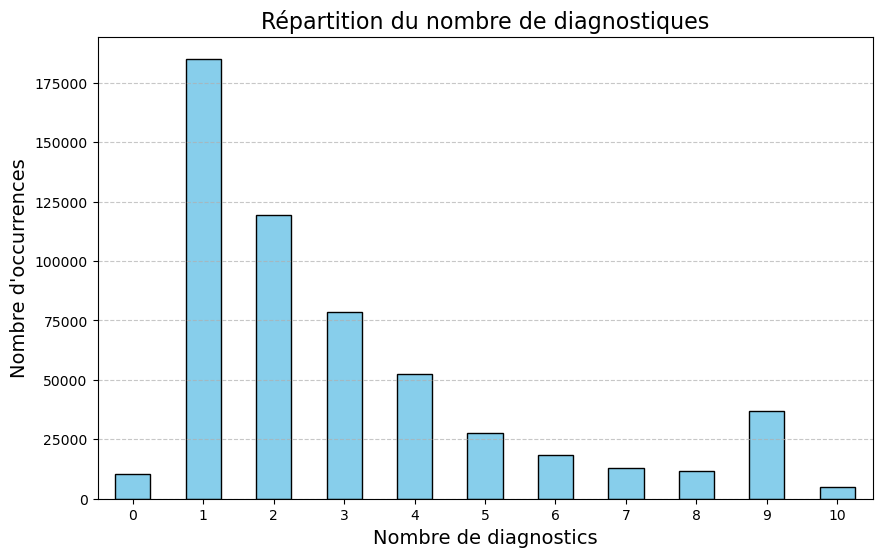

In [41]:
# Visualiser la répartition de NbDiagnosis
plt.figure(figsize=(10, 6))
data['NbDiagnosis'].value_counts().sort_index().plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Répartition du nombre de diagnostiques', fontsize=16)
plt.xlabel('Nombre de diagnostics', fontsize=14)
plt.ylabel('Nombre d\'occurrences', fontsize=14)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [42]:

# Analyse des valeurs manquantes
def analyser_valeurs_manquantes(data):
    # Calculer le nombre de valeurs manquantes par colonne
    valeurs_manquantes = data.isnull().sum()
    
    # Calculer le pourcentage de valeurs manquantes par colonne
    pourcentage_manquant = (valeurs_manquantes / len(data)) * 100

    # Créer un DataFrame résumant l'analyse
    analyse = pd.DataFrame({
        'Colonnes': data.columns,
        'Valeurs_manquantes': valeurs_manquantes,
        'Pourcentage_manquant': pourcentage_manquant
    })
    
    # Trier par ordre décroissant des valeurs manquantes
    analyse = analyse.sort_values(by='Valeurs_manquantes', ascending=False).reset_index(drop=True)
    
    return analyse

# Appeler la fonction
resultat_analyse = analyser_valeurs_manquantes(data)

# Afficher les résultats
print(resultat_analyse)

# Facultatif : Afficher uniquement les colonnes avec des valeurs manquantes
colonnes_avec_manquantes = resultat_analyse[resultat_analyse['Valeurs_manquantes'] > 0]
print("\nColonnes avec valeurs manquantes :\n", colonnes_avec_manquantes)


                           Colonnes  Valeurs_manquantes  Pourcentage_manquant
0                ClmProcedureCode_6              558211            100.000000
1                ClmProcedureCode_5              558202             99.998388
2                ClmProcedureCode_4              558093             99.978861
3                ClmProcedureCode_3              557242             99.826410
4                               DOD              554080             99.259957
5                ClmProcedureCode_2              552721             99.016501
6                ClmProcedureCode_1              534901             95.824160
7                DiagnosisGroupCode              517737             92.749337
8                OperatingPhysician              443764             79.497538
9             ClmAdmitDiagnosisCode              412312             73.863109
10                   OtherPhysician              358475             64.218548
11               AttendingPhysician                1508         

In [43]:
# Suppression des colonnes avec plus de 60% de valeurs manquantes
seuil = 60  # seuil de 60%
colonnes_a_supprimer = colonnes_avec_manquantes[colonnes_avec_manquantes['Pourcentage_manquant'] > seuil]['Colonnes']

# Supprimer ces colonnes du DataFrame
data = data.drop(columns=colonnes_a_supprimer)

# Afficher les colonnes restantes
print("Colonnes restantes après suppression :")
print(data.columns)


Colonnes restantes après suppression :
Index(['BeneID', 'ClaimID', 'ClaimStartDt', 'ClaimEndDt', 'Provider',
       'InscClaimAmtReimbursed', 'AttendingPhysician', 'DeductibleAmtPaid',
       'Patient_Type', 'DOB', 'Gender', 'Race', 'RenalDiseaseIndicator',
       'State', 'County', 'NoOfMonths_PartACov', 'NoOfMonths_PartBCov',
       'ChronicCond_Alzheimer', 'ChronicCond_Heartfailure',
       'ChronicCond_KidneyDisease', 'ChronicCond_Cancer',
       'ChronicCond_ObstrPulmonary', 'ChronicCond_Depression',
       'ChronicCond_Diabetes', 'ChronicCond_IschemicHeart',
       'ChronicCond_Osteoporasis', 'ChronicCond_rheumatoidarthritis',
       'ChronicCond_stroke', 'IPAnnualReimbursementAmt',
       'IPAnnualDeductibleAmt', 'OPAnnualReimbursementAmt',
       'OPAnnualDeductibleAmt', 'PotentialFraud', 'NbDiagnosis'],
      dtype='object')


In [44]:

# Analyse des valeurs manquantes
def analyser_valeurs_manquantes(data):
    # Calculer le nombre de valeurs manquantes par colonne
    valeurs_manquantes = data.isnull().sum()
    
    # Calculer le pourcentage de valeurs manquantes par colonne
    pourcentage_manquant = (valeurs_manquantes / len(data)) * 100

    # Créer un DataFrame résumant l'analyse
    analyse = pd.DataFrame({
        'Colonnes': data.columns,
        'Valeurs_manquantes': valeurs_manquantes,
        'Pourcentage_manquant': pourcentage_manquant
    })
    
    # Trier par ordre décroissant des valeurs manquantes
    analyse = analyse.sort_values(by='Valeurs_manquantes', ascending=False).reset_index(drop=True)
    
    return analyse

# Appeler la fonction
resultat_analyse = analyser_valeurs_manquantes(data)

# Afficher les résultats
print(resultat_analyse)

# Facultatif : Afficher uniquement les colonnes avec des valeurs manquantes
colonnes_avec_manquantes = resultat_analyse[resultat_analyse['Valeurs_manquantes'] > 0]
print("\nColonnes avec valeurs manquantes :\n", colonnes_avec_manquantes)


                           Colonnes  Valeurs_manquantes  Pourcentage_manquant
0                AttendingPhysician                1508              0.270149
1                 DeductibleAmtPaid                 899              0.161050
2                            BeneID                   0              0.000000
3   ChronicCond_rheumatoidarthritis                   0              0.000000
4                ChronicCond_Cancer                   0              0.000000
5        ChronicCond_ObstrPulmonary                   0              0.000000
6            ChronicCond_Depression                   0              0.000000
7              ChronicCond_Diabetes                   0              0.000000
8         ChronicCond_IschemicHeart                   0              0.000000
9          ChronicCond_Osteoporasis                   0              0.000000
10               ChronicCond_stroke                   0              0.000000
11         ChronicCond_Heartfailure                   0         

In [45]:
data.shape[1]

34

On crée la colonne **DureeClaim**:

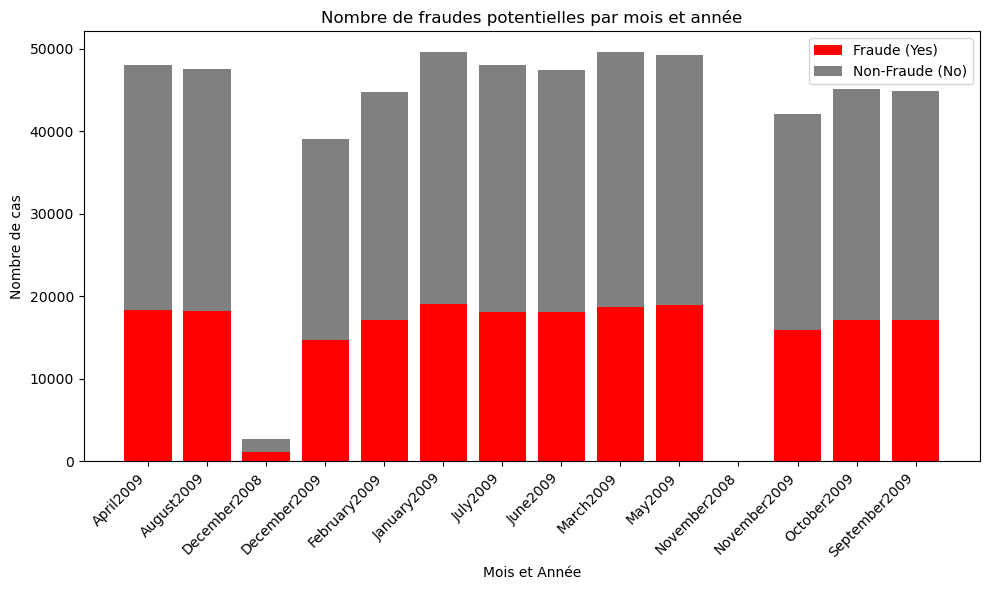

In [47]:
# Conversion de ClaimStartDt en datetime
data['ClaimStartDt'] = pd.to_datetime(data['ClaimStartDt'])

# Création de la colonne MoisAnnée
data['MoisAnnee'] = data['ClaimStartDt'].dt.strftime('%B%Y')
data['MoisAnnee'] = data['ClaimStartDt'].dt.month.apply(lambda x: calendar.month_name[x]) + data['ClaimStartDt'].dt.year.astype(str)

# Calcul du nombre de PotentialFraud par MoisAnnee et type
counts = data.groupby(['MoisAnnee', 'PotentialFraud']).size().unstack(fill_value=0)

# Création des barres
fig, ax = plt.subplots(figsize=(10, 6))
x = range(len(counts.index))
ax.bar(x, counts['Yes'], color='red', label='Fraude (Yes)')
ax.bar(x, counts['No'], bottom=counts['Yes'], color='gray', label='Non-Fraude (No)')

# Formatage du graphique
ax.set_xticks(x)
ax.set_xticklabels(counts.index, rotation=45, ha='right')
ax.set_xlabel('Mois et Année')
ax.set_ylabel('Nombre de cas')
ax.set_title('Nombre de fraudes potentielles par mois et année')
ax.legend()

plt.tight_layout()
plt.show()

In [48]:
import pandas as pd
import calendar
import plotly.graph_objects as go

# Conversion de ClaimStartDt en datetime
data['ClaimStartDt'] = pd.to_datetime(data['ClaimStartDt'])

# Création de la colonne MoisAnnée
data['MoisAnnee'] = data['ClaimStartDt'].dt.month.apply(lambda x: calendar.month_name[x]) + ' ' + data['ClaimStartDt'].dt.year.astype(str)

# Calcul du nombre de PotentialFraud par MoisAnnee et type
counts = data.groupby(['MoisAnnee', 'PotentialFraud']).size().unstack(fill_value=0)

# Création du graphique interactif avec Plotly
fig = go.Figure()

fig.add_trace(go.Bar(
    x=counts.index,
    y=counts['Yes'],
    name='Fraude (Yes)',
    marker_color='#FF5733'  # Couleur rouge vif
))

fig.add_trace(go.Bar(
    x=counts.index,
    y=counts['No'],
    name='Non-Fraude (No)',
    marker_color='#D3D3D3'  # Couleur gris très pâle
))

# Mise en page et personnalisation
fig.update_layout(
    barmode='stack',
    title='Nombre de fraudes potentielles par mois et année',
    xaxis_title='Mois et Année',
    yaxis_title='Nombre de cas',
    xaxis=dict(tickangle=45),
    legend=dict(title='Type de cas'),
    template='plotly_white',
    hovermode='x'
)

# Affichage du graphique interactif
fig.show()


La proportion est globalement la même qu'importe le mois, ce qui nous autorise à supprimer cette variable.  On va l'utiliser pour céer DureeClaim qui sera plus pertinente pour construire notre modèle.

In [50]:

# Assurez-vous que ClaimStartDt et ClaimEndDt sont de type datetime
data['ClaimStartDt'] = pd.to_datetime(data['ClaimStartDt'])
data['ClaimEndDt'] = pd.to_datetime(data['ClaimEndDt'])

# Calculer la durée des réclamations
data['DureeClaim'] = (data['ClaimEndDt'] - data['ClaimStartDt']).dt.days + 1

In [51]:
data.drop(['ClaimStartDt','ClaimEndDt','AttendingPhysician'], axis=1, inplace=True)

In [52]:
data.head()

,BeneID,ClaimID,Provider,InscClaimAmtReimbursed,DeductibleAmtPaid,Patient_Type,DOB,Gender,Race,RenalDiseaseIndicator,...,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt,PotentialFraud,NbDiagnosis,MoisAnnee,DureeClaim
0,BENE100000,CLM126832,PRV57172,50,0.0,2,1938-03-01,1,1,0,...,2,2,0,0,120,30,Yes,1,January 2009,1
1,BENE100000,CLM351838,PRV57172,70,0.0,2,1938-03-01,1,1,0,...,2,2,0,0,120,30,Yes,1,May 2009,1
2,BENE100001,CLM229075,PRV55158,70,0.0,2,1939-08-01,1,1,0,...,2,1,0,0,2530,540,No,1,March 2009,1
3,BENE100001,CLM258631,PRV54966,70,0.0,2,1939-08-01,1,1,0,...,2,1,0,0,2530,540,Yes,2,March 2009,1
4,BENE100001,CLM332544,PRV54890,90,0.0,2,1939-08-01,1,1,0,...,2,1,0,0,2530,540,No,9,April 2009,3


In [53]:
# Vérifier si un BeneID apparaît plusieurs fois
duplicated_beneIDs = data[data.duplicated(subset=['BeneID'], keep=False)]  # keep=False pour afficher toutes les occurrences des doublons

#duplicated_beneIDs 


#Juste BeneID n'est pas une clé unique

In [54]:
#On conserve les ID des patients avec des valeurs manquantes

NA_DeductibleAmtPaid = data[data['DeductibleAmtPaid'].isna()][['BeneID','ClaimID']]

In [55]:
# Intersection entre data et NA_AttendingPhysician en conservant AttendingPhysician
intersection = data.merge(
    NA_DeductibleAmtPaid, 
    on=['BeneID', 'ClaimID'],  # Colonnes communes pour l'intersection
    how='inner'  # Intersection
)[['DeductibleAmtPaid']]

intersection

,DeductibleAmtPaid
0,NaN
1,NaN
2,NaN
3,NaN
4,NaN
...,...
894,NaN
895,NaN
896,NaN
897,NaN


**Traitement des valeurs manquantes**

In [57]:
data.columns

Index(['BeneID', 'ClaimID', 'Provider', 'InscClaimAmtReimbursed',
       'DeductibleAmtPaid', 'Patient_Type', 'DOB', 'Gender', 'Race',
       'RenalDiseaseIndicator', 'State', 'County', 'NoOfMonths_PartACov',
       'NoOfMonths_PartBCov', 'ChronicCond_Alzheimer',
       'ChronicCond_Heartfailure', 'ChronicCond_KidneyDisease',
       'ChronicCond_Cancer', 'ChronicCond_ObstrPulmonary',
       'ChronicCond_Depression', 'ChronicCond_Diabetes',
       'ChronicCond_IschemicHeart', 'ChronicCond_Osteoporasis',
       'ChronicCond_rheumatoidarthritis', 'ChronicCond_stroke',
       'IPAnnualReimbursementAmt', 'IPAnnualDeductibleAmt',
       'OPAnnualReimbursementAmt', 'OPAnnualDeductibleAmt', 'PotentialFraud',
       'NbDiagnosis', 'MoisAnnee', 'DureeClaim'],
      dtype='object')

j'ai des valeurs manquantes dans la colonne 'DeductibleAmtPaid'. J'ai déterminé que le nombre de voisin optimal pour remplacer ces valeurs manquantes avec l'algo KNNImputeur était de 1 si on utilise les colonne suivantes pour définir les voisins:['InscClaimAmtReimbursed','DeductibleAmtPaid','Patient_Type','Gender', 'Race', 'RenalDiseaseIndicator',
       'NoOfMonths_PartACov', 'NoOfMonths_PartBCov', 'ChronicCond_Alzheimer',
       'ChronicCond_Heartfailure', 'ChronicCond_KidneyDisease',
       'ChronicCond_Cancer', 'ChronicCond_ObstrPulmonary',
       'ChronicCond_Depression', 'ChronicCond_Diabetes',
       'ChronicCond_IschemicHeart', 'ChronicCond_Osteoporasis',
       'ChronicCond_rheumatoidarthritis', 'ChronicCond_stroke',
       'IPAnnualReimbursementAmt', 'IPAnnualDeductibleAmt',
       'OPAnnualReimbursementAmt', 'OPAnnualDeductibleAmt', 'PotentialFraud',
       'NbDiagnosis', 'DureeClaim']

In [59]:
# Imputation par la médiane
data['DeductibleAmtPaid'].fillna(data['DeductibleAmtPaid'].median(), inplace=True)

C:\Users\emmad\AppData\Local\Temp\ipykernel_15024\394893071.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [60]:

# Analyse des valeurs manquantes
def analyser_valeurs_manquantes(data):
    # Calculer le nombre de valeurs manquantes par colonne
    valeurs_manquantes = data.isnull().sum()
    
    # Calculer le pourcentage de valeurs manquantes par colonne
    pourcentage_manquant = (valeurs_manquantes / len(data)) * 100

    # Créer un DataFrame résumant l'analyse
    analyse = pd.DataFrame({
        'Colonnes': data.columns,
        'Valeurs_manquantes': valeurs_manquantes,
        'Pourcentage_manquant': pourcentage_manquant
    })
    
    # Trier par ordre décroissant des valeurs manquantes
    analyse = analyse.sort_values(by='Valeurs_manquantes', ascending=False).reset_index(drop=True)
    
    return analyse

# Appeler la fonction
resultat_analyse = analyser_valeurs_manquantes(data)

# Afficher les résultats
print(resultat_analyse)

# Facultatif : Afficher uniquement les colonnes avec des valeurs manquantes
colonnes_avec_manquantes = resultat_analyse[resultat_analyse['Valeurs_manquantes'] > 0]
print("\nColonnes avec valeurs manquantes :\n", colonnes_avec_manquantes)


                           Colonnes  Valeurs_manquantes  Pourcentage_manquant
0                            BeneID                   0                   0.0
1                ChronicCond_Cancer                   0                   0.0
2                         MoisAnnee                   0                   0.0
3                       NbDiagnosis                   0                   0.0
4                    PotentialFraud                   0                   0.0
5             OPAnnualDeductibleAmt                   0                   0.0
6          OPAnnualReimbursementAmt                   0                   0.0
7             IPAnnualDeductibleAmt                   0                   0.0
8          IPAnnualReimbursementAmt                   0                   0.0
9                ChronicCond_stroke                   0                   0.0
10  ChronicCond_rheumatoidarthritis                   0                   0.0
11         ChronicCond_Osteoporasis                   0         

# Représentation graphique et exploration + Transformation des données

In [62]:
data.columns

Index(['BeneID', 'ClaimID', 'Provider', 'InscClaimAmtReimbursed',
       'DeductibleAmtPaid', 'Patient_Type', 'DOB', 'Gender', 'Race',
       'RenalDiseaseIndicator', 'State', 'County', 'NoOfMonths_PartACov',
       'NoOfMonths_PartBCov', 'ChronicCond_Alzheimer',
       'ChronicCond_Heartfailure', 'ChronicCond_KidneyDisease',
       'ChronicCond_Cancer', 'ChronicCond_ObstrPulmonary',
       'ChronicCond_Depression', 'ChronicCond_Diabetes',
       'ChronicCond_IschemicHeart', 'ChronicCond_Osteoporasis',
       'ChronicCond_rheumatoidarthritis', 'ChronicCond_stroke',
       'IPAnnualReimbursementAmt', 'IPAnnualDeductibleAmt',
       'OPAnnualReimbursementAmt', 'OPAnnualDeductibleAmt', 'PotentialFraud',
       'NbDiagnosis', 'MoisAnnee', 'DureeClaim'],
      dtype='object')

In [63]:
data.dtypes

BeneID                              object
ClaimID                             object
Provider                            object
InscClaimAmtReimbursed               int64
DeductibleAmtPaid                  float64
Patient_Type                         int64
DOB                                 object
Gender                               int64
Race                                 int64
RenalDiseaseIndicator               object
State                                int64
County                               int64
NoOfMonths_PartACov                  int64
NoOfMonths_PartBCov                  int64
ChronicCond_Alzheimer                int64
ChronicCond_Heartfailure             int64
ChronicCond_KidneyDisease            int64
ChronicCond_Cancer                   int64
ChronicCond_ObstrPulmonary           int64
ChronicCond_Depression               int64
ChronicCond_Diabetes                 int64
ChronicCond_IschemicHeart            int64
ChronicCond_Osteoporasis             int64
ChronicCond

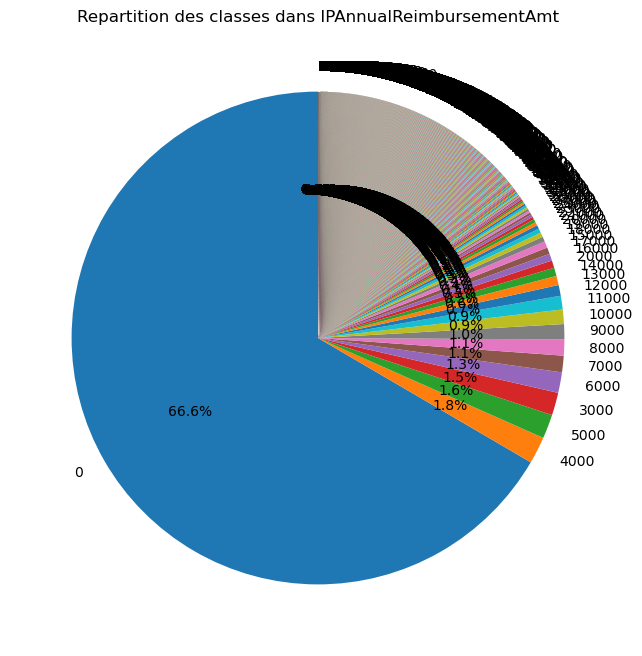

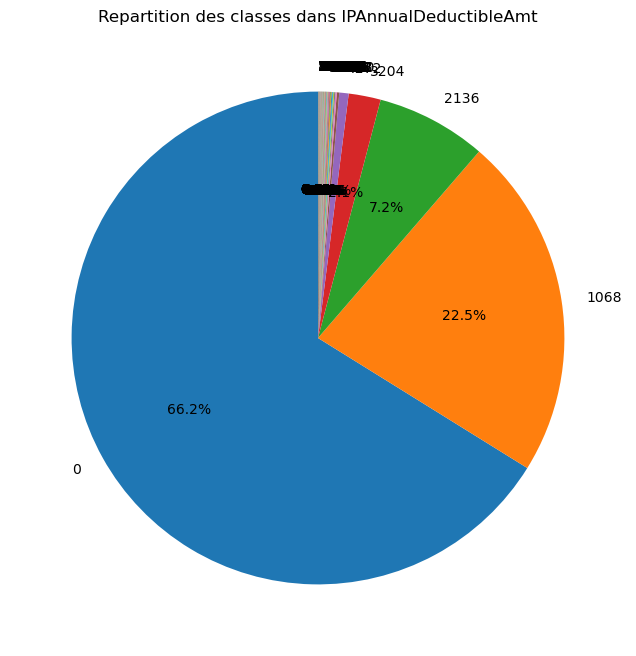

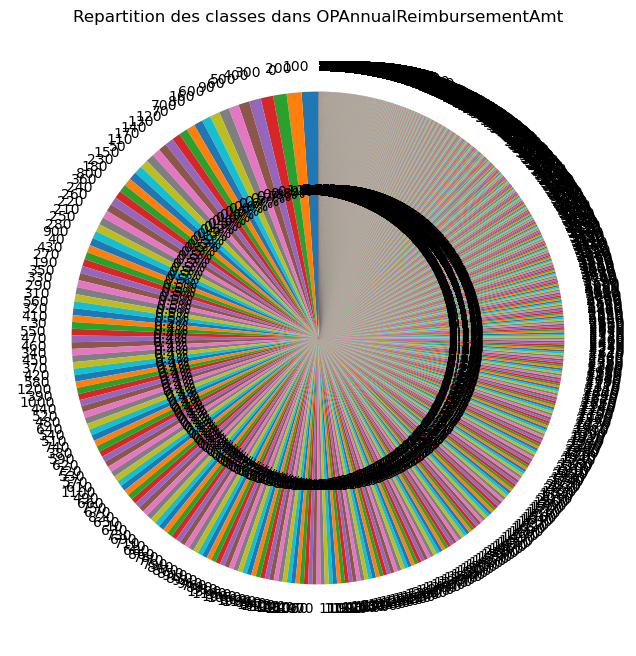

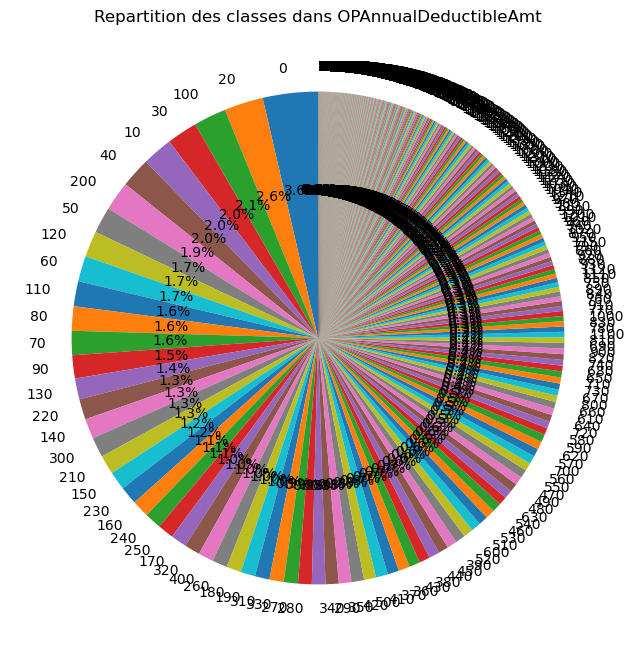

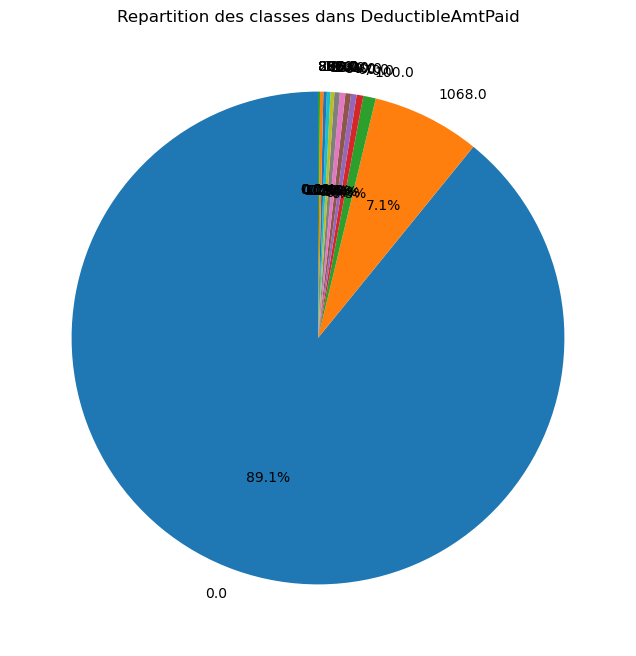

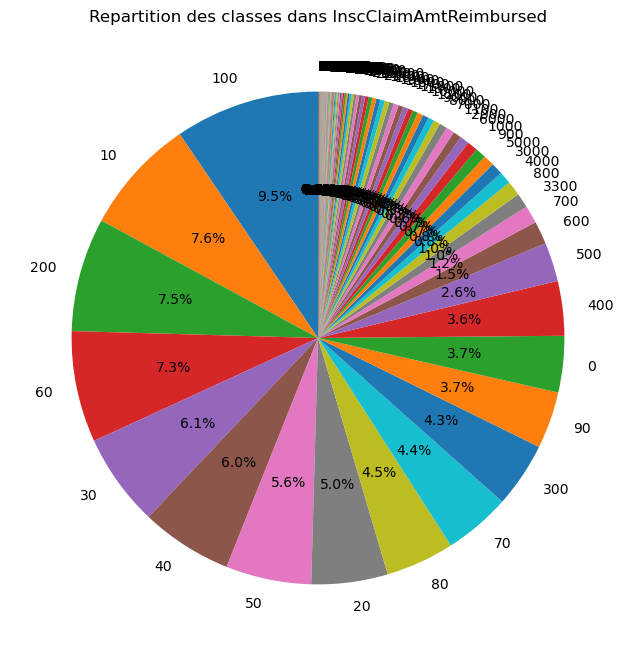

In [64]:
import matplotlib.pyplot as plt

# Colonnes à analyser
columns = ['IPAnnualReimbursementAmt', 'IPAnnualDeductibleAmt', 
           'OPAnnualReimbursementAmt', 'OPAnnualDeductibleAmt','DeductibleAmtPaid','InscClaimAmtReimbursed']

# Création d'un camembert pour chaque colonne
for col in columns:
    # Calcul de la répartition des classes (valeurs uniques)
    value_counts = data[col].value_counts()

    # Création du camembert
    plt.figure(figsize=(8, 8))
    plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.tab10.colors)

    # Titre
    plt.title(f'Repartition des classes dans {col}')
    plt.show()


C:\Users\emmad\AppData\Local\Temp\ipykernel_15024\3340788004.py:21: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\emmad\AppData\Local\Temp\ipykernel_15024\3340788004.py:21: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\emmad\AppData\Local\Temp\ipykernel_15024\3340788004.py:21: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\emmad\AppData\Local\Temp\ipykernel_15024\3340788004.py:21: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the sam

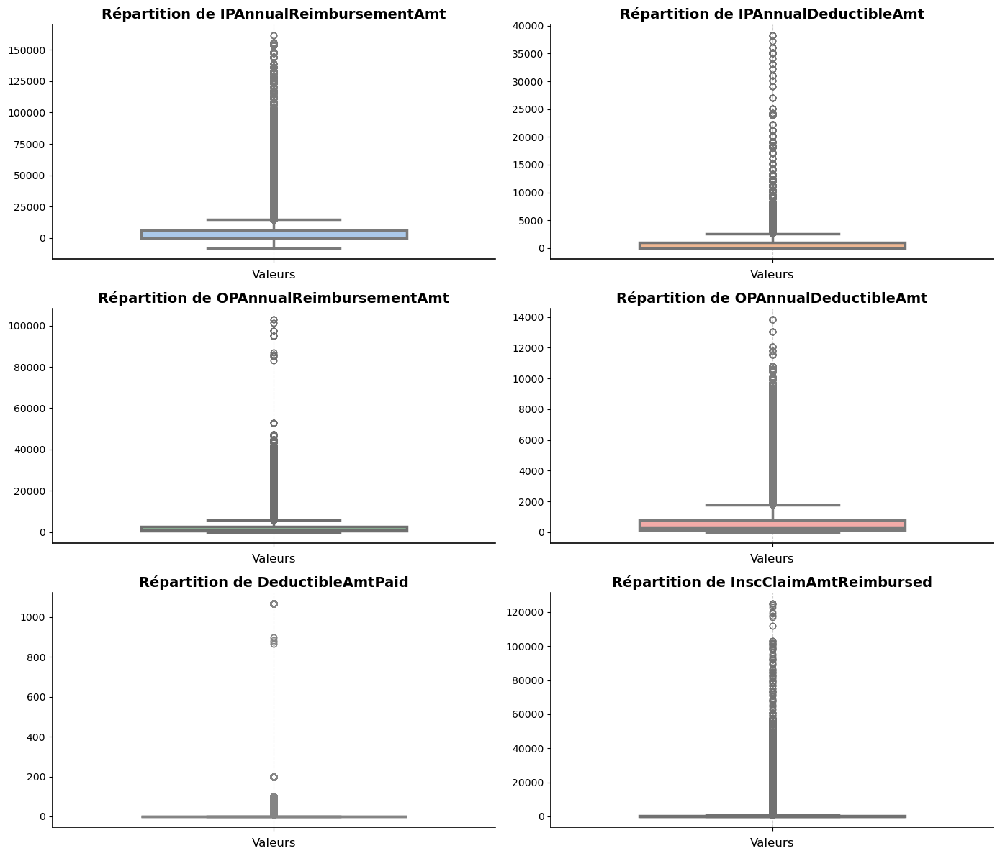

In [65]:
import matplotlib.pyplot as plt
import seaborn as sns

# Colonnes à analyser
columns = ['IPAnnualReimbursementAmt', 'IPAnnualDeductibleAmt', 
           'OPAnnualReimbursementAmt', 'OPAnnualDeductibleAmt',
           'DeductibleAmtPaid', 'InscClaimAmtReimbursed']

# Taille de la figure
fig, axes = plt.subplots(3, 2, figsize=(14, 12))  # 3 lignes, 2 colonnes

# Palette pastel pour les boxplots
palette = sns.color_palette("pastel", len(columns))

# Création des boxplots
for i, col in enumerate(columns):
    row = i // 2  # Calcul de la ligne
    col_idx = i % 2  # Calcul de la colonne
    ax = axes[row, col_idx]  # Sélectionner le subplot correspondant
    
    sns.boxplot(data=data, y=col, palette=[palette[i]], ax=ax, linewidth=2.5, width=0.6)
    
    # Titre et personnalisation de chaque subplot
    ax.set_title(f"Répartition de {col}", fontsize=14, fontweight='bold')
    ax.set_xlabel("Valeurs", fontsize=12)
    ax.set_ylabel("")
    ax.grid(axis='x', linestyle='--', alpha=0.6)
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(1.2)
    ax.spines['bottom'].set_linewidth(1.2)

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher
plt.show()


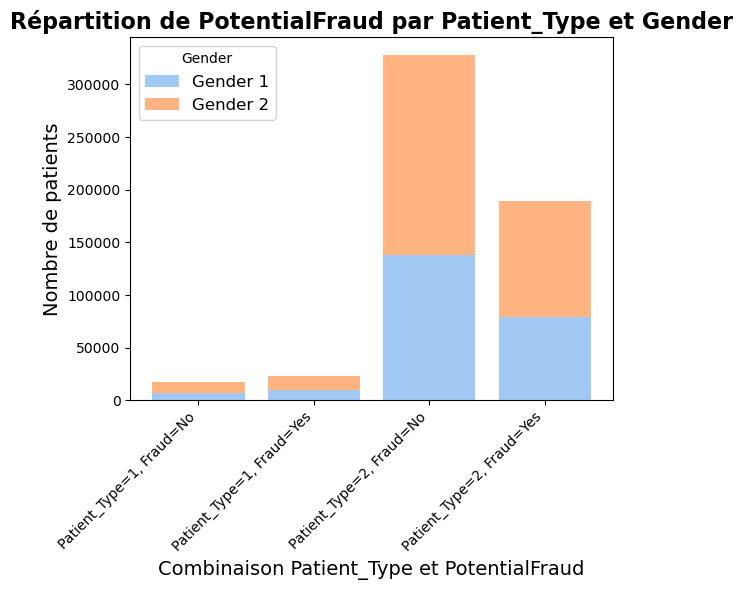

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Créer une table croisée pour résumer les données
pivot_table = data.groupby(['Patient_Type', 'PotentialFraud', 'Gender']).size().reset_index(name='Count')

# Pivot pour préparer les données pour un graphique empilé
pivot_table = pivot_table.pivot_table(index=['Patient_Type', 'PotentialFraud'], columns='Gender', values='Count', fill_value=0)

# Convertir l'index en chaîne de caractères pour éviter les erreurs
pivot_table.index = [f'Patient_Type={pt}, Fraud={pf}' for pt, pf in pivot_table.index]

# Configuration des couleurs pastel
colors = sns.color_palette("pastel", 2)  # 2 couleurs pour Gender

# Création du graphique
fig, ax = plt.subplots(figsize=(6, 6))

# Boucle pour tracer les colonnes empilées
for i, gender in enumerate(pivot_table.columns):
    ax.bar(
        pivot_table.index, 
        pivot_table[gender], 
        bottom=pivot_table.iloc[:, :i].sum(axis=1),  # Empilement des colonnes précédentes
        label=f'Gender {gender}', 
        color=colors[i]
    )

# Ajout des légendes, titres et labels
ax.set_title('Répartition de PotentialFraud par Patient_Type et Gender', fontsize=16, fontweight='bold')
ax.set_ylabel('Nombre de patients', fontsize=14)
ax.set_xlabel('Combinaison Patient_Type et PotentialFraud', fontsize=14)
ax.legend(title='Gender', fontsize=12)
ax.set_xticks(range(len(pivot_table.index)))
ax.set_xticklabels(pivot_table.index, rotation=45, ha='right', fontsize=10)

# Afficher le graphique
plt.tight_layout()
plt.show()


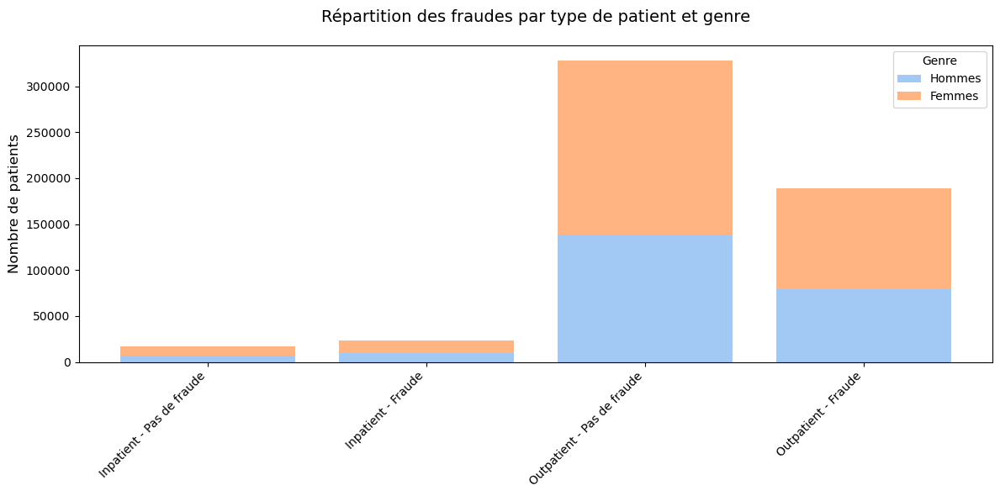

In [67]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Créer une table croisée pour résumer les données
pivot_table = data.groupby(['Patient_Type', 'PotentialFraud', 'Gender']).size().reset_index(name='Count')

# Pivot pour préparer les données pour un graphique empilé
pivot_table = pivot_table.pivot_table(index=['Patient_Type', 'PotentialFraud'], columns='Gender', values='Count', fill_value=0)

# Créer des labels plus descriptifs pour l'axe x
new_labels = []
for pt, pf in pivot_table.index:
    patient_type = "Inpatient" if pt == 1 else "Outpatient"
    fraud_status = "Fraude" if pf == "Yes" else "Pas de fraude"
    new_labels.append(f"{patient_type} - {fraud_status}")

# Mettre à jour l'index
pivot_table.index = new_labels

# Configuration des couleurs pastel
colors = sns.color_palette("pastel", 2)

# Création du graphique
fig, ax = plt.subplots(figsize=(12, 6))

# Boucle pour tracer les colonnes empilées
gender_labels = {1: 'Hommes', 2: 'Femmes'}
for i, gender in enumerate(pivot_table.columns):
    ax.bar(
        pivot_table.index, 
        pivot_table[gender], 
        bottom=pivot_table.iloc[:, :i].sum(axis=1),
        label=gender_labels[gender],
        color=colors[i]
    )

# Ajout des légendes, titres et labels
ax.set_title('Répartition des fraudes par type de patient et genre', fontsize=14, pad=20)
ax.set_ylabel('Nombre de patients', fontsize=12)
ax.legend(title='Genre', fontsize=10)

# Formatter l'axe x
plt.xticks(range(len(pivot_table.index)), pivot_table.index, rotation=45, ha='right')

# Ajuster la mise en page
plt.tight_layout()

plt.show()


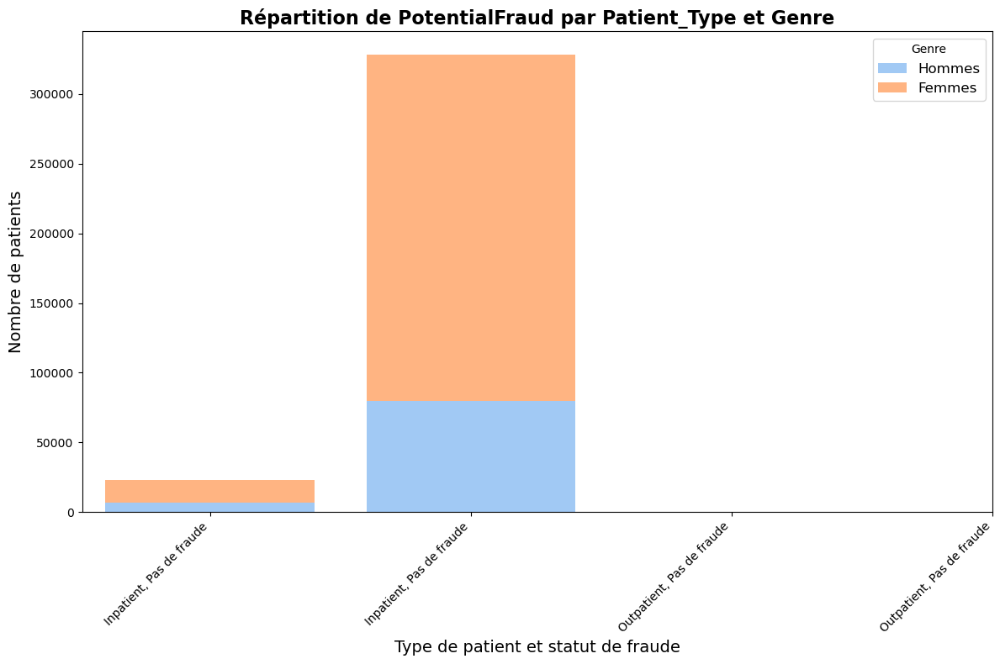

In [68]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Créer une table croisée pour résumer les données
pivot_table = data.groupby(['Patient_Type', 'PotentialFraud', 'Gender']).size().reset_index(name='Count')

# Pivot pour préparer les données pour un graphique empilé
pivot_table = pivot_table.pivot_table(index=['Patient_Type', 'PotentialFraud'], columns='Gender', values='Count', fill_value=0)

# Convertir l’index pour un format plus lisible
def format_index(row):
    patient_type = "Inpatient" if row[0] == 1 else "Outpatient"
    fraud_status = "Fraude" if row[1] == 1 else "Pas de fraude"
    return f'{patient_type}, {fraud_status}'

pivot_table.index = [format_index(idx) for idx in pivot_table.index]

# Configuration des couleurs pastel
colors = sns.color_palette("pastel", 2)  # 2 couleurs pour Gender

# Création du graphique
fig, ax = plt.subplots(figsize=(12, 8))

# Boucle pour tracer les colonnes empilées
for i, gender in enumerate(pivot_table.columns):
    label = "Hommes" if gender == 1 else "Femmes"
    ax.bar(
        pivot_table.index, 
        pivot_table[gender], 
        bottom=pivot_table.iloc[:, :i].sum(axis=1),  # Empilement des colonnes précédentes
        label=label, 
        color=colors[i]
    )

# Ajout des légendes, titres et labels
ax.set_title('Répartition de PotentialFraud par Patient_Type et Genre', fontsize=16, fontweight='bold')
ax.set_ylabel('Nombre de patients', fontsize=14)
ax.set_xlabel('Type de patient et statut de fraude', fontsize=14)
ax.legend(title='Genre', fontsize=12)
ax.set_xticks(range(len(pivot_table.index)))
ax.set_xticklabels(pivot_table.index, rotation=45, ha='right', fontsize=10)

# Afficher le graphique
plt.tight_layout()
plt.show()


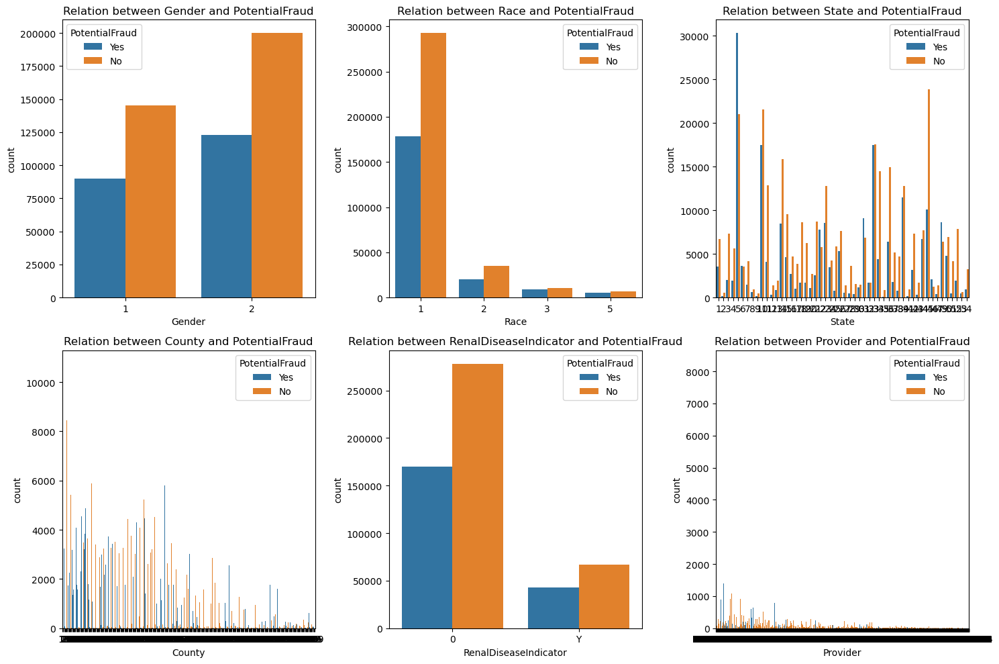

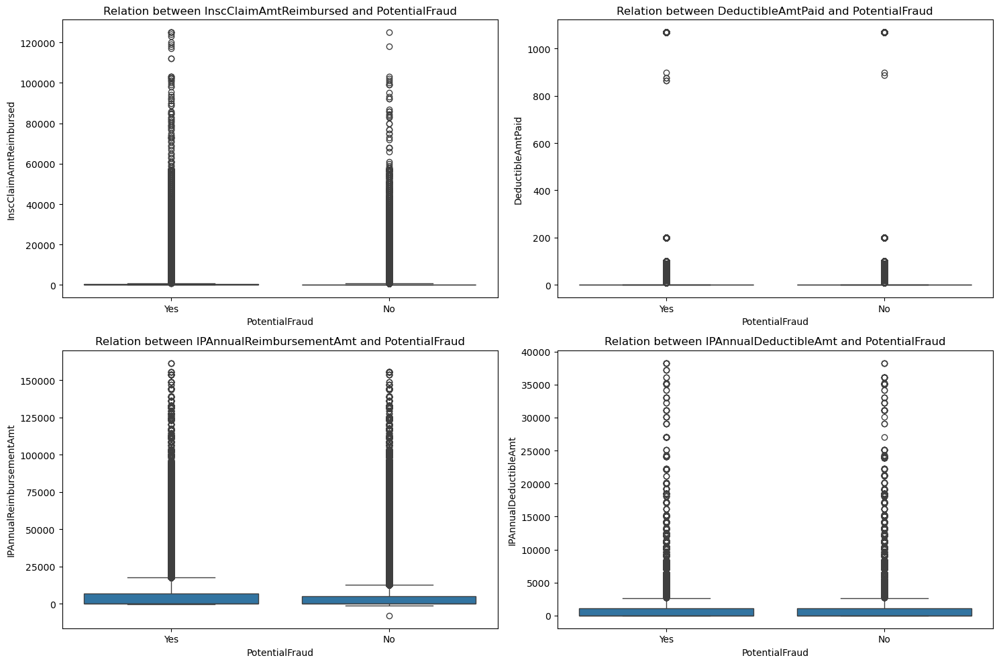

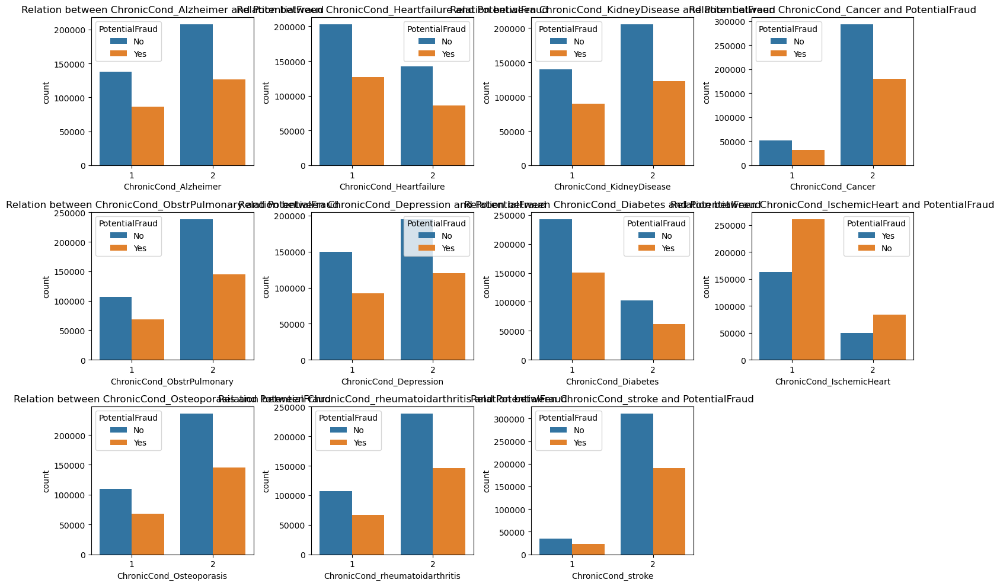

In [69]:

# 1. Bar plots pour les colonnes catégorielles
categorical_columns = ['Gender', 'Race', 'State', 'County', 'RenalDiseaseIndicator', 'Provider']

plt.figure(figsize=(15, 10))
for i, col in enumerate(categorical_columns, 1):
    plt.subplot(2, 3, i)
    sns.countplot(x=col, hue='PotentialFraud', data=data)
    plt.title(f'Relation between {col} and PotentialFraud')
plt.tight_layout()
plt.show()

# 2. Box plots pour les variables continues
continuous_columns = ['InscClaimAmtReimbursed', 'DeductibleAmtPaid', 'IPAnnualReimbursementAmt', 'IPAnnualDeductibleAmt']

plt.figure(figsize=(15, 10))
for i, col in enumerate(continuous_columns, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x='PotentialFraud', y=col, data=data)
    plt.title(f'Relation between {col} and PotentialFraud')
plt.tight_layout()
plt.show()

# 3. Bar plot pour les conditions chroniques binaires
chronic_columns = [
    'ChronicCond_Alzheimer', 'ChronicCond_Heartfailure', 'ChronicCond_KidneyDisease', 
    'ChronicCond_Cancer', 'ChronicCond_ObstrPulmonary', 'ChronicCond_Depression', 
    'ChronicCond_Diabetes', 'ChronicCond_IschemicHeart', 'ChronicCond_Osteoporasis', 
    'ChronicCond_rheumatoidarthritis', 'ChronicCond_stroke'
]

plt.figure(figsize=(15, 10))
for i, col in enumerate(chronic_columns, 1):
    plt.subplot(3, 4, i)
    sns.countplot(x=col, hue='PotentialFraud', data=data)
    plt.title(f'Relation between {col} and PotentialFraud')
plt.tight_layout()
plt.show()


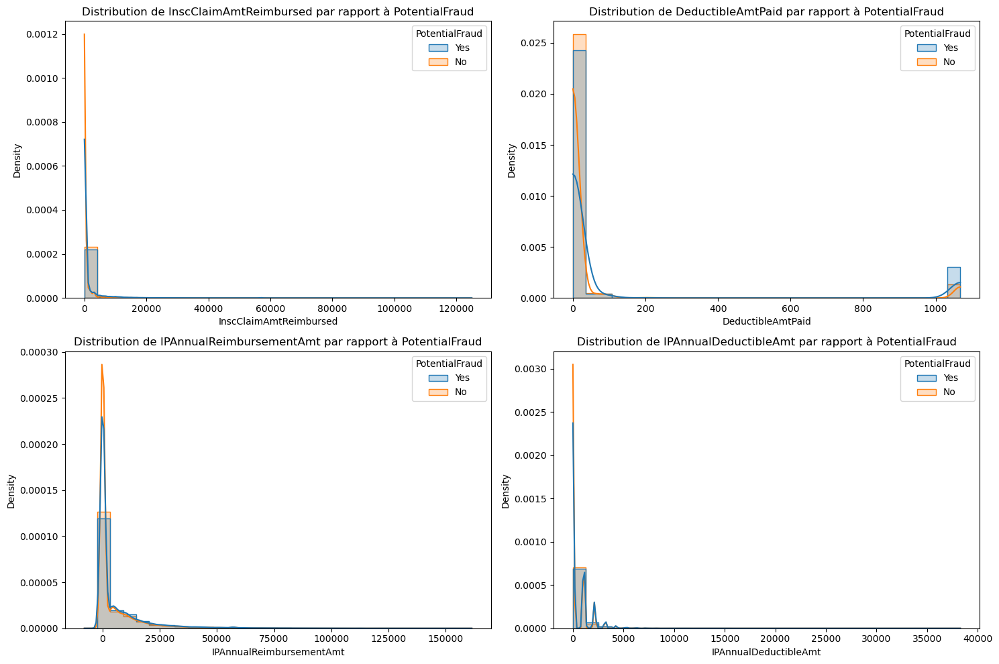

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Supposons que 'data' soit votre dataframe

# Liste des colonnes continues
continuous_columns = ['InscClaimAmtReimbursed', 'DeductibleAmtPaid', 'IPAnnualReimbursementAmt', 'IPAnnualDeductibleAmt']

plt.figure(figsize=(15, 10))

# 1. Histogrammes avec courbes de distribution pour les variables continues
for i, col in enumerate(continuous_columns, 1):
    plt.subplot(2, 2, i)
    
    # Tracer l'histogramme avec la courbe de densité pour chaque valeur de 'PotentialFraud'
    sns.histplot(data=data, x=col, hue='PotentialFraud', kde=True, bins=30, element="step", stat="density", common_norm=False)
    
    # Titre et labels
    plt.title(f'Distribution de {col} par rapport à PotentialFraud')
    plt.xlabel(col)
    plt.ylabel('Density')
    
plt.tight_layout()
plt.show()


In [71]:
data.dtypes

BeneID                              object
ClaimID                             object
Provider                            object
InscClaimAmtReimbursed               int64
DeductibleAmtPaid                  float64
Patient_Type                         int64
DOB                                 object
Gender                               int64
Race                                 int64
RenalDiseaseIndicator               object
State                                int64
County                               int64
NoOfMonths_PartACov                  int64
NoOfMonths_PartBCov                  int64
ChronicCond_Alzheimer                int64
ChronicCond_Heartfailure             int64
ChronicCond_KidneyDisease            int64
ChronicCond_Cancer                   int64
ChronicCond_ObstrPulmonary           int64
ChronicCond_Depression               int64
ChronicCond_Diabetes                 int64
ChronicCond_IschemicHeart            int64
ChronicCond_Osteoporasis             int64
ChronicCond

In [72]:
import plotly.express as px
# Calcul de la part de fraudes par état
fraud_ratios = data.groupby('State')['PotentialFraud'].apply(lambda x: (x == 'Yes').mean() * 100).reset_index()
fraud_ratios.columns = ['State', 'FraudRatio']

# Mapping avec codes à 2 lettres
state_mapping = {
    1: 'AL', 2: 'AK', 3: 'AZ', 4: 'AR', 5: 'CA', 6: 'CO',
    7: 'CT', 8: 'DE', 9: 'FL', 10: 'GA', 11: 'HI', 12: 'ID',
    13: 'IL', 14: 'IN', 15: 'IA', 16: 'KS', 17: 'KY', 18: 'LA',
    19: 'ME', 20: 'MD', 21: 'MA', 22: 'MI', 23: 'MN', 24: 'MS',
    25: 'MO', 26: 'MT', 27: 'NE', 28: 'NV', 29: 'NH', 30: 'NJ',
    31: 'NM', 32: 'NY', 33: 'NC', 34: 'ND', 35: 'OH', 36: 'OK',
    37: 'OR', 38: 'PA', 39: 'RI', 40: 'SC', 41: 'SD', 42: 'TN',
    43: 'TX', 44: 'UT', 45: 'VT', 46: 'VA', 47: 'WA', 48: 'WV',
    49: 'WI', 50: 'WY', 51: 'DC', 52: 'PR', 53: 'GU', 54: 'VI'
}

fraud_ratios['State_Code'] = fraud_ratios['State'].map(state_mapping)

# Création de la carte avec les codes d'état
fig = px.choropleth(
    fraud_ratios,
    locations='State_Code',
    locationmode='USA-states',
    color='FraudRatio',
    color_continuous_scale='Reds',
    scope='usa',
    title='Part des fraudes potentielles par état (%)',
    labels={'FraudRatio': 'Part de fraudes (%)'}
)

fig.update_layout(
    width=700,
    geo=dict(lakecolor='rgb(255, 255, 255)'),
    coloraxis_colorbar=dict(
        title="Part de fraudes",
        ticksuffix="%"
    )
)

fig.show()

In [73]:
# Compter le nombre de lignes par état
state_counts = data.groupby('State').size().reset_index()
state_counts.columns = ['State', 'Count']

# Utiliser le même mapping d'états
state_mapping = {
    1: 'AL', 2: 'AK', 3: 'AZ', 4: 'AR', 5: 'CA', 6: 'CO',
    7: 'CT', 8: 'DE', 9: 'FL', 10: 'GA', 11: 'HI', 12: 'ID',
    13: 'IL', 14: 'IN', 15: 'IA', 16: 'KS', 17: 'KY', 18: 'LA',
    19: 'ME', 20: 'MD', 21: 'MA', 22: 'MI', 23: 'MN', 24: 'MS',
    25: 'MO', 26: 'MT', 27: 'NE', 28: 'NV', 29: 'NH', 30: 'NJ',
    31: 'NM', 32: 'NY', 33: 'NC', 34: 'ND', 35: 'OH', 36: 'OK',
    37: 'OR', 38: 'PA', 39: 'RI', 40: 'SC', 41: 'SD', 42: 'TN',
    43: 'TX', 44: 'UT', 45: 'VT', 46: 'VA', 47: 'WA', 48: 'WV',
    49: 'WI', 50: 'WY', 51: 'DC', 52: 'PR', 53: 'GU', 54: 'VI'
}

state_counts['State_Code'] = state_counts['State'].map(state_mapping)

# Création de la carte
fig = px.choropleth(
    state_counts,
    locations='State_Code',
    locationmode='USA-states',
    color='Count',
    color_continuous_scale='Viridis',  # vous pouvez changer l'échelle de couleur
    scope='usa',
    title='Nombre de cas par état',
    labels={'Count': 'Nombre de cas'}
)

fig.update_layout(
    width=800,
    geo=dict(lakecolor='rgb(255, 255, 255)'),
    coloraxis_colorbar=dict(
        title="Nombre de cas"
    )
)

fig.show()

In [74]:
# Calculer la répartition des valeurs de PotentialFraud pour chaque catégorie de State
fraud_distribution_by_state = data.groupby('State')['PotentialFraud'].value_counts(normalize=True).unstack() * 100

# Renommer les colonnes pour plus de clarté
fraud_distribution_by_state.columns = ['No_Fraud_Percentage', 'Fraud_Percentage']

# Ajouter une colonne pour le total des échantillons par état (facultatif)
fraud_distribution_by_state['Total_Count'] = data['State'].value_counts()

# Trier les résultats par pourcentage de fraude décroissant
fraud_distribution_by_state_sorted = fraud_distribution_by_state.sort_values(by='Fraud_Percentage', ascending=False)

# Afficher le résultat
print(fraud_distribution_by_state_sorted)


       No_Fraud_Percentage  Fraud_Percentage  Total_Count
State                                                    
46               37.178350         62.821650         3381
5                40.925024         59.074976        51350
49               42.568514         57.431486        14997
22               42.762772         57.237228        13624
31               42.835634         57.164366        15940
6                49.083333         50.916667         7200
32               49.681713         50.318287         3456
33               50.057104         49.942896        35024
39               52.793699         47.206301        24251
44               53.467887         46.532113        14418
10               55.181327         44.818673        39073
24               55.306756         44.693244         7726
30               55.388093         44.611907         2654
53               56.466302         43.533698         1098
26               58.941987         41.058013        12911
50            

Pour regrouper les États en niveaux de risque (par exemple, faible, moyen, élevé) et réduire le nombre de classes pour améliorer le modèle, il est crucial de prendre en compte à la fois :

    Le pourcentage de fraudes (Fraud_Percentage) : Un indicateur direct du risque de fraude pour un État.
    Le nombre total de données (Total_Count) : Si un État a peu de données, il peut être moins représentatif et moins fiable pour prédire le risque.

Proposition de stratégie :

    Création des classes de risque :
        Calculer une pondération basée sur Fraud_Percentage et Total_Count pour refléter à la fois le taux de fraude et l'importance de l'échantillon.
        Par exemple : Pondération = Fraud_Percentage * log(Total_Count) (logarithme pour réduire l'effet des grands échantillons).

code qui classe correctement les États en 4 niveaux de risque (1 = faible, 4 = élevé) selon leur score de risque (Risk_Score), qui est basé sur le pourcentage de fraude (Fraud_Percentage) pondéré par le nombre total de données (Total_Count).
Points importants :

    Risk_Score : Pondération calculée comme Fraud_Percentage * log(Total_Count + 1).
    Risk_Level : Classement en 4 niveaux de risque :
        1 : Faible risque
        2 : Risque modéré
        3 : Risque élevé
        4 : Très élevé risque

In [77]:

# Réinitialiser l'index pour transformer State en colonne
fraud_distribution_by_state_sorted.reset_index(inplace=True)

# Charger les données (tableau importé précédemment)
data_risk = fraud_distribution_by_state_sorted.copy()

# Créer une pondération combinant Fraud_Percentage et Total_Count
data_risk['Risk_Score'] = data_risk['Fraud_Percentage'] * np.log1p(data_risk['Total_Count'])

# Utiliser des quantiles pour classer les États en 3 groupes de risque
data_risk['StateRisk'] = pd.qcut(data_risk['Risk_Score'], q=4, labels=[1,2,3,4])


In [78]:
data_risk.drop(['No_Fraud_Percentage','Fraud_Percentage','Total_Count','Risk_Score'], axis=1, inplace=True, errors='ignore')

data_risk

,State,StateRisk
0,46,4
1,5,4
2,49,4
3,22,4
4,31,4
5,6,4
6,32,4
7,33,4
8,39,4
9,44,4


In [79]:
data_risk.columns

Index(['State', 'StateRisk'], dtype='object')

**Remplacement de la colonne State par StateRisk**

In [81]:


data = pd.merge(data, data_risk, on='State', how='left')

In [82]:
test = data[data['State'] == 46][['State', 'PotentialFraud', 'StateRisk']]
test
test.describe(include='all')

,State,PotentialFraud,StateRisk
count,3381.0,3381,3381.0
unique,NaN,2,1.0
top,NaN,Yes,4.0
freq,NaN,2124,3381.0
mean,46.0,NaN,NaN
std,0.0,NaN,NaN
min,46.0,NaN,NaN
25%,46.0,NaN,NaN
50%,46.0,NaN,NaN
75%,46.0,NaN,NaN


In [83]:
data.drop(['State'], axis=1, inplace=True, errors='ignore')

In [84]:
# Calculer la répartition des valeurs de PotentialFraud pour chaque catégorie de State
fraud_distribution_by_state2 = data.groupby('StateRisk')['PotentialFraud'].value_counts(normalize=True).unstack() * 100

# Renommer les colonnes pour plus de clarté
fraud_distribution_by_state2.columns = ['No_Fraud_Percentage', 'Fraud_Percentage']

# Ajouter une colonne pour le total des échantillons par état (facultatif)
fraud_distribution_by_state2['Total_Count'] = data['StateRisk'].value_counts()

# Trier les résultats par pourcentage de fraude décroissant
fraud_distribution_by_state_sorted2 = fraud_distribution_by_state2.sort_values(by='Fraud_Percentage', ascending=False)

# Afficher le résultat
print(fraud_distribution_by_state_sorted2)


           No_Fraud_Percentage  Fraud_Percentage  Total_Count
StateRisk                                                    
4                    48.948499         51.051501       251783
3                    66.212402         33.787598       154829
2                    76.014829         23.985171        96026
1                    83.963435         16.036565        55573


C:\Users\emmad\AppData\Local\Temp\ipykernel_15024\2942244609.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [85]:
# Calculer la répartition des valeurs de PotentialFraud pour chaque catégorie de county
fraud_distribution_by_County = data.groupby('County')['PotentialFraud'].value_counts(normalize=True).unstack() * 100

# Renommer les colonnes pour plus de clarté
fraud_distribution_by_County.columns = ['No_Fraud_Percentage', 'Fraud_Percentage']

# Ajouter une colonne pour le total des échantillons par état (facultatif)
fraud_distribution_by_County['Total_Count'] = data['County'].value_counts()

# Trier les résultats par pourcentage de fraude décroissant
fraud_distribution_by_County_sorted = fraud_distribution_by_County.sort_values(by='Fraud_Percentage', ascending=False)

# Afficher le résultat
fraud_distribution_by_County_sorted


,No_Fraud_Percentage,Fraud_Percentage,Total_Count
County,,,
14,NaN,100.000000,6
834,NaN,100.000000,1
876,NaN,100.000000,4
891,3.200000,96.800000,125
564,7.329843,92.670157,382
...,...,...,...
904,100.000000,NaN,15
905,100.000000,NaN,21
912,100.000000,NaN,11


In [86]:
test = fraud_distribution_by_County_sorted[(fraud_distribution_by_County_sorted['Fraud_Percentage'].notna()) & (fraud_distribution_by_County_sorted['Fraud_Percentage'] != 100)]


In [87]:
test

,No_Fraud_Percentage,Fraud_Percentage,Total_Count
County,,,
891,3.200000,96.800000,125
564,7.329843,92.670157,382
641,11.515152,88.484848,330
194,12.313433,87.686567,268
621,13.333333,86.666667,60
...,...,...,...
902,97.777778,2.222222,45
831,97.802198,2.197802,91
884,97.826087,2.173913,46


In [88]:

# Réinitialiser l'index pour transformer County en colonne
fraud_distribution_by_County_sorted.reset_index(inplace=True)

# Charger les données (tableau importé précédemment)
data_riskCounty = fraud_distribution_by_County_sorted.copy()

# Remplacer les NaN par 0 dans les colonnes spécifiques
data_riskCounty[['No_Fraud_Percentage', 'Fraud_Percentage', 'Total_Count']] = data_riskCounty[['No_Fraud_Percentage', 'Fraud_Percentage', 'Total_Count']].fillna(0)


# Créer une pondération combinant Fraud_Percentage et Total_Count
data_riskCounty['Risk_Score'] = data_riskCounty['Fraud_Percentage'] * np.log1p(data_riskCounty['Total_Count'])

# Utiliser des quantiles pour classer les comtés en 4 groupes de risque
data_riskCounty['CountyRisk'] = pd.qcut(data_riskCounty['Risk_Score'], q=4, labels=[1, 2, 3, 4])


In [89]:
data_riskCounty

,County,No_Fraud_Percentage,Fraud_Percentage,Total_Count,Risk_Score,CountyRisk
0,14,0.000000,100.000000,6,194.591015,3
1,834,0.000000,100.000000,1,69.314718,2
2,876,0.000000,100.000000,4,160.943791,3
3,891,3.200000,96.800000,125,468.152089,4
4,564,7.329843,92.670157,382,551.205337,4
...,...,...,...,...,...,...
309,904,100.000000,0.000000,15,0.000000,1
310,905,100.000000,0.000000,21,0.000000,1
311,912,100.000000,0.000000,11,0.000000,1
312,944,100.000000,0.000000,2,0.000000,1


In [90]:


data = pd.merge(data, data_riskCounty, on='County', how='left')

In [91]:
data.drop(['County'], axis=1, inplace=True, errors='ignore')

In [92]:
# Calculer la répartition des valeurs de PotentialFraud pour chaque catégorie de State
fraud_distribution_by_County2 = data.groupby('CountyRisk')['PotentialFraud'].value_counts(normalize=True).unstack() * 100

# Renommer les colonnes pour plus de clarté
fraud_distribution_by_County2.columns = ['No_Fraud_Percentage', 'Fraud_Percentage']

# Ajouter une colonne pour le total des échantillons par état (facultatif)
fraud_distribution_by_County2['Total_Count'] = data['CountyRisk'].value_counts()

# Trier les résultats par pourcentage de fraude décroissant
fraud_distribution_by_state_sortedCounty2 = fraud_distribution_by_County2.sort_values(by='Fraud_Percentage', ascending=False)

# Afficher le résultat
print(fraud_distribution_by_state_sortedCounty2)


            No_Fraud_Percentage  Fraud_Percentage  Total_Count
CountyRisk                                                    
4                     54.639198         45.360802       357066
3                     73.410075         26.589925       184081
2                     86.314979         13.685021        12985
1                     97.450355          2.549645         4079


C:\Users\emmad\AppData\Local\Temp\ipykernel_15024\3675396421.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [93]:
data.drop(['County'], axis=1, inplace=True, errors='ignore')

In [94]:
data

,BeneID,ClaimID,Provider,InscClaimAmtReimbursed,DeductibleAmtPaid,Patient_Type,DOB,Gender,Race,RenalDiseaseIndicator,...,PotentialFraud,NbDiagnosis,MoisAnnee,DureeClaim,StateRisk,No_Fraud_Percentage,Fraud_Percentage,Total_Count,Risk_Score,CountyRisk
0,BENE100000,CLM126832,PRV57172,50,0.0,2,1938-03-01,1,1,0,...,Yes,1,January 2009,1,4,58.862357,41.137643,5151,351.609207,4
1,BENE100000,CLM351838,PRV57172,70,0.0,2,1938-03-01,1,1,0,...,Yes,1,May 2009,1,4,58.862357,41.137643,5151,351.609207,4
2,BENE100001,CLM229075,PRV55158,70,0.0,2,1939-08-01,1,1,0,...,No,1,March 2009,1,4,63.936115,36.063885,5823,312.664596,4
3,BENE100001,CLM258631,PRV54966,70,0.0,2,1939-08-01,1,1,0,...,Yes,2,March 2009,1,4,63.936115,36.063885,5823,312.664596,4
4,BENE100001,CLM332544,PRV54890,90,0.0,2,1939-08-01,1,1,0,...,No,9,April 2009,3,4,63.936115,36.063885,5823,312.664596,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
558206,BENE99999,CLM359214,PRV55826,80,0.0,2,1936-05-01,2,1,0,...,No,2,May 2009,1,1,60.317952,39.682048,9687,364.227364,4
558207,BENE99999,CLM475422,PRV54670,80,0.0,2,1936-05-01,2,1,0,...,No,1,July 2009,1,1,60.317952,39.682048,9687,364.227364,4
558208,BENE99999,CLM591853,PRV57336,30,0.0,2,1936-05-01,2,1,0,...,No,1,September 2009,1,1,60.317952,39.682048,9687,364.227364,4
558209,BENE99999,CLM712394,PRV51690,700,0.0,2,1936-05-01,2,1,0,...,No,1,December 2009,1,1,60.317952,39.682048,9687,364.227364,4


Pour **Provider**:

In [96]:
# Calculer la répartition des valeurs de PotentialFraud pour chaque catégorie de Provider
fraud_distribution_by_provider = data.groupby('Provider')['PotentialFraud'].value_counts(normalize=True).unstack() * 100

# Renommer les colonnes pour plus de clarté
fraud_distribution_by_provider.columns = ['No_Fraud_Percentage', 'Fraud_Percentage']

# Ajouter une colonne pour le total des échantillons par provider (facultatif)
fraud_distribution_by_provider['Total_Count'] = data['Provider'].value_counts()

# Trier les résultats par pourcentage de fraude décroissant
fraud_distribution_by_provider_sorted = fraud_distribution_by_provider.sort_values(by='Fraud_Percentage', ascending=False)

# Afficher le résultat
print(fraud_distribution_by_provider_sorted)


          No_Fraud_Percentage  Fraud_Percentage  Total_Count
Provider                                                    
PRV51003                  NaN             100.0          132
PRV55374                  NaN             100.0           33
PRV55492                  NaN             100.0           42
PRV55483                  NaN             100.0           76
PRV55482                  NaN             100.0           83
...                       ...               ...          ...
PRV57759                100.0               NaN           28
PRV57760                100.0               NaN           22
PRV57761                100.0               NaN           82
PRV57762                100.0               NaN            1
PRV57763                100.0               NaN          118

[5410 rows x 3 columns]


In [97]:
# Exclure les lignes où Fraud_Percentage == 100 ou No_Fraud_Percentage == 100
# puis enlever celles qui ont des NaN (ce sont les 100% masqués)
filtered_providers = fraud_distribution_by_provider_sorted[
    (fraud_distribution_by_provider_sorted['Fraud_Percentage'] != 100) &
    (fraud_distribution_by_provider_sorted['No_Fraud_Percentage'] != 100)
].dropna()

print(filtered_providers)

Empty DataFrame
Columns: [No_Fraud_Percentage, Fraud_Percentage, Total_Count]
Index: []


Tous les providers ont toujours soit 100% de fraudes dans l'historique, soit 0% de fraude. On fdéfinit un **dictionnaire**:

In [99]:
# Remplacer NaN par 0
df_filled = fraud_distribution_by_provider_sorted.fillna(0)

# Créer le dictionnaire
provider_dict = {}
for provider, row in df_filled.iterrows():
    if row['Fraud_Percentage'] == 100:
        provider_dict[provider] = 1
    elif row['Fraud_Percentage'] == 0:
        provider_dict[provider] = 0
    # Si vous souhaitez ignorer les valeurs intermédiaires (entre 0 et 100),
    # on ne fait rien dans ce else.

#print(provider_dict)


In [100]:


# Ajouter la colonne 'CodeProvider' à 'data' en mappant chaque Provider à son code
data['CodeProvider'] = data['Provider'].map(provider_dict)


In [101]:
data.drop(['Provider','BeneID','ClaimID','DOB'], axis=1, inplace=True, errors='ignore')

In [102]:
#data

In [103]:
data['PotentialFraud'] = data['PotentialFraud'].map({'Yes': 1, 'No': 0})


In [104]:
#data

In [105]:
#data.dtypes

In [106]:
data[data['RenalDiseaseIndicator'].isin(["0", "Y"])]['RenalDiseaseIndicator']


0         0
1         0
2         0
3         0
4         0
         ..
558206    0
558207    0
558208    0
558209    0
558210    0
Name: RenalDiseaseIndicator, Length: 558211, dtype: object

In [107]:
data['RenalDiseaseIndicator'] = data['RenalDiseaseIndicator'].map({'0': 0, 'Y': 1})


In [108]:
data.dtypes

InscClaimAmtReimbursed                int64
DeductibleAmtPaid                   float64
Patient_Type                          int64
Gender                                int64
Race                                  int64
RenalDiseaseIndicator                 int64
NoOfMonths_PartACov                   int64
NoOfMonths_PartBCov                   int64
ChronicCond_Alzheimer                 int64
ChronicCond_Heartfailure              int64
ChronicCond_KidneyDisease             int64
ChronicCond_Cancer                    int64
ChronicCond_ObstrPulmonary            int64
ChronicCond_Depression                int64
ChronicCond_Diabetes                  int64
ChronicCond_IschemicHeart             int64
ChronicCond_Osteoporasis              int64
ChronicCond_rheumatoidarthritis       int64
ChronicCond_stroke                    int64
IPAnnualReimbursementAmt              int64
IPAnnualDeductibleAmt                 int64
OPAnnualReimbursementAmt              int64
OPAnnualDeductibleAmt           

In [109]:
data.drop(['MoisAnnee','No_Fraud_Percentage','Fraud_Percentage','Total_Count','Risk_Score'], axis=1, inplace=True, errors='ignore')

In [110]:
## Graph pour state Risk

In [111]:
import plotly.express as px

# Mapping avec codes à 2 lettres pour les états
state_mapping = {
    1: 'AL', 2: 'AK', 3: 'AZ', 4: 'AR', 5: 'CA', 6: 'CO',
    7: 'CT', 8: 'DE', 9: 'FL', 10: 'GA', 11: 'HI', 12: 'ID',
    13: 'IL', 14: 'IN', 15: 'IA', 16: 'KS', 17: 'KY', 18: 'LA',
    19: 'ME', 20: 'MD', 21: 'MA', 22: 'MI', 23: 'MN', 24: 'MS',
    25: 'MO', 26: 'MT', 27: 'NE', 28: 'NV', 29: 'NH', 30: 'NJ',
    31: 'NM', 32: 'NY', 33: 'NC', 34: 'ND', 35: 'OH', 36: 'OK',
    37: 'OR', 38: 'PA', 39: 'RI', 40: 'SC', 41: 'SD', 42: 'TN',
    43: 'TX', 44: 'UT', 45: 'VT', 46: 'VA', 47: 'WA', 48: 'WV',
    49: 'WI', 50: 'WY', 51: 'DC', 52: 'PR', 53: 'GU', 54: 'VI'
}

# Ajouter les codes des états (State_Code) à data_risk
data_risk['State_Code'] = data_risk['State'].map(state_mapping)

# Créer une carte choroplèthe avec les couleurs associées à StateRisk
fig = px.choropleth(
    data_risk,
    locations='State_Code',
    locationmode='USA-states',
    color='StateRisk',
    color_continuous_scale='Viridis',  # Palette de couleurs adaptée
    scope='usa',
    title='Niveau de risque par état (StateRisk)',
    labels={'StateRisk': 'Niveau de risque'}
)

# Mise à jour de l'affichage
fig.update_layout(
    width=800,
    geo=dict(lakecolor='rgb(255, 255, 255)'),
    coloraxis_colorbar=dict(
        title="Niveau de risque"
    )
)

# Afficher la carte
fig.show()


In [112]:
import plotly.express as px

# Mapping avec codes à 2 lettres pour les états
state_mapping = {
    1: 'AL', 2: 'AK', 3: 'AZ', 4: 'AR', 5: 'CA', 6: 'CO',
    7: 'CT', 8: 'DE', 9: 'FL', 10: 'GA', 11: 'HI', 12: 'ID',
    13: 'IL', 14: 'IN', 15: 'IA', 16: 'KS', 17: 'KY', 18: 'LA',
    19: 'ME', 20: 'MD', 21: 'MA', 22: 'MI', 23: 'MN', 24: 'MS',
    25: 'MO', 26: 'MT', 27: 'NE', 28: 'NV', 29: 'NH', 30: 'NJ',
    31: 'NM', 32: 'NY', 33: 'NC', 34: 'ND', 35: 'OH', 36: 'OK',
    37: 'OR', 38: 'PA', 39: 'RI', 40: 'SC', 41: 'SD', 42: 'TN',
    43: 'TX', 44: 'UT', 45: 'VT', 46: 'VA', 47: 'WA', 48: 'WV',
    49: 'WI', 50: 'WY', 51: 'DC', 52: 'PR', 53: 'GU', 54: 'VI'
}

# Ajouter les codes des états (State_Code) à data_risk
data_risk['State_Code'] = data_risk['State'].map(state_mapping)

# Mapping des couleurs associées à chaque niveau de risque
risk_colors = {
    1: 'limegreen',    # Vert pour faible risque
    2: 'orange',   # Orange pour risque modéré
    3: 'red',      # Rouge pour risque élevé
    4: 'purple'    # Violet pour risque critique
}

# Ajout d'une colonne avec les couleurs associées
data_risk['Risk_Color'] = data_risk['StateRisk'].map(risk_colors)

# Création de la carte avec les couleurs associées aux niveaux de risque
fig = px.choropleth(
    data_risk,
    locations='State_Code',
    locationmode='USA-states',
    color='StateRisk',  # Utilisation de StateRisk pour la légende
    color_discrete_map=risk_colors,  # Application des couleurs fixes
    scope='usa',
    title='Niveau de risque par état (StateRisk)',
    labels={'StateRisk': 'Niveau de risque'}
)

# Mise à jour des paramètres de la carte
fig.update_layout(
    width=800,
    geo=dict(lakecolor='rgb(255, 255, 255)'),
    coloraxis_showscale=False  # Désactiver l'échelle continue pour des couleurs fixes
)

# Afficher la carte
fig.show()


# Selection des variables

In [114]:
data.drop(['CodeProvider'], axis=1, inplace=True, errors='ignore')

In [115]:
# On supprime code provider car sinon on sait immédiatement s'il y a fraude ou pas

# Division des données en ensembles d'entraînement et de test

In [117]:
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objects as go

# Calcul des pourcentages pour PotentialFraud
fraud_counts = data['PotentialFraud'].value_counts()
fraud_percentages = (fraud_counts / len(data) * 100).round(2)

# Calcul des pourcentages pour Patient_Type
patient_counts = data['Patient_Type'].value_counts()
patient_percentages = (patient_counts / len(data) * 100).round(2)

# Création des deux subplots séparés
fig = sp.make_subplots(rows=1, cols=2, 
                     specs=[[{'type':'pie'}, {'type':'pie'}]],
                     subplot_titles=("Distribution des fraudes", "Distribution des types de patients"))

# Camembert pour PotentialFraud
fig.add_trace(
   go.Pie(
       labels=fraud_counts.index,
       values=fraud_percentages,
       textinfo='label+percent',
       hoverinfo='label+percent',
       marker=dict(colors=['#FF0000', '#E0E0E0']),
       domain={'column': 0}
   ),
   row=1, col=1
)

# Camembert pour Patient_Type
fig.add_trace(
   go.Pie(
       labels=patient_counts.index,
       values=patient_percentages,
       textinfo='label+percent',
       hoverinfo='label+percent',
       marker=dict(colors=['#0000FF', '#90EE90']),
       domain={'column': 1}
   ),
   row=1, col=2
)

# Mise à jour du layout
fig.update_layout(
   width=1000,
   height=500,
   showlegend=False  # Désactive la légende globale
)

fig.show()

In [118]:
X = data.drop(columns='PotentialFraud')
y = data['PotentialFraud']

In [119]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2002) #seed

# Modèles

## Librairies

C:\Users\emmad\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Temps d'inférence moyen par échantillon : 0.31 µs


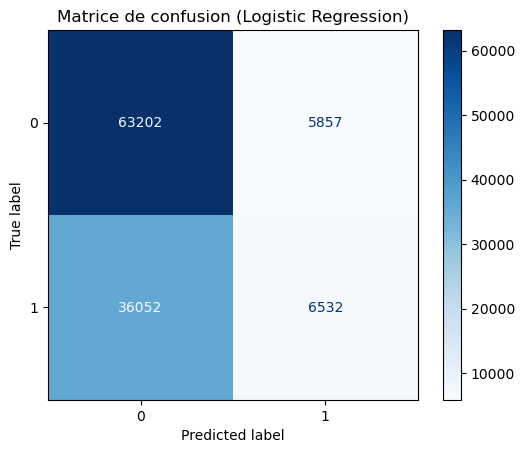

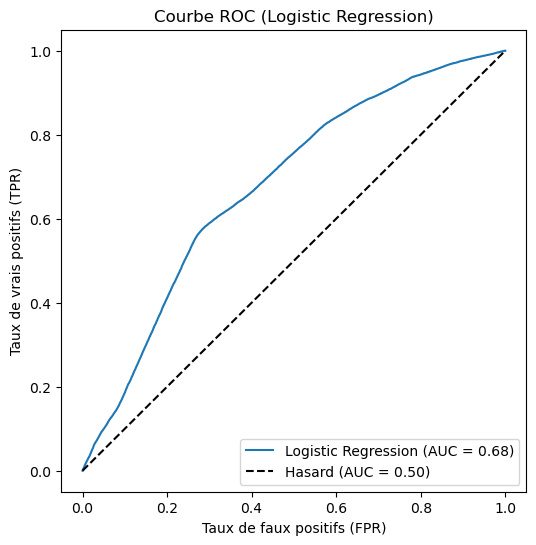

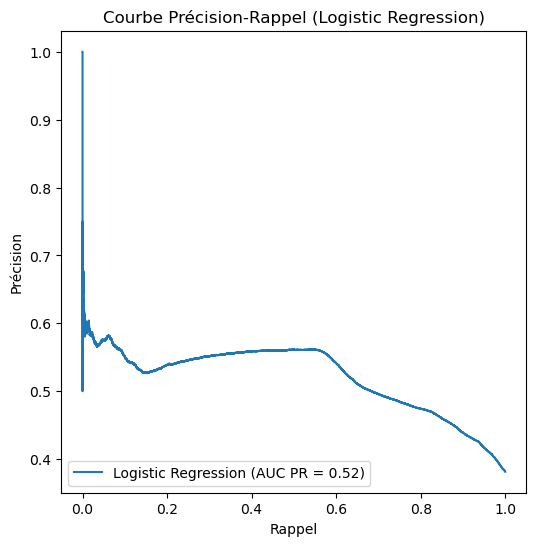

Précision LR : 0.5272419081443216
Rappel LR    : 0.15339094495585195
F1-score LR  : 0.23764393429501757


In [122]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    roc_curve,
    roc_auc_score,
    precision_score,
    recall_score,
    f1_score,
    precision_recall_curve,
    auc
)
import time


# 2) Créer et entraîner le modèle de régression logistique
model_lr = LogisticRegression()
model_lr.fit(X_train, y_train)

# 3) Faire des prédictions
start_time_lr = time.time()
y_pred_lr = model_lr.predict(X_test)
end_time_lr = time.time()
inference_time_per_sample_lr = (end_time_lr - start_time_lr) / len(X_test) * 1e6  # Temps moyen par échantillon en µs

# Affichage du temps d'inférence moyen
print(f"Temps d'inférence moyen par échantillon : {inference_time_per_sample_lr:.2f} µs")

# 4) Récupérer les probabilités de la classe positive pour la courbe ROC
y_proba_lr = model_lr.predict_proba(X_test)[:, 1]

# 5) Calculer l’AUC (Area Under the Curve)
auc_lr = roc_auc_score(y_test, y_proba_lr)

# 6) Matrice de confusion
cm_lr = confusion_matrix(y_test, y_pred_lr)
cmd_lr = ConfusionMatrixDisplay(cm_lr, display_labels=model_lr.classes_)
cmd_lr.plot(cmap='Blues', values_format='d')
plt.title("Matrice de confusion (Logistic Regression)")
plt.show()

# 7) Courbe ROC
fpr_lr, tpr_lr, seuils_lr = roc_curve(y_test, y_proba_lr)

plt.figure(figsize=(6, 6))
plt.plot(fpr_lr, tpr_lr, label=f'Logistic Regression (AUC = {auc_lr:.2f})')
# Courbe du hasard en petits traits noirs
plt.plot([0, 1], [0, 1], color='black', linestyle='--', label='Hasard (AUC = 0.50)')

plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.title('Courbe ROC (Logistic Regression)')
plt.legend(loc='lower right')
plt.show()


# 8) Courbe Précision-Rappel
# Calculer les points pour la courbe PR
precision_lr, recall_lr, thresholds_pr_lr = precision_recall_curve(y_test, y_proba_lr)

# Calculer l'AUC pour la courbe PR
pr_auc_lr = auc(recall_lr, precision_lr)

# Tracer la courbe PR
plt.figure(figsize=(6, 6))
plt.plot(recall_lr, precision_lr, label=f'Logistic Regression (AUC PR = {pr_auc_lr:.2f})')
plt.xlabel('Rappel')
plt.ylabel('Précision')
plt.title('Courbe Précision-Rappel (Logistic Regression)')
plt.legend(loc='lower left')
plt.show()

# 9) Autres métriques : précision, rappel, F1-score
precision_lr = precision_score(y_test, y_pred_lr)
rappel_lr = recall_score(y_test, y_pred_lr)
f1_lr = f1_score(y_test, y_pred_lr)

print("Précision LR :", precision_lr)
print("Rappel LR    :", rappel_lr)
print("F1-score LR  :", f1_lr)


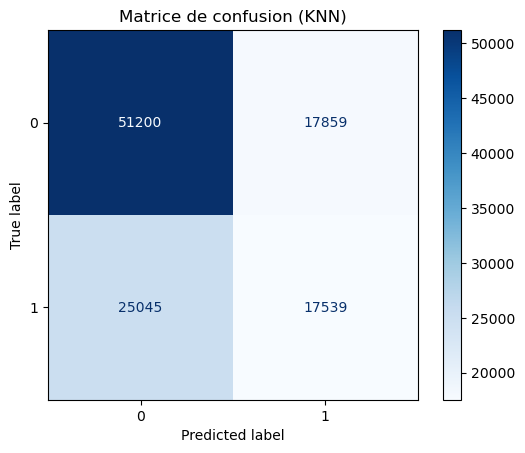

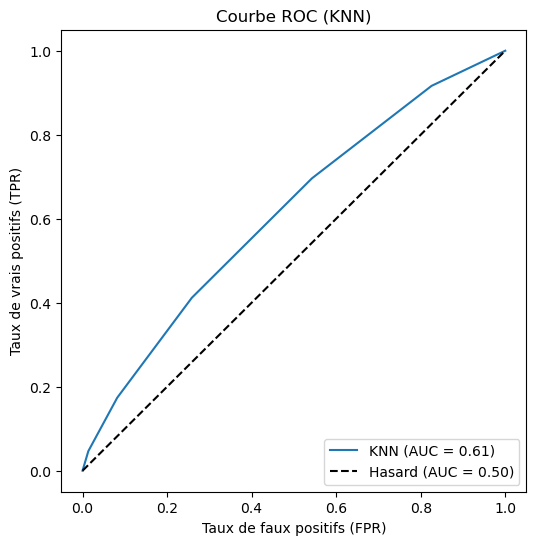

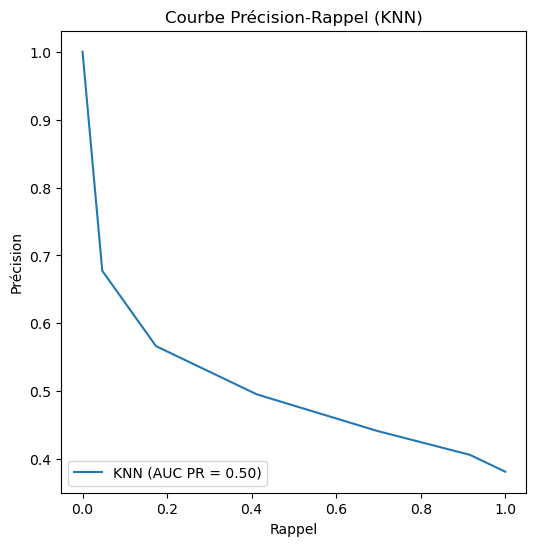

Précision KNN : 0.49547997061980903
Rappel KNN    : 0.41186830734548185
F1-score KNN  : 0.4498217537380421


In [123]:

from sklearn.neighbors import KNeighborsClassifier



# 2) Créer et entraîner le KNeighborsClassifier
model_knn = KNeighborsClassifier(n_neighbors=5)
model_knn.fit(X_train, y_train)

# 3) Faire des prédictions
start_time_knn = time.time()
y_pred_knn = model_knn.predict(X_test)
end_time_knn = time.time()
inference_time_per_sample_knn = (end_time_knn - start_time_knn) / len(X_test) * 1e6  # Temps moyen par échantillon en µs


# 4) Récupérer les probabilités de la classe positive pour la courbe ROC
#    (Assurez-vous que votre problème est binaire ou que vous visez la classe "positive")
y_proba_knn = model_knn.predict_proba(X_test)[:, 1]

# 5) Calculer l’AUC (Area Under the Curve)
auc_knn = roc_auc_score(y_test, y_proba_knn)

# 6) Matrice de confusion
cm_knn = confusion_matrix(y_test, y_pred_knn)
cmd_knn = ConfusionMatrixDisplay(cm_knn, display_labels=model_knn.classes_)
cmd_knn.plot(cmap='Blues', values_format='d')
plt.title("Matrice de confusion (KNN)")
plt.show()

# 7) Courbe ROC
fpr_knn, tpr_knn, seuils_knn = roc_curve(y_test, y_proba_knn)

plt.figure(figsize=(6, 6))
plt.plot(fpr_knn, tpr_knn, label=f'KNN (AUC = {auc_knn:.2f})')
# Courbe du hasard en petits traits noirs
plt.plot([0, 1], [0, 1], color='black', linestyle='--', label='Hasard (AUC = 0.50)')

plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.title('Courbe ROC (KNN)')
plt.legend(loc='lower right')
plt.show()

# 8) Courbe Précision-Rappel
# Calculer les points pour la courbe PR
precision_knn, recall_knn, thresholds_pr_knn = precision_recall_curve(y_test, y_proba_knn)

# Calculer l'AUC pour la courbe PR
pr_auc_knn = auc(recall_knn, precision_knn)

# Tracer la courbe PR
plt.figure(figsize=(6, 6))
plt.plot(recall_knn, precision_knn, label=f'KNN (AUC PR = {pr_auc_knn:.2f})')
plt.xlabel('Rappel')
plt.ylabel('Précision')
plt.title('Courbe Précision-Rappel (KNN)')
plt.legend(loc='lower left')
plt.show()

# 8) Autres métriques : précision, rappel, F1-score
precision_knn = precision_score(y_test, y_pred_knn)
rappel_knn = recall_score(y_test, y_pred_knn)
f1_knn = f1_score(y_test, y_pred_knn)

print("Précision KNN :", precision_knn)
print("Rappel KNN    :", rappel_knn)
print("F1-score KNN  :", f1_knn)


print(f"Temps d'inférence moyen par échantillon : {inference_time_per_sample_knn:.2f} µs")

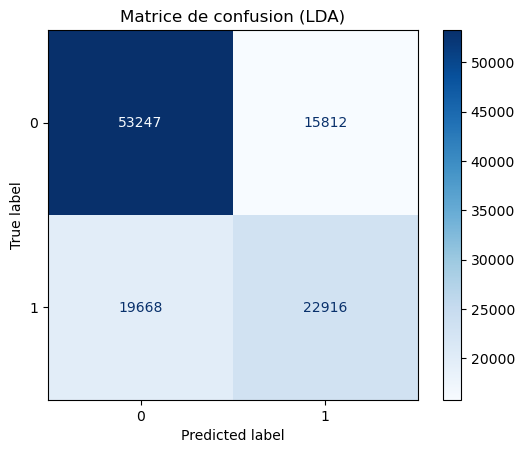

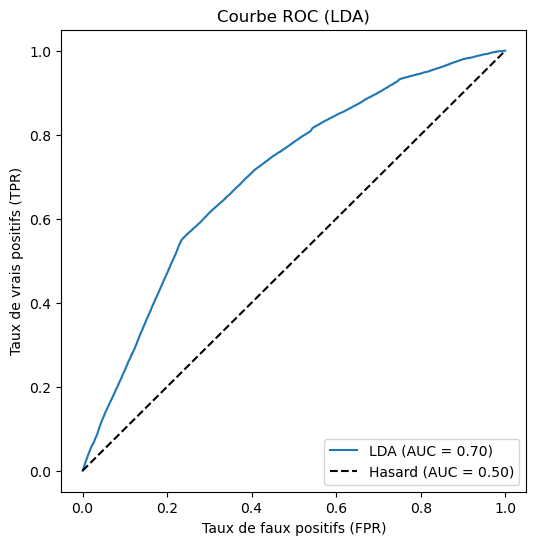

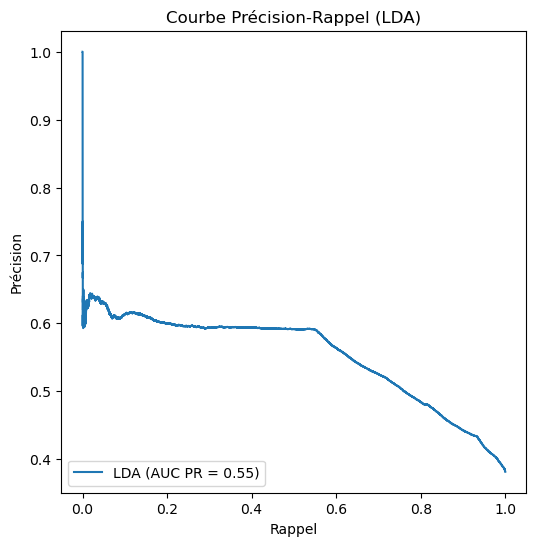

Précision LDA : 0.5917165874819252
Rappel LDA    : 0.53813638925418
F1-score LDA  : 0.5636560409287682


In [125]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    roc_curve,
    roc_auc_score,
    precision_score,
    recall_score,
    f1_score
)

# 2) Créer et entraîner le LinearDiscriminantAnalysis
model_lda = LinearDiscriminantAnalysis()
model_lda.fit(X_train, y_train)

# 3) Faire des prédictions

start_time_lda = time.time()
y_pred_lda = model_lda.predict(X_test)
end_time_lda = time.time()
inference_time_per_sample_lda = (end_time_lda - start_time_lda) / len(X_test) * 1e6  # Temps moyen par échantillon en µs

# 4) Récupérer les probabilités de la classe positive pour la courbe ROC
#    (Assurez-vous que votre problème est binaire)
y_proba_lda = model_lda.predict_proba(X_test)[:, 1]

# 5) Calculer l’AUC (Area Under the Curve)
auc_lda = roc_auc_score(y_test, y_proba_lda)

# 6) Matrice de confusion
cm_lda = confusion_matrix(y_test, y_pred_lda)
cmd_lda = ConfusionMatrixDisplay(cm_lda, display_labels=model_lda.classes_)

cmd_lda.plot(cmap='Blues', values_format='d')
plt.title("Matrice de confusion (LDA)")
plt.show()

# 7) Courbe ROC
fpr_lda, tpr_lda, seuils_lda = roc_curve(y_test, y_proba_lda)

plt.figure(figsize=(6, 6))
plt.plot(fpr_lda, tpr_lda, label=f'LDA (AUC = {auc_lda:.2f})')
# Courbe du hasard en petits traits noirs
plt.plot([0, 1], [0, 1], color='black', linestyle='--', label='Hasard (AUC = 0.50)')

plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.title('Courbe ROC (LDA)')
plt.legend(loc='lower right')
plt.show()


# 8) Courbe Précision-Rappel
# Calculer les points pour la courbe PR
precision_lda, recall_lda, thresholds_pr_lda = precision_recall_curve(y_test, y_proba_lda)

# Calculer l'AUC pour la courbe PR
pr_auc_lda = auc(recall_lda, precision_lda)

# Tracer la courbe PR
plt.figure(figsize=(6, 6))
plt.plot(recall_lda, precision_lda, label=f'LDA (AUC PR = {pr_auc_lda:.2f})')
plt.xlabel('Rappel')
plt.ylabel('Précision')
plt.title('Courbe Précision-Rappel (LDA)')
plt.legend(loc='lower left')
plt.show()


# 8) Autres métriques : précision, rappel, F1-score
precision_lda = precision_score(y_test, y_pred_lda)
rappel_lda = recall_score(y_test, y_pred_lda)
f1_lda = f1_score(y_test, y_pred_lda)

print("Précision LDA :", precision_lda)
print("Rappel LDA    :", rappel_lda)
print("F1-score LDA  :", f1_lda)


print(f"Temps d'inférence moyen par échantillon : {inference_time_per_sample_lda:.2f} µs")

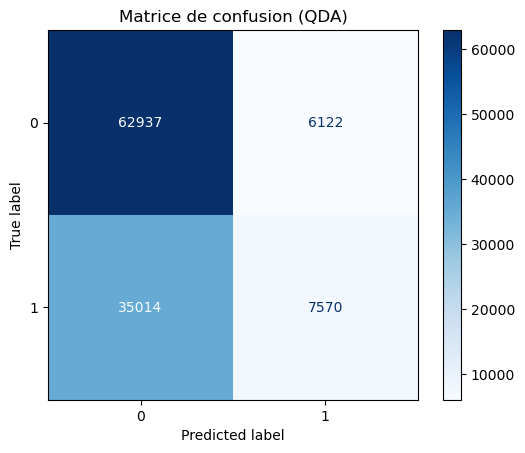

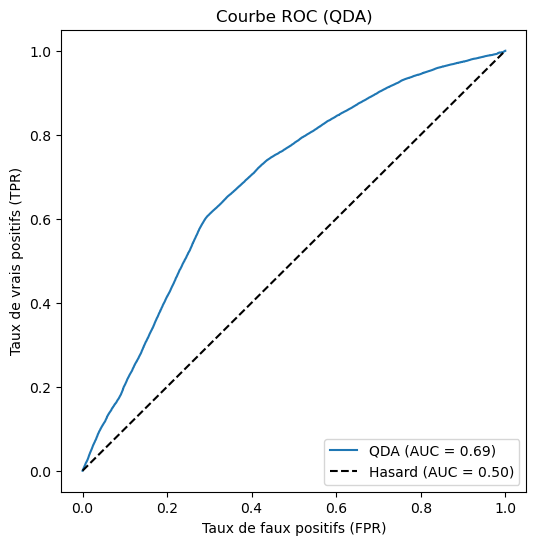

Précision QDA : 0.5528775927548933
Rappel QDA    : 0.1777662972008266
F1-score QDA  : 0.2690312033548937


In [127]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    roc_curve,
    roc_auc_score,
    precision_score,
    recall_score,
    f1_score
)

# Supposez que X et y sont déjà définis, par exemple :
# X = ...
# y = ...

# 1) Séparer les données en jeu d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(
    X, 
    y, 
    test_size=0.2, 
    random_state=2002
)

# 2) Créer et entraîner le QuadraticDiscriminantAnalysis
model_qda = QuadraticDiscriminantAnalysis()
model_qda.fit(X_train, y_train)

# 3) Faire des prédictions
y_pred_qda = model_qda.predict(X_test)

# 4) Récupérer les probabilités de la classe positive pour la courbe ROC
y_proba_qda = model_qda.predict_proba(X_test)[:, 1]

# 5) Calculer l’AUC (Area Under the Curve)
auc_qda = roc_auc_score(y_test, y_proba_qda)

# 6) Matrice de confusion
cm_qda = confusion_matrix(y_test, y_pred_qda)
cmd_qda = ConfusionMatrixDisplay(cm_qda, display_labels=model_qda.classes_)
cmd_qda.plot(cmap='Blues')
plt.title("Matrice de confusion (QDA)")
plt.show()

# 7) Courbe ROC
fpr_qda, tpr_qda, seuils_qda = roc_curve(y_test, y_proba_qda)

plt.figure(figsize=(6, 6))
plt.plot(fpr_qda, tpr_qda, label=f'QDA (AUC = {auc_qda:.2f})')
# Courbe du hasard en petits traits noirs
plt.plot([0, 1], [0, 1], color='black', linestyle='--', label='Hasard (AUC = 0.50)')

plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.title('Courbe ROC (QDA)')
plt.legend(loc='lower right')
plt.show()

# 8) Autres métriques : précision, rappel, F1-score
precision_qda = precision_score(y_test, y_pred_qda)
rappel_qda = recall_score(y_test, y_pred_qda)
f1_qda = f1_score(y_test, y_pred_qda)

print("Précision QDA :", precision_qda)
print("Rappel QDA    :", rappel_qda)
print("F1-score QDA  :", f1_qda)


In [128]:
# Pas QDA car collinéaire

Temps d'inférence moyen par échantillon : 1.18 µs


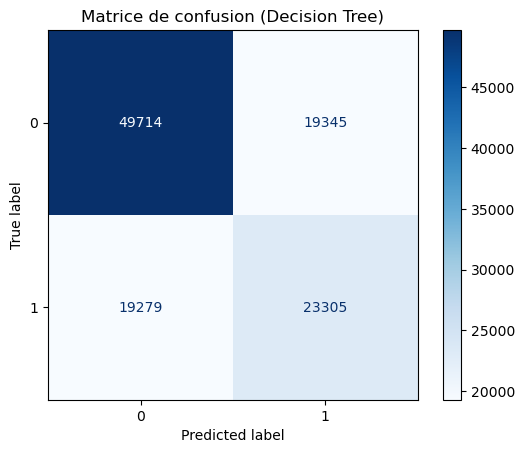

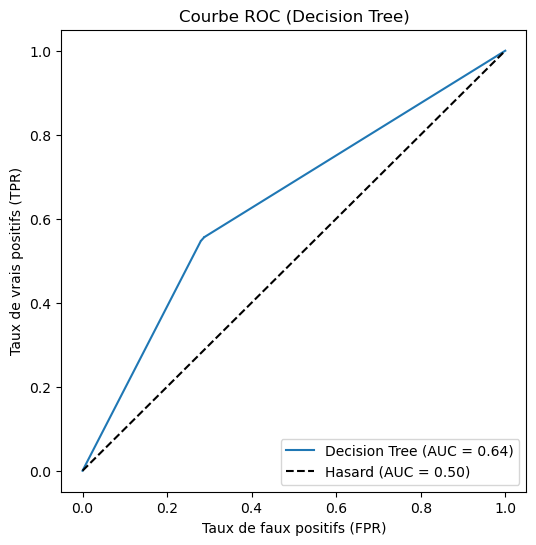

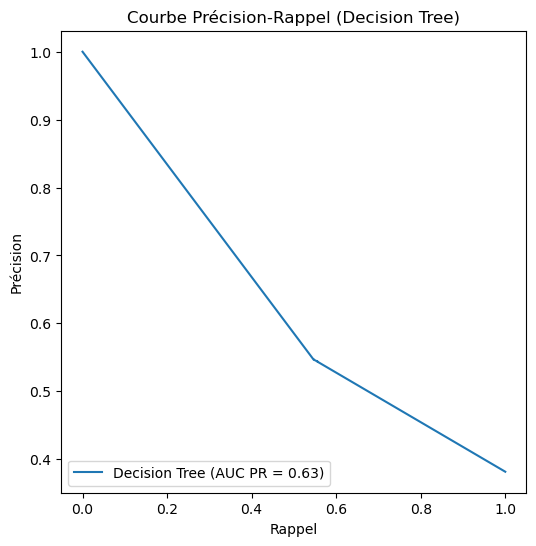

Précision DT : 0.5464243845252051
Rappel DT    : 0.5472712755964682
F1-score DT  : 0.5468475021704954


In [129]:
#1)
from sklearn.tree import DecisionTreeClassifier, plot_tree

# 2) Créer et entraîner le DecisionTreeClassifier
model_dt = DecisionTreeClassifier(random_state=2002)
model_dt.fit(X_train, y_train)

# 3) Faire des prédictions

start_time_dt = time.time()
y_pred_dt = model_dt.predict(X_test)
end_time_dt = time.time()
inference_time_per_sample_dt = (end_time_dt - start_time_dt) / len(X_test) * 1e6  # Temps moyen par échantillon en µs

print(f"Temps d'inférence moyen par échantillon : {inference_time_per_sample_dt:.2f} µs")

# 4) Récupérer les probabilités de la classe positive pour la courbe ROC
#    (Assurez-vous que votre problème est binaire)
y_proba_dt = model_dt.predict_proba(X_test)[:, 1]

# 5) Calculer l’AUC (Area Under the Curve)
auc_dt = roc_auc_score(y_test, y_proba_dt)

# 6) Matrice de confusion
cm_dt = confusion_matrix(y_test, y_pred_dt)
cmd_dt = ConfusionMatrixDisplay(cm_dt, display_labels=model_dt.classes_)

cmd_dt.plot(cmap='Blues', values_format='d')
plt.title("Matrice de confusion (Decision Tree)")
plt.show()

# 7) Courbe ROC
fpr_dt, tpr_dt, seuils_dt = roc_curve(y_test, y_proba_dt)

plt.figure(figsize=(6, 6))
plt.plot(fpr_dt, tpr_dt, label=f'Decision Tree (AUC = {auc_dt:.2f})')
# Courbe du hasard en petits traits noirs
plt.plot([0, 1], [0, 1], color='black', linestyle='--', label='Hasard (AUC = 0.50)')

plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.title('Courbe ROC (Decision Tree)')
plt.legend(loc='lower right')
plt.show()



# 8) Courbe Précision-Rappel
# Calculer les points pour la courbe PR
precision_dt, recall_dt, thresholds_pr_dt = precision_recall_curve(y_test, y_proba_dt)

# Calculer l'AUC pour la courbe PR
pr_auc_dt = auc(recall_dt, precision_dt)

# Tracer la courbe PR
plt.figure(figsize=(6, 6))
plt.plot(recall_dt, precision_dt, label=f'Decision Tree (AUC PR = {pr_auc_dt:.2f})')
plt.xlabel('Rappel')
plt.ylabel('Précision')
plt.title('Courbe Précision-Rappel (Decision Tree)')
plt.legend(loc='lower left')
plt.show()

# 8) Autres métriques : précision, rappel, F1-score
precision_dt = precision_score(y_test, y_pred_dt)
rappel_dt = recall_score(y_test, y_pred_dt)
f1_dt = f1_score(y_test, y_pred_dt)

print("Précision DT :", precision_dt)
print("Rappel DT    :", rappel_dt)
print("F1-score DT  :", f1_dt)




Temps d'inférence moyen par échantillon : 1.18 µs


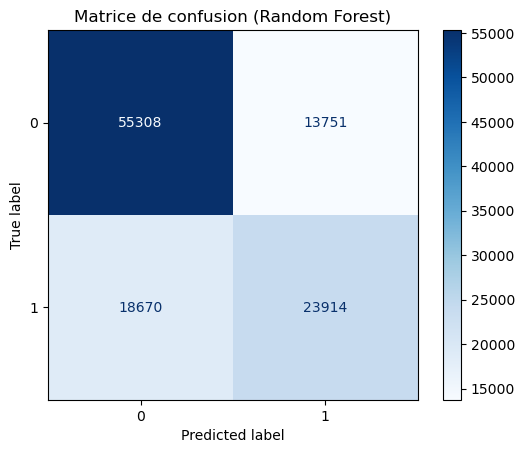

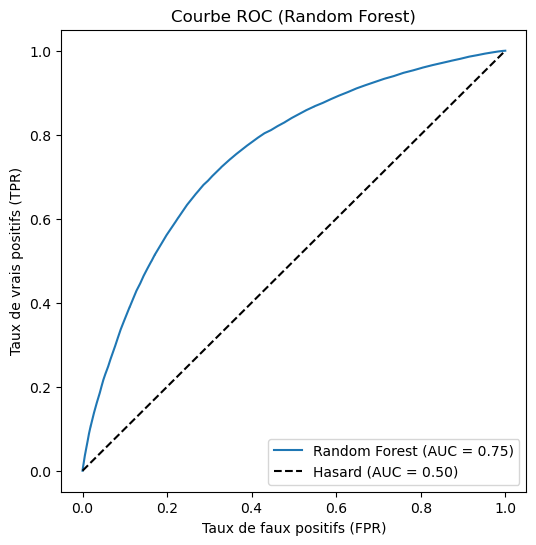

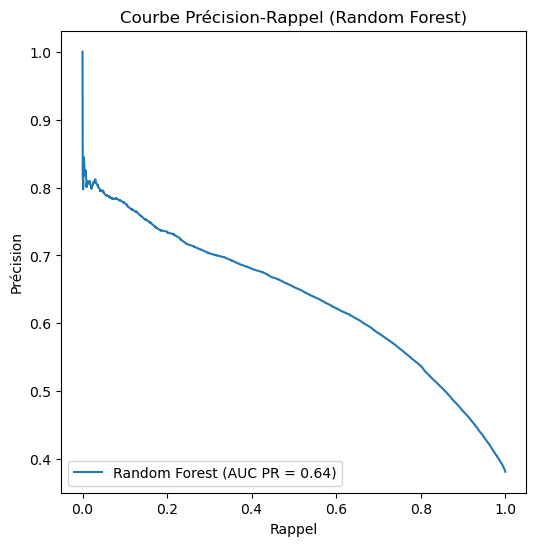

Précision RF : 0.6349130492499668
Rappel RF    : 0.5615724215667857
F1-score RF  : 0.5959949656693542
InscClaimAmtReimbursed: 0.164
DeductibleAmtPaid: 0.016
Patient_Type: 0.004
Gender: 0.020
Race: 0.014
RenalDiseaseIndicator: 0.012
NoOfMonths_PartACov: 0.001
NoOfMonths_PartBCov: 0.002
ChronicCond_Alzheimer: 0.018
ChronicCond_Heartfailure: 0.017
ChronicCond_KidneyDisease: 0.015
ChronicCond_Cancer: 0.013
ChronicCond_ObstrPulmonary: 0.014
ChronicCond_Depression: 0.017
ChronicCond_Diabetes: 0.016
ChronicCond_IschemicHeart: 0.015
ChronicCond_Osteoporasis: 0.018
ChronicCond_rheumatoidarthritis: 0.017
ChronicCond_stroke: 0.009
IPAnnualReimbursementAmt: 0.044
IPAnnualDeductibleAmt: 0.018
OPAnnualReimbursementAmt: 0.153
OPAnnualDeductibleAmt: 0.142
NbDiagnosis: 0.094
DureeClaim: 0.028
StateRisk: 0.075
CountyRisk: 0.042


In [130]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    roc_curve,
    roc_auc_score,
    precision_score,
    recall_score,
    f1_score
)

# 2) Créer et entraîner le RandomForestClassifier
model_rf = RandomForestClassifier(
    n_estimators=100, 
    random_state=2002
)
model_rf.fit(X_train, y_train)

# 3) Faire des prédictions


start_time_rf  = time.time()
y_pred_rf = model_rf.predict(X_test)
end_time_rf  = time.time()
inference_time_per_sample_rf  = (end_time_rf  - start_time_rf ) / len(X_test) * 1e6  # Temps moyen par échantillon en µs

print(f"Temps d'inférence moyen par échantillon : {inference_time_per_sample_dt:.2f} µs")



# 4) Récupérer les probabilités de la classe positive pour la courbe ROC
y_proba_rf = model_rf.predict_proba(X_test)[:, 1]

# 5) Calculer l’AUC (Area Under the Curve)
auc_rf = roc_auc_score(y_test, y_proba_rf)

# 6) Matrice de confusion
cm_rf = confusion_matrix(y_test, y_pred_rf)
cmd_rf = ConfusionMatrixDisplay(cm_rf, display_labels=model_rf.classes_)

cmd_rf.plot(cmap='Blues', values_format='d')
plt.title("Matrice de confusion (Random Forest)")
plt.show()

# 7) Courbe ROC
fpr_rf, tpr_rf, seuils_rf = roc_curve(y_test, y_proba_rf)

plt.figure(figsize=(6, 6))
plt.plot(fpr_rf, tpr_rf, label=f'Random Forest (AUC = {auc_rf:.2f})')
# Courbe du hasard en petits traits noirs
plt.plot([0, 1], [0, 1], color='black', linestyle='--', label='Hasard (AUC = 0.50)')

plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.title('Courbe ROC (Random Forest)')
plt.legend(loc='lower right')
plt.show()


# 8) Courbe Précision-Rappel
# Calculer les points pour la courbe PR
precision_rf, recall_rf, thresholds_pr_rf = precision_recall_curve(y_test, y_proba_rf)

# Calculer l'AUC pour la courbe PR
pr_auc_rf = auc(recall_rf, precision_rf)

# Tracer la courbe PR
plt.figure(figsize=(6, 6))
plt.plot(recall_rf, precision_rf, label=f'Random Forest (AUC PR = {pr_auc_rf:.2f})')
plt.xlabel('Rappel')
plt.ylabel('Précision')
plt.title('Courbe Précision-Rappel (Random Forest)')
plt.legend(loc='lower left')
plt.show()





# 8) Autres métriques : précision, rappel, F1-score
precision_rf = precision_score(y_test, y_pred_rf)
rappel_rf = recall_score(y_test, y_pred_rf)
f1_rf = f1_score(y_test, y_pred_rf)

print("Précision RF :", precision_rf)
print("Rappel RF    :", rappel_rf)
print("F1-score RF  :", f1_rf)

# 9) (Optionnel) Affichage de l'importance des features
#    (Assurez-vous que X est un DataFrame ou que vous avez les noms de features)
feature_importances_rf = model_rf.feature_importances_
if hasattr(X, "columns"):
    # Si X est un DataFrame pandas
    for feat_name, importance in zip(X.columns, feature_importances_rf):
        print(f"{feat_name}: {importance:.3f}")
else:
    # Sinon, on affiche simplement les importances avec l'index
    for i, importance in enumerate(feature_importances_rf):
        print(f"Feature {i}: {importance:.3f}")


Temps d'inférence moyen par échantillon : 1.77 µs


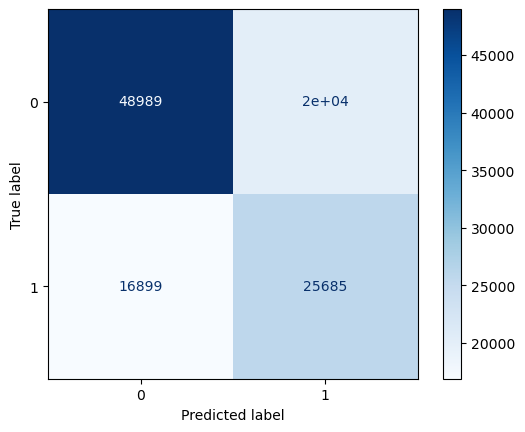

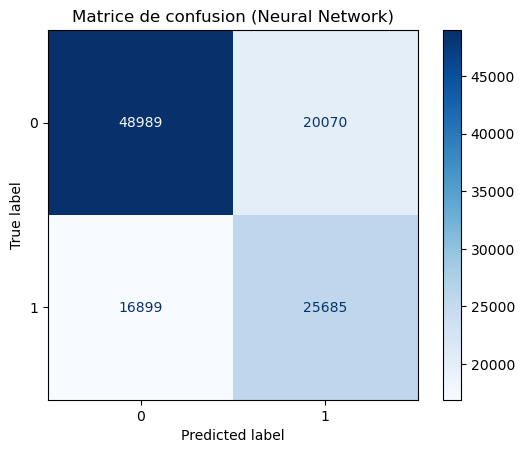

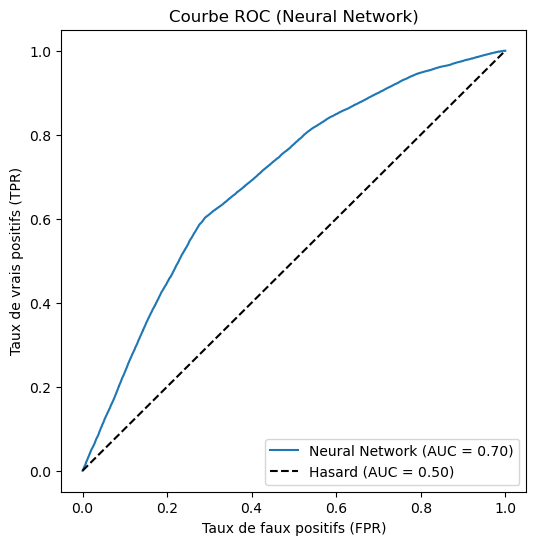

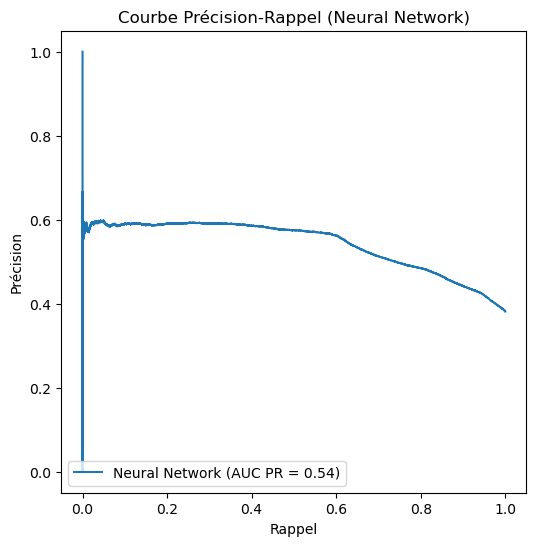

Précision NN : 0.5613594142716642
Rappel NN    : 0.6031608115724215
F1-score NN  : 0.5815098654048608


In [131]:


from sklearn.neural_network import MLPClassifier


# 2) Créer et entraîner le MLPClassifier (réseau de neurones)
#    Vous pouvez ajuster hidden_layer_sizes, activation, etc.
model_nn = MLPClassifier(
    hidden_layer_sizes=(64, 64),  # Par ex. deux couches cachées de 64 neurones
    activation='relu',
    solver='adam',
    max_iter=500,         # Nombre max d'itérations
    random_state=2002
)
model_nn.fit(X_train, y_train)

# 3) Faire des prédictions


start_time_nn   = time.time()
y_pred_nn = model_nn.predict(X_test)

end_time_nn   = time.time()
inference_time_per_sample_nn   = (end_time_nn   - start_time_nn  ) / len(X_test) * 1e6  # Temps moyen par échantillon en µs

print(f"Temps d'inférence moyen par échantillon : {inference_time_per_sample_nn :.2f} µs")



# 4) Récupérer les probabilités de la classe positive pour la courbe ROC
#    (Assurez-vous que votre problème est binaire)
y_proba_nn = model_nn.predict_proba(X_test)[:, 1]

# 5) Calculer l’AUC (Area Under the Curve)
auc_nn = roc_auc_score(y_test, y_proba_nn)

# 6) Matrice de confusion
cm_nn = confusion_matrix(y_test, y_pred_nn)
cmd_nn = ConfusionMatrixDisplay(cm_nn, display_labels=model_nn.classes_)
cmd_nn.plot(cmap='Blues')
cmd_nn.plot(cmap='Blues', values_format='d')
plt.title("Matrice de confusion (Neural Network)")
plt.show()

# 7) Courbe ROC
fpr_nn, tpr_nn, seuils_nn = roc_curve(y_test, y_proba_nn)

plt.figure(figsize=(6, 6))
plt.plot(fpr_nn, tpr_nn, label=f'Neural Network (AUC = {auc_nn:.2f})')
# Courbe du hasard en petits traits noirs
plt.plot([0, 1], [0, 1], color='black', linestyle='--', label='Hasard (AUC = 0.50)')

plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.title('Courbe ROC (Neural Network)')
plt.legend(loc='lower right')
plt.show()



# 8) Courbe Précision-Rappel
# Calculer les points pour la courbe PR
precision_nn, recall_nn, thresholds_pr_nn = precision_recall_curve(y_test, y_proba_nn)

# Calculer l'AUC pour la courbe PR
pr_auc_nn = auc(recall_nn, precision_nn)

# Tracer la courbe PR
plt.figure(figsize=(6, 6))
plt.plot(recall_nn, precision_nn, label=f'Neural Network (AUC PR = {pr_auc_nn:.2f})')
plt.xlabel('Rappel')
plt.ylabel('Précision')
plt.title('Courbe Précision-Rappel (Neural Network)')
plt.legend(loc='lower left')
plt.show()


# 8) Autres métriques : précision, rappel, F1-score
precision_nn = precision_score(y_test, y_pred_nn)
rappel_nn = recall_score(y_test, y_pred_nn)
f1_nn = f1_score(y_test, y_pred_nn)

print("Précision NN :", precision_nn)
print("Rappel NN    :", rappel_nn)
print("F1-score NN  :", f1_nn)


In [132]:
# !pip install xgboost

C:\Users\emmad\anaconda3\lib\site-packages\xgboost\core.py:158: UserWarning:

[10:05:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




Temps d'inférence moyen par échantillon : 1.47 µs


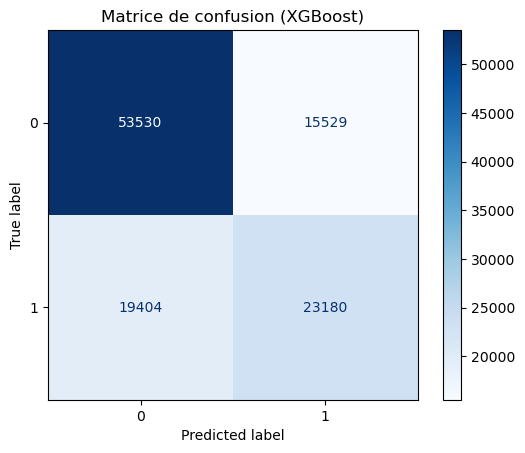

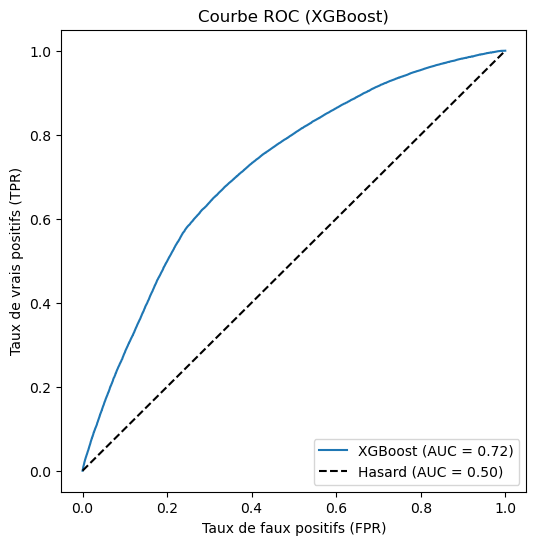

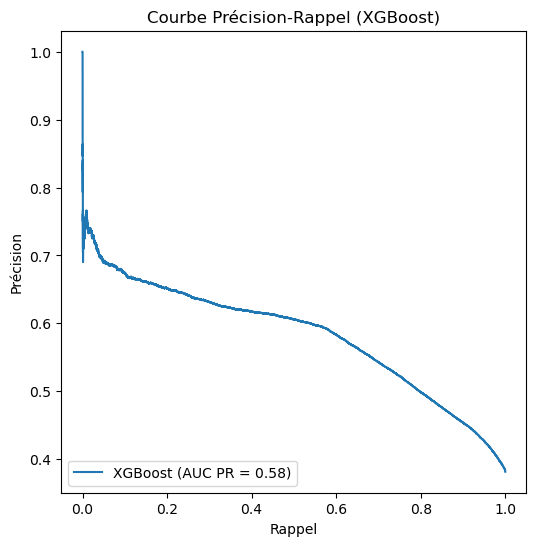

Précision XGB : 0.5988271461417242
Rappel XGB    : 0.5443359008078151
F1-score XGB  : 0.5702828041774815


In [133]:

# Installation du package si besoin :

import xgboost as xgb


# 2) Créer et entraîner le XGBClassifier
model_xgb = xgb.XGBClassifier(
    use_label_encoder=False,  # Depuis certaines versions de xgboost, éviter l'encoder interne
    eval_metric='logloss',   # Pour éviter un warning "use_label_encoder" 
    random_state=2002,
    enable_categorical=True   # Active le support (EXPÉRIMENTAL) des features catégorielles
)

model_xgb.fit(X_train, y_train)

# 3) Faire des prédictions




start_time_xgb    = time.time()
y_pred_xgb = model_xgb.predict(X_test)

end_time_xgb    = time.time()
inference_time_per_sample_xgb    = (end_time_xgb    - start_time_xgb  ) / len(X_test) * 1e6  # Temps moyen par échantillon en µs

print(f"Temps d'inférence moyen par échantillon : {inference_time_per_sample_xgb  :.2f} µs")




# 4) Récupérer les probabilités de la classe positive pour la courbe ROC
y_proba_xgb = model_xgb.predict_proba(X_test)[:, 1]

# 5) Calculer l’AUC (Area Under the Curve)
auc_xgb = roc_auc_score(y_test, y_proba_xgb)

# 6) Matrice de confusion
cm_xgb = confusion_matrix(y_test, y_pred_xgb)
cmd_xgb = ConfusionMatrixDisplay(cm_xgb, display_labels=model_xgb.classes_)

cmd_xgb.plot(cmap='Blues', values_format='d')
plt.title("Matrice de confusion (XGBoost)")
plt.show()

# 7) Courbe ROC
fpr_xgb, tpr_xgb, seuils_xgb = roc_curve(y_test, y_proba_xgb)

plt.figure(figsize=(6, 6))
plt.plot(fpr_xgb, tpr_xgb, label=f'XGBoost (AUC = {auc_xgb:.2f})')
# Courbe du hasard en petits traits noirs
plt.plot([0, 1], [0, 1], color='black', linestyle='--', label='Hasard (AUC = 0.50)')

plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.title('Courbe ROC (XGBoost)')
plt.legend(loc='lower right')
plt.show()



# 8) Courbe Précision-Rappel
# Calculer les points pour la courbe PR
precision_xgb, recall_xgb, thresholds_pr_xgb = precision_recall_curve(y_test, y_proba_xgb)

# Calculer l'AUC pour la courbe PR
pr_auc_xgb = auc(recall_xgb, precision_xgb)

# Tracer la courbe PR
plt.figure(figsize=(6, 6))
plt.plot(recall_xgb, precision_xgb, label=f'XGBoost (AUC PR = {pr_auc_xgb:.2f})')
plt.xlabel('Rappel')
plt.ylabel('Précision')
plt.title('Courbe Précision-Rappel (XGBoost)')
plt.legend(loc='lower left')
plt.show()




# 8) Autres métriques : précision, rappel, F1-score
precision_xgb = precision_score(y_test, y_pred_xgb)
rappel_xgb = recall_score(y_test, y_pred_xgb)
f1_xgb = f1_score(y_test, y_pred_xgb)

print("Précision XGB :", precision_xgb)
print("Rappel XGB    :", rappel_xgb)
print("F1-score XGB  :", f1_xgb)


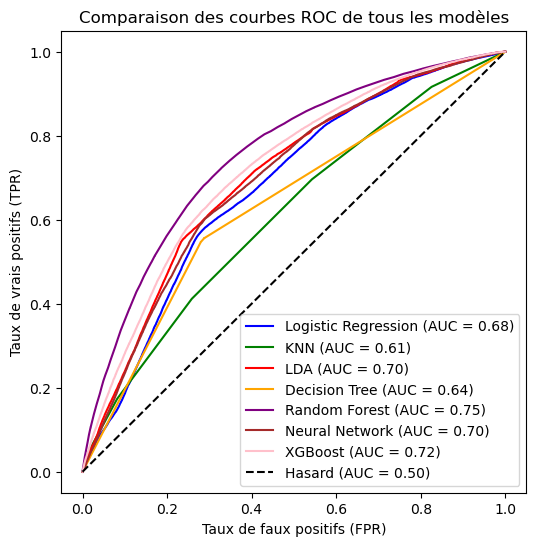

In [134]:
# Nouvelle cellule pour comparer toutes les courbes ROC

plt.figure(figsize=(6, 6))

# Logistic Regression
plt.plot(fpr_lr, tpr_lr, 
         label=f'Logistic Regression (AUC = {auc_lr:.2f})', 
         color='blue')

# KNN
plt.plot(fpr_knn, tpr_knn, 
         label=f'KNN (AUC = {auc_knn:.2f})', 
         color='green')

# LDA
plt.plot(fpr_lda, tpr_lda, 
         label=f'LDA (AUC = {auc_lda:.2f})', 
         color='red')

# Decision Tree
plt.plot(fpr_dt, tpr_dt, 
         label=f'Decision Tree (AUC = {auc_dt:.2f})', 
         color='orange')

# Random Forest
plt.plot(fpr_rf, tpr_rf, 
         label=f'Random Forest (AUC = {auc_rf:.2f})', 
         color='purple')

# Neural Network (MLPClassifier)
plt.plot(fpr_nn, tpr_nn, 
         label=f'Neural Network (AUC = {auc_nn:.2f})', 
         color='brown')

# XGBoost
plt.plot(fpr_xgb, tpr_xgb, 
         label=f'XGBoost (AUC = {auc_xgb:.2f})', 
         color='pink')

# Courbe du hasard en petits traits noirs
plt.plot([0, 1], [0, 1], color='black', linestyle='--', label='Hasard (AUC = 0.50)')

plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.title('Comparaison des courbes ROC de tous les modèles')
plt.legend(loc='lower right')
plt.show()


X_train.shape[1]

coef_lr = model_lr.coef_[0]  # si binaire (une seule ligne)
for feat_name, c in zip(X.columns, coef_lr):
    print(f"{feat_name} : {c}")


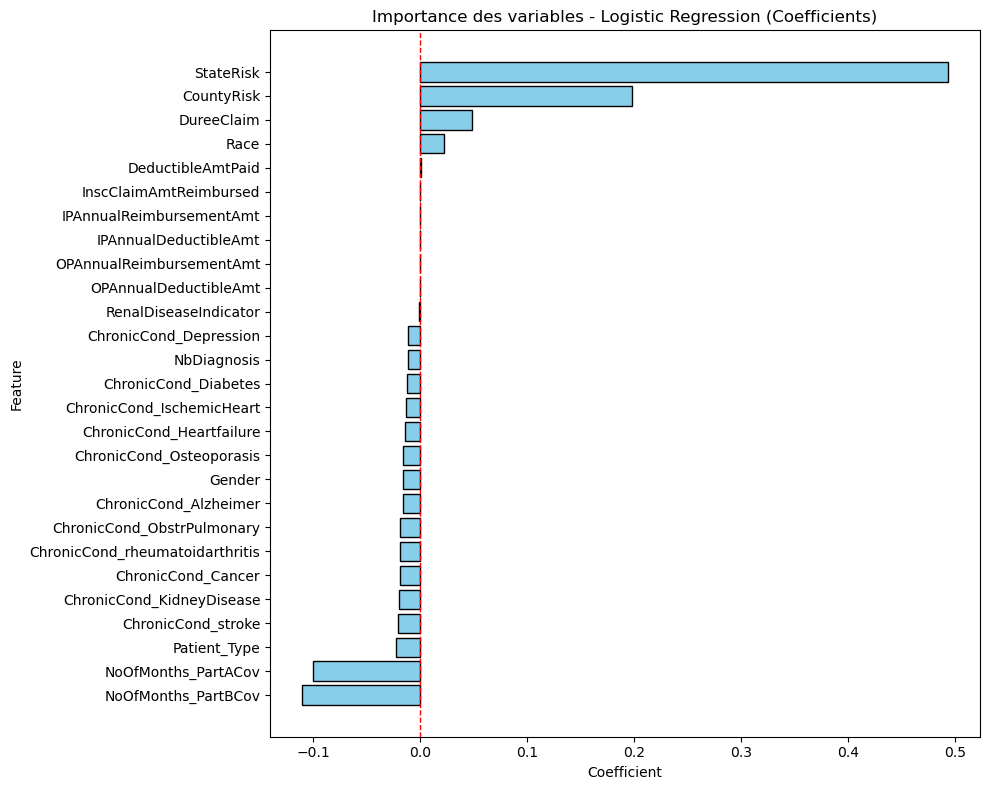

In [137]:
import matplotlib.pyplot as plt
import numpy as np

# Récupérer les coefficients de la régression logistique
coef_lr = model_lr.coef_[0]  # Si binaire, utilise le premier tableau (une seule ligne)
feature_names = X.columns  # Noms des colonnes

# Triez les coefficients par ordre croissant pour un affichage clair
sorted_indices = np.argsort(coef_lr)
sorted_features = feature_names[sorted_indices]
sorted_coefs = coef_lr[sorted_indices]

# Création du graphique
plt.figure(figsize=(10, 8))
plt.barh(sorted_features, sorted_coefs, color='skyblue', edgecolor='k')
plt.xlabel('Coefficient')
plt.ylabel('Feature')
plt.title('Importance des variables - Logistic Regression (Coefficients)')
plt.axvline(0, color='red', linestyle='--', linewidth=1)  # Ligne verticale à 0 pour séparer positif/négatif
plt.tight_layout()
plt.show()


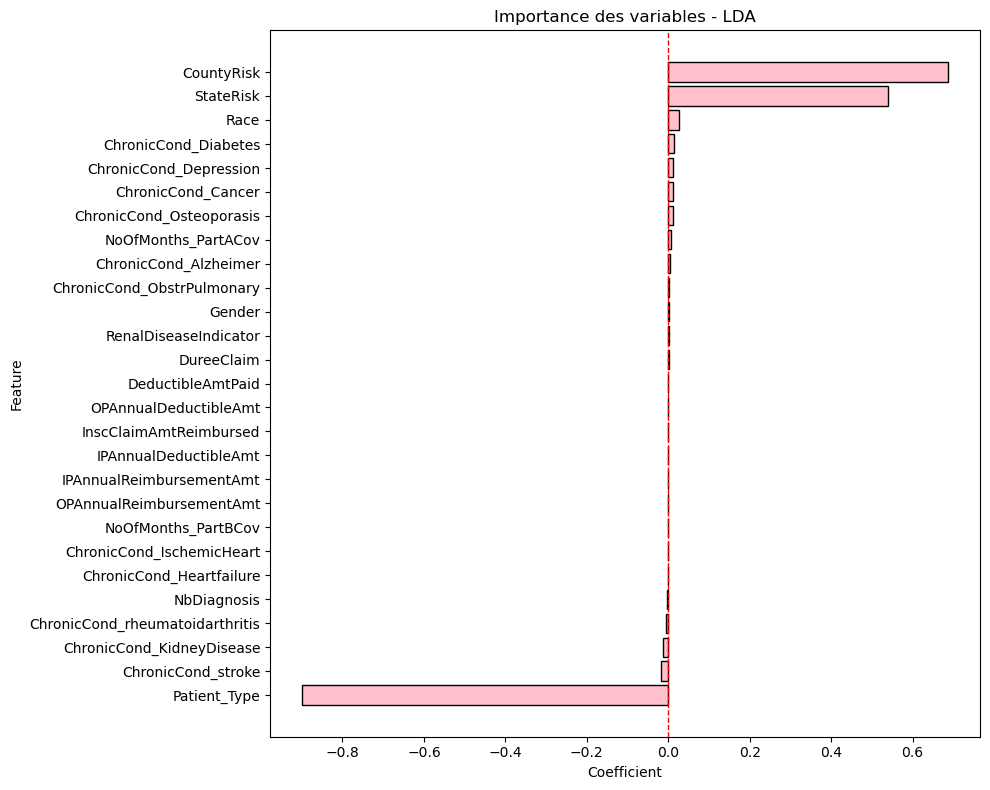

In [138]:
# LDA
coef_lda = model_lda.coef_[0]  # Si binaire, utilise le premier tableau (une seule ligne)

# Triez les coefficients par ordre croissant
sorted_indices = np.argsort(coef_lda)
sorted_features = feature_names[sorted_indices]
sorted_coefs = coef_lda[sorted_indices]

# Création du graphique pour LDA
plt.figure(figsize=(10, 8))
plt.barh(sorted_features, sorted_coefs, color='pink', edgecolor='k')
plt.xlabel('Coefficient')
plt.ylabel('Feature')
plt.title('Importance des variables - LDA')
plt.axvline(0, color='red', linestyle='--', linewidth=1)
plt.tight_layout()
plt.show()

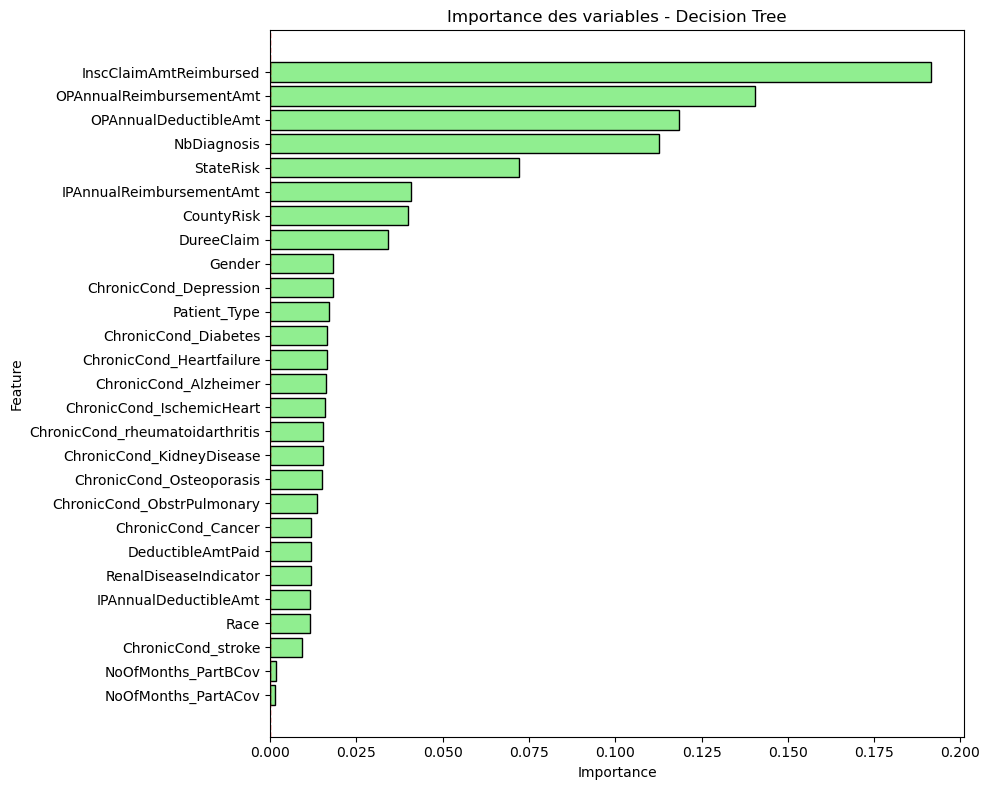

In [139]:
# Decision Tree
coef_dt = model_dt.feature_importances_

# Triez les coefficients par ordre croissant
sorted_indices = np.argsort(coef_dt)
sorted_features = feature_names[sorted_indices]
sorted_coefs = coef_dt[sorted_indices]

# Création du graphique pour Decision Tree
plt.figure(figsize=(10, 8))
plt.barh(sorted_features, sorted_coefs, color='lightgreen', edgecolor='k')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Importance des variables - Decision Tree')
plt.axvline(0, color='red', linestyle='--', linewidth=1)
plt.tight_layout()
plt.show()


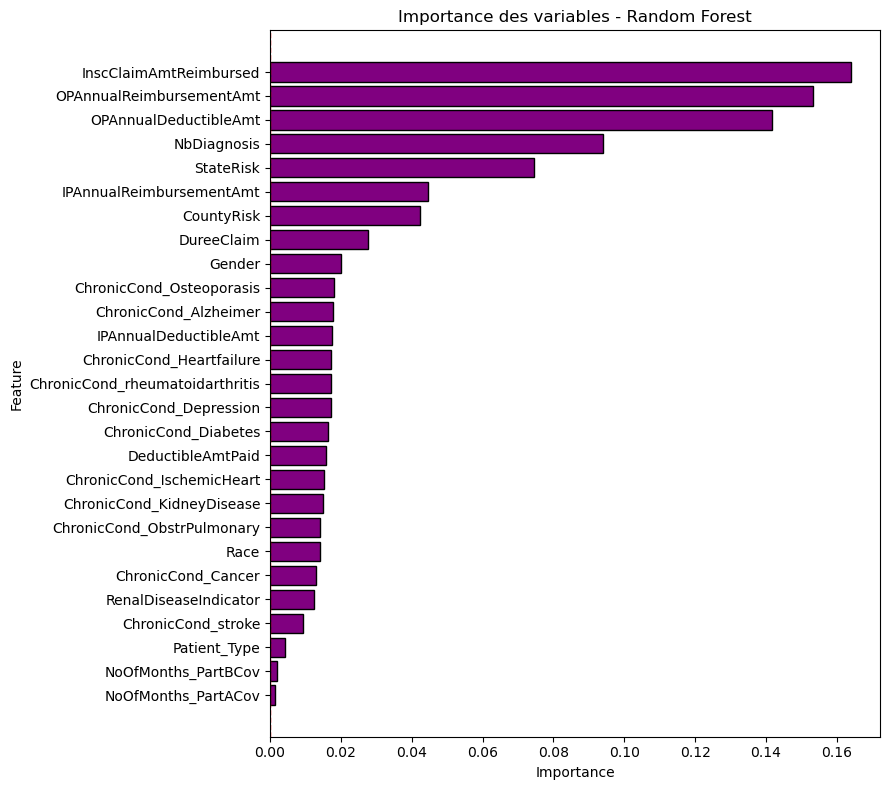

In [140]:
# Random Forest
coef_rf = model_rf.feature_importances_

# Triez les coefficients par ordre croissant
sorted_indices = np.argsort(coef_rf)
sorted_features = feature_names[sorted_indices]
sorted_coefs = coef_rf[sorted_indices]

# Création du graphique pour Random Forest
plt.figure(figsize=(9, 8))
plt.barh(sorted_features, sorted_coefs, color='purple', edgecolor='k')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Importance des variables - Random Forest')
plt.axvline(0, color='red', linestyle='--', linewidth=1)
plt.tight_layout()
plt.show()

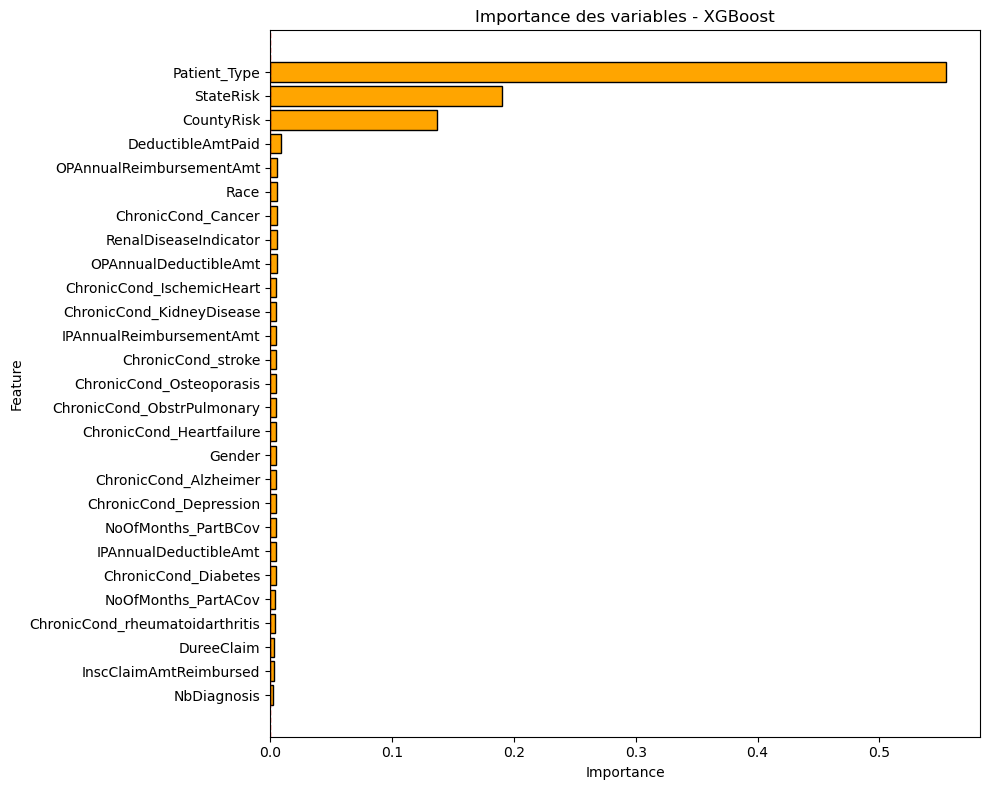

In [165]:
# XGBoost
coef_xgb = model_xgb.feature_importances_

# Triez les coefficients par ordre croissant
sorted_indices = np.argsort(coef_xgb)
sorted_features = feature_names[sorted_indices]
sorted_coefs = coef_xgb[sorted_indices]

# Création du graphique pour XGBoost
plt.figure(figsize=(10, 8))
plt.barh(sorted_features, sorted_coefs, color='orange', edgecolor='k')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Importance des variables - XGBoost')
plt.axvline(0, color='red', linestyle='--', linewidth=1)
plt.tight_layout()
plt.show()


In [166]:
#pip install shap


In [167]:
#PAS POUR KNN

In [168]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
import numpy as np
import pandas as pd


# Sous-échantillonnage des données pour l'optimisation des hyperparamètres
data_sampled = data.sample(frac=0.1, random_state=2002)
X_sampled = data_sampled.drop(columns='PotentialFraud')
y_sampled = data_sampled['PotentialFraud']

X_train_sampled, X_test_sampled, y_train_sampled, y_test_sampled = train_test_split(
    X_sampled, y_sampled, test_size=0.2, random_state=2002
)
# Définition des hyperparamètres à optimiser
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2'],
    'class_weight': ['balanced', None]
}

# Création du modèle de base
rf = RandomForestClassifier(random_state=2002)

# Configuration de la recherche sur grille avec validation croisée
grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=3,  # Validation croisée à 3 plis
    scoring='f1',  # Métrique d'évaluation
    n_jobs=-1,  # Utilisation de tous les cœurs disponibles
    verbose=2,  # Affichage détaillé
    return_train_score=True
)

# Entraînement du modèle avec recherche sur grille
grid_search.fit(X_train_sampled, y_train_sampled)

# Affichage des meilleurs paramètres
print("Meilleurs paramètres trouvés :")
print(grid_search.best_params_)
print("\nMeilleur score :", grid_search.best_score_)

# Création d'un DataFrame avec les résultats détaillés
results = pd.DataFrame(grid_search.cv_results_)
results = results.sort_values(by='rank_test_score')


Fitting 3 folds for each of 432 candidates, totalling 1296 fits
Meilleurs paramètres trouvés :
{'class_weight': 'balanced', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 200}

Meilleur score : 0.5916850172002713



Comparaison des métriques entre Patient_Type=1 et Patient_Type=2:
            Group  Precision    Recall  F1-score   ROC AUC
0  Patient_Type=1   0.595455  0.970576  0.738088  0.517851
1  Patient_Type=2   0.609000  0.626598  0.617674  0.697433


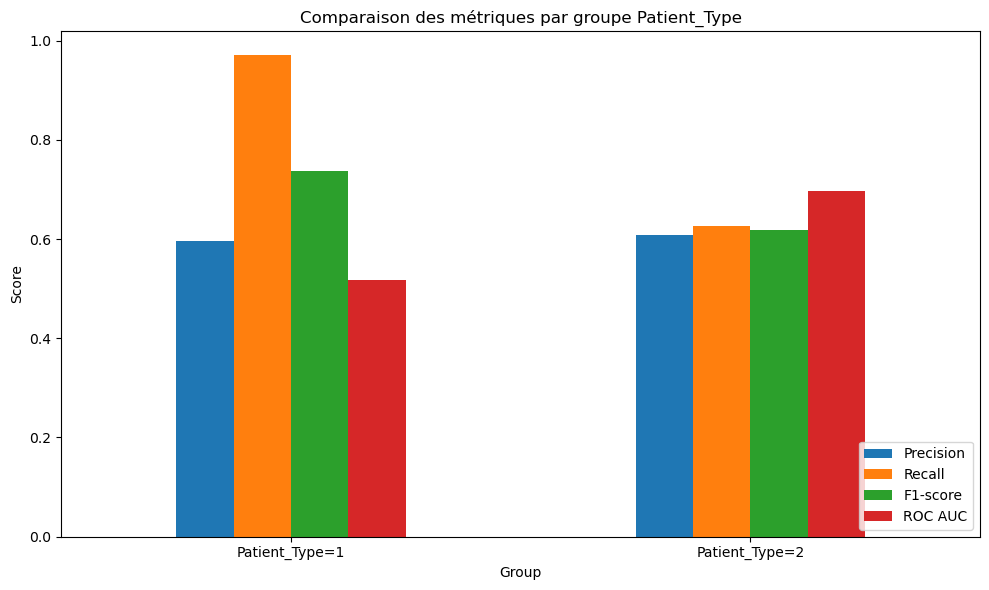

In [229]:
import pandas as pd
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
import matplotlib.pyplot as plt

# Ajout des prédictions à X_test pour l'analyse
X_test['y_pred'] = y_pred_best

# Séparer les groupes selon `Patient_Type`
X_test_type1 = X_test[X_test['Patient_Type'] == 1]
X_test_type2 = X_test[X_test['Patient_Type'] == 2]

y_test_type1 = y_test[X_test['Patient_Type'] == 1]
y_test_type2 = y_test[X_test['Patient_Type'] == 2]

y_pred_type1 = X_test_type1['y_pred']
y_pred_type2 = X_test_type2['y_pred']

# Calcul des métriques pour chaque groupe
metrics = {
    'Group': ['Patient_Type=1', 'Patient_Type=2'],
    'Precision': [
        precision_score(y_test_type1, y_pred_type1),
        precision_score(y_test_type2, y_pred_type2)
    ],
    'Recall': [
        recall_score(y_test_type1, y_pred_type1),
        recall_score(y_test_type2, y_pred_type2)
    ],
    'F1-score': [
        f1_score(y_test_type1, y_pred_type1),
        f1_score(y_test_type2, y_pred_type2)
    ],
    'ROC AUC': [
        roc_auc_score(y_test_type1, y_pred_type1),
        roc_auc_score(y_test_type2, y_pred_type2)
    ]
}

metrics_df = pd.DataFrame(metrics)

# Affichage des métriques
print("\nComparaison des métriques entre Patient_Type=1 et Patient_Type=2:")
print(metrics_df)

# Visualisation des métriques
metrics_df.set_index('Group').plot(kind='bar', figsize=(10, 6))
plt.title('Comparaison des métriques par groupe Patient_Type')
plt.ylabel('Score')
plt.xticks(rotation=0)
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


In [169]:

# Utilisation du meilleur modèle
best_rf = grid_search.best_estimator_

# Évaluation sur l'ensemble de test
y_pred_best = best_rf.predict(X_test)

# Calcul des métriques
print("\nMétriques sur l'ensemble de test:")
print(f"Precision: {precision_score(y_test, y_pred_best):.3f}")
print(f"Recall: {recall_score(y_test, y_pred_best):.3f}")
print(f"F1-score: {f1_score(y_test, y_pred_best):.3f}")
print(f"ROC AUC: {roc_auc_score(y_test, y_pred_best):.3f}")

# Affichage des features importantes
feature_importance = pd.DataFrame({
    'feature': X_train.columns,
    'importance': best_rf.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)
print("\nImportance des features:")
print(feature_importance)


Métriques sur l'ensemble de test:
Precision: 0.644
Recall: 0.692
F1-score: 0.667
ROC AUC: 0.728

Importance des features:
                            feature  importance
25                        StateRisk    0.160682
21         OPAnnualReimbursementAmt    0.133314
22            OPAnnualDeductibleAmt    0.122567
26                       CountyRisk    0.103010
0            InscClaimAmtReimbursed    0.097347
23                      NbDiagnosis    0.055043
19         IPAnnualReimbursementAmt    0.048953
24                       DureeClaim    0.021150
3                            Gender    0.020083
13           ChronicCond_Depression    0.018600
8             ChronicCond_Alzheimer    0.018540
20            IPAnnualDeductibleAmt    0.017957
16         ChronicCond_Osteoporasis    0.017781
17  ChronicCond_rheumatoidarthritis    0.017065
9          ChronicCond_Heartfailure    0.016852
1                 DeductibleAmtPaid    0.015872
12       ChronicCond_ObstrPulmonary    0.015663
10        Chr

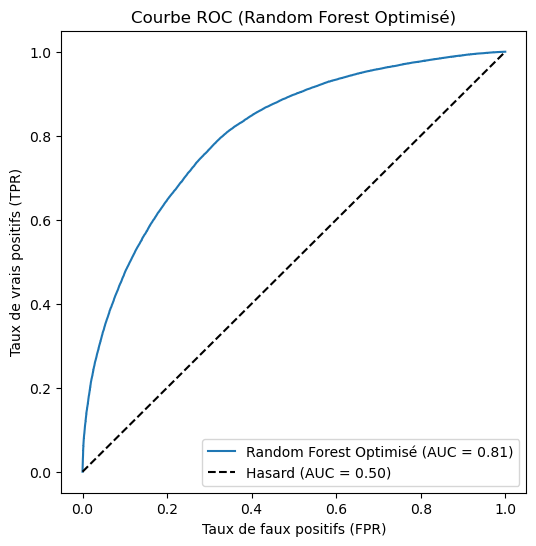

In [170]:
# Courbe ROC
y_proba_best = best_rf.predict_proba(X_test)[:, 1]
auc_best = roc_auc_score(y_test, y_proba_best)

fpr_best, tpr_best, seuils_best = roc_curve(y_test, y_proba_best)

plt.figure(figsize=(6, 6))
plt.plot(fpr_best, tpr_best, label=f'Random Forest Optimisé (AUC = {auc_best:.2f})')
# Courbe du hasard en petits traits noirs
plt.plot([0, 1], [0, 1], color='black', linestyle='--', label='Hasard (AUC = 0.50)')

plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.title('Courbe ROC (Random Forest Optimisé)')
plt.legend(loc='lower right')
plt.show()


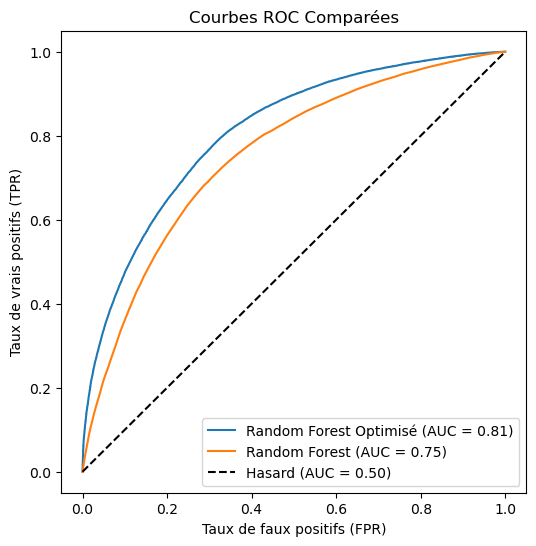

In [171]:
plt.figure(figsize=(6, 6))

# Courbe ROC du modèle optimisé
plt.plot(fpr_best, tpr_best, label=f'Random Forest Optimisé (AUC = {auc_best:.2f})')

# Courbe ROC du Random Forest
plt.plot(fpr_rf, tpr_rf, label=f'Random Forest (AUC = {auc_rf:.2f})')

# Courbe du hasard en petits traits noirs
plt.plot([0, 1], [0, 1], color='black', linestyle='--', label='Hasard (AUC = 0.50)')

# Ajout des labels, titre et légende
plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.title('Courbes ROC Comparées')
plt.legend(loc='lower right')

# Affichage du graphique
plt.show()


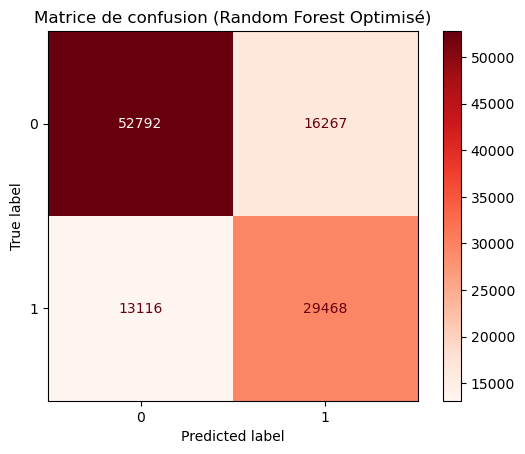

In [172]:
# 6) Matrice de confusion
cm_best = confusion_matrix(y_test, y_pred_best)
cmd_best = ConfusionMatrixDisplay(cm_best, display_labels=best_rf.classes_)

cmd_best.plot(cmap='Reds', values_format='d')
plt.title("Matrice de confusion (Random Forest Optimisé)")
plt.show()


In [173]:
precision_best = precision_score(y_test, y_pred_best)
rappel_best = recall_score(y_test, y_pred_best)
f1_best = f1_score(y_test, y_pred_best)

print("Précision XGB :", precision_best)
print("Rappel XGB    :", rappel_best)
print("F1-score XGB  :", f1_best)


Précision XGB : 0.644320542254291
Rappel XGB    : 0.6919969941762164
F1-score XGB  : 0.667308280211506


In [174]:
X_train

,InscClaimAmtReimbursed,DeductibleAmtPaid,Patient_Type,Gender,Race,RenalDiseaseIndicator,NoOfMonths_PartACov,NoOfMonths_PartBCov,ChronicCond_Alzheimer,ChronicCond_Heartfailure,...,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt,NbDiagnosis,DureeClaim,StateRisk,CountyRisk
249278,90,0.0,2,2,1,0,12,12,2,2,...,2,2,0,0,870,610,2,1,1,3
192001,13000,1068.0,1,2,1,1,12,12,1,1,...,2,2,74400,5340,1250,900,9,3,3,4
336948,30,0.0,2,2,2,0,12,12,1,1,...,1,2,0,0,8260,1560,2,1,4,3
135575,6000,1068.0,1,1,1,0,12,12,2,1,...,2,2,6000,1068,0,0,10,4,4,4
52346,50,0.0,2,2,1,0,12,12,2,2,...,2,2,0,0,570,80,1,1,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320079,20,0.0,2,2,1,0,12,12,1,1,...,2,2,0,0,2780,80,1,1,2,4
408452,10,0.0,2,2,1,0,12,12,1,2,...,2,2,0,0,930,330,2,1,4,4
118541,2200,0.0,2,2,1,0,12,12,1,1,...,1,2,9000,1068,2320,80,2,1,4,4
141368,100,100.0,2,2,1,0,12,12,1,2,...,2,2,0,0,170,180,1,1,1,3


In [188]:
import pandas as pd
import numpy as np

# Liste des colonnes et leur ordre
columns = [
    'InscClaimAmtReimbursed', 'DeductibleAmtPaid', 'Patient_Type', 'Gender', 'Race',
    'RenalDiseaseIndicator', 'NoOfMonths_PartACov', 'NoOfMonths_PartBCov',
    'ChronicCond_Alzheimer', 'ChronicCond_Heartfailure', 'ChronicCond_KidneyDisease',
    'ChronicCond_Cancer', 'ChronicCond_ObstrPulmonary', 'ChronicCond_Depression',
    'ChronicCond_Diabetes', 'ChronicCond_IschemicHeart', 'ChronicCond_Osteoporasis',
    'ChronicCond_rheumatoidarthritis', 'ChronicCond_stroke', 'IPAnnualReimbursementAmt',
    'IPAnnualDeductibleAmt', 'OPAnnualReimbursementAmt', 'OPAnnualDeductibleAmt',
    'PotentialFraud', 'NbDiagnosis', 'DureeClaim', 'StateRisk', 'CountyRisk'
]
df=data
# Calcul des valeurs constantes pour chaque colonne
synth_data = {}
for col in columns:
    if col == 'DeductibleAmtPaid' or col == 'Gender':
        # Ces colonnes seront définies séparément
        continue
    elif df[col].dtype == 'int64':
        # Valeur la plus fréquente pour les colonnes de type int
        synth_data[col] = df[col].mode()[0]
    elif df[col].dtype == 'float64':
        # Médiane pour les colonnes de type float
        synth_data[col] = df[col].median()
    elif df[col].dtype.name == 'category':
        # Mode pour les colonnes catégoriques
        synth_data[col] = df[col].mode()[0]

# Génération des données synthétiques pour DeductibleAmtPaid
deductible_values = np.linspace(df['DeductibleAmtPaid'].min(), df['DeductibleAmtPaid'].max(), 50)

# Création des DataFrames pour hommes et femmes
male_data = []
female_data = []

for deductible in deductible_values:
    # Ajout d'une ligne synthétique pour les hommes
    male_row = synth_data.copy()
    male_row['DeductibleAmtPaid'] = deductible
    male_row['Gender'] = 1  # 1 pour Male
    male_data.append(male_row)
    
    # Ajout d'une ligne synthétique pour les femmes
    female_row = synth_data.copy()
    female_row['DeductibleAmtPaid'] = deductible
    female_row['Gender'] = 2  # 2 pour Female
    female_data.append(female_row)

# Conversion en DataFrames
deductible_male = pd.DataFrame(male_data)
deductible_female = pd.DataFrame(female_data)

# Réorganisation des colonnes dans l'ordre original
deductible_male = deductible_male[columns]
deductible_female = deductible_female[columns]

# Exemple d'affichage
print("DataFrame pour les hommes :")
print(deductible_male.head())
print("\nDataFrame pour les femmes :")
print(deductible_female.head())


DataFrame pour les hommes :
   InscClaimAmtReimbursed  DeductibleAmtPaid  Patient_Type  Gender  Race  \
0                     100           0.000000             2       1     1   
1                     100          21.795918             2       1     1   
2                     100          43.591837             2       1     1   
3                     100          65.387755             2       1     1   
4                     100          87.183673             2       1     1   

   RenalDiseaseIndicator  NoOfMonths_PartACov  NoOfMonths_PartBCov  \
0                      0                   12                   12   
1                      0                   12                   12   
2                      0                   12                   12   
3                      0                   12                   12   
4                      0                   12                   12   

   ChronicCond_Alzheimer  ChronicCond_Heartfailure  ...  ChronicCond_stroke  \
0              

In [190]:
deductible_male.drop('PotentialFraud', axis=1, inplace=True)
deductible_female.drop('PotentialFraud', axis=1, inplace=True)

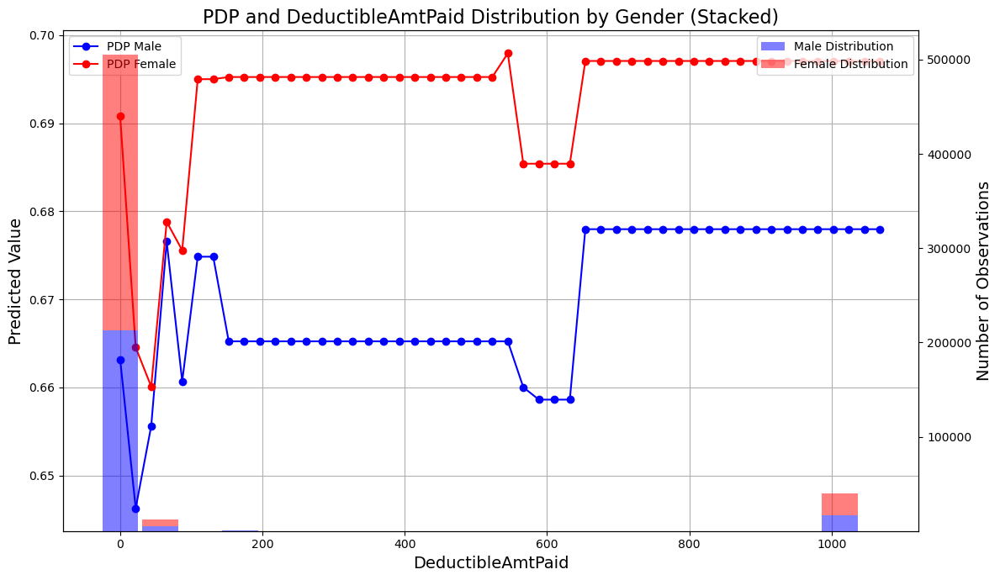

In [191]:
import matplotlib.pyplot as plt

# Modèle choisi (Random Forest optimisé)
model = best_rf

# Prédictions pour les données synthétiques
preds_male = model.predict_proba(deductible_male)[:, 1]
preds_female = model.predict_proba(deductible_female)[:, 1]

# Comptage des valeurs de DeductibleAmtPaid dans le dataset original pour chaque sexe, en utilisant les mêmes bins
bins = np.linspace(df['DeductibleAmtPaid'].min(), df['DeductibleAmtPaid'].max(), 20)
deductible_counts_male = np.histogram(df[df['Gender'] == 1]['DeductibleAmtPaid'].dropna(), bins=bins)[0]
deductible_counts_female = np.histogram(df[df['Gender'] == 2]['DeductibleAmtPaid'].dropna(), bins=bins)[0]

# Graphique
fig, ax1 = plt.subplots(figsize=(12, 7))

# PDP pour les hommes
ax1.plot(deductible_male['DeductibleAmtPaid'], preds_male, color='blue', label='PDP Male', marker='o')
# PDP pour les femmes
ax1.plot(deductible_female['DeductibleAmtPaid'], preds_female, color='red', label='PDP Female', marker='o')

ax1.set_xlabel('DeductibleAmtPaid', fontsize=14)
ax1.set_ylabel('Predicted Value', fontsize=14)
ax1.legend(loc='upper left')
ax1.grid(True)

# Bar plot pour la distribution des DeductibleAmtPaid empilée
ax2 = ax1.twinx()

bar_width = (bins[1] - bins[0]) * 0.9
ax2.bar(bins[:-1], deductible_counts_male, color='blue', alpha=0.5, width=bar_width, label='Male Distribution')
ax2.bar(bins[:-1], deductible_counts_female, color='red', alpha=0.5, width=bar_width, label='Female Distribution', bottom=deductible_counts_male)

ax2.set_ylabel('Number of Observations', fontsize=14)
ax2.legend(loc='upper right')

plt.title('PDP and DeductibleAmtPaid Distribution by Gender (Stacked)', fontsize=16)
plt.tight_layout()
plt.show()


In [192]:
import pandas as pd
import numpy as np

# Liste des colonnes et leur ordre
columns = [
    'InscClaimAmtReimbursed', 'DeductibleAmtPaid', 'Patient_Type', 'Gender', 'Race',
    'RenalDiseaseIndicator', 'NoOfMonths_PartACov', 'NoOfMonths_PartBCov',
    'ChronicCond_Alzheimer', 'ChronicCond_Heartfailure', 'ChronicCond_KidneyDisease',
    'ChronicCond_Cancer', 'ChronicCond_ObstrPulmonary', 'ChronicCond_Depression',
    'ChronicCond_Diabetes', 'ChronicCond_IschemicHeart', 'ChronicCond_Osteoporasis',
    'ChronicCond_rheumatoidarthritis', 'ChronicCond_stroke', 'IPAnnualReimbursementAmt',
    'IPAnnualDeductibleAmt', 'OPAnnualReimbursementAmt', 'OPAnnualDeductibleAmt',
     'NbDiagnosis', 'DureeClaim', 'StateRisk', 'CountyRisk'
]

# Calcul des valeurs constantes pour chaque colonne
synth_data = {}
for col in columns:
    if col == 'OPAnnualReimbursementAmt' or col == 'StateRisk':
        # Ces colonnes seront définies séparément
        continue
    elif df[col].dtype == 'int64':
        # Valeur la plus fréquente pour les colonnes de type int
        synth_data[col] = df[col].mode()[0]
    elif df[col].dtype == 'float64':
        # Médiane pour les colonnes de type float
        synth_data[col] = df[col].median()
    elif df[col].dtype.name == 'category':
        # Mode pour les colonnes catégoriques
        synth_data[col] = df[col].mode()[0]

# Génération des données synthétiques pour OPAnnualReimbursementAmt
op_values = np.linspace(df['OPAnnualReimbursementAmt'].min(), df['OPAnnualReimbursementAmt'].max(), 50)

# Création des DataFrames pour chaque valeur de StateRisk (1, 2, 3, 4)
risk1_amt = []
risk2_amt = []
risk3_amt = []
risk4_amt = []

for op_value in op_values:
    # Ajout d'une ligne synthétique pour StateRisk = 1
    row_risk1 = synth_data.copy()
    row_risk1['OPAnnualReimbursementAmt'] = op_value
    row_risk1['StateRisk'] = 1
    risk1_amt.append(row_risk1)
    
    # Ajout d'une ligne synthétique pour StateRisk = 2
    row_risk2 = synth_data.copy()
    row_risk2['OPAnnualReimbursementAmt'] = op_value
    row_risk2['StateRisk'] = 2
    risk2_amt.append(row_risk2)
    
    # Ajout d'une ligne synthétique pour StateRisk = 3
    row_risk3 = synth_data.copy()
    row_risk3['OPAnnualReimbursementAmt'] = op_value
    row_risk3['StateRisk'] = 3
    risk3_amt.append(row_risk3)
    
    # Ajout d'une ligne synthétique pour StateRisk = 4
    row_risk4 = synth_data.copy()
    row_risk4['OPAnnualReimbursementAmt'] = op_value
    row_risk4['StateRisk'] = 4
    risk4_amt.append(row_risk4)

# Conversion des listes en DataFrames
risk1_amt = pd.DataFrame(risk1_amt)
risk2_amt = pd.DataFrame(risk2_amt)
risk3_amt = pd.DataFrame(risk3_amt)
risk4_amt = pd.DataFrame(risk4_amt)

# Réorganisation des colonnes dans l'ordre original
risk1_amt = risk1_amt[columns]
risk2_amt = risk2_amt[columns]
risk3_amt = risk3_amt[columns]
risk4_amt = risk4_amt[columns]

# Exemple d'affichage
print("Tableau pour StateRisk = 1 :")
print(risk1_amt.head())
print("\nTableau pour StateRisk = 2 :")
print(risk2_amt.head())
print("\nTableau pour StateRisk = 3 :")
print(risk3_amt.head())
print("\nTableau pour StateRisk = 4 :")
print(risk4_amt.head())


Tableau pour StateRisk = 1 :
   InscClaimAmtReimbursed  DeductibleAmtPaid  Patient_Type  Gender  Race  \
0                     100                0.0             2       2     1   
1                     100                0.0             2       2     1   
2                     100                0.0             2       2     1   
3                     100                0.0             2       2     1   
4                     100                0.0             2       2     1   

   RenalDiseaseIndicator  NoOfMonths_PartACov  NoOfMonths_PartBCov  \
0                      0                   12                   12   
1                      0                   12                   12   
2                      0                   12                   12   
3                      0                   12                   12   
4                      0                   12                   12   

   ChronicCond_Alzheimer  ChronicCond_Heartfailure  ...  \
0                      2          

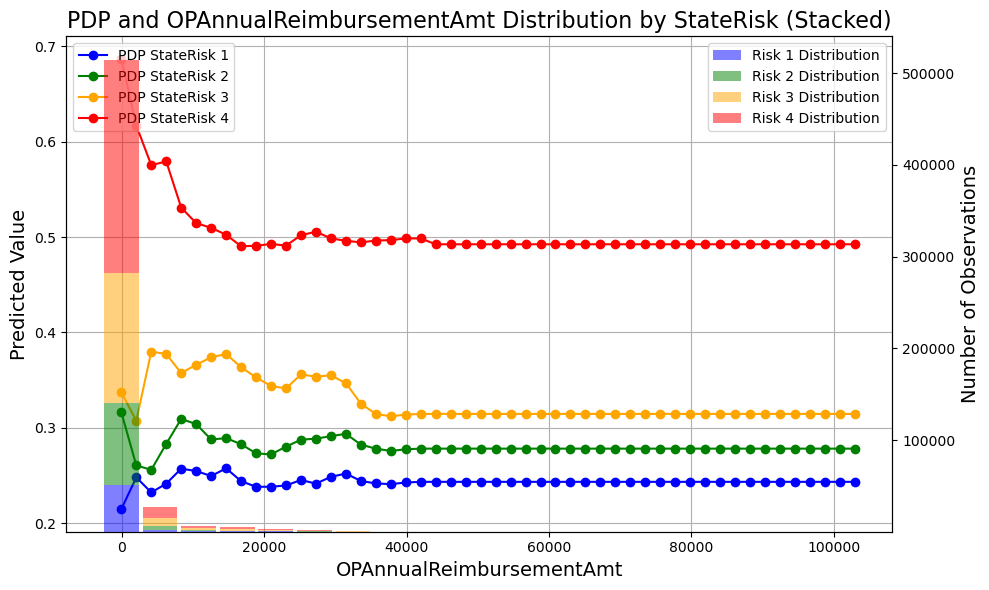

In [193]:
import matplotlib.pyplot as plt

# Modèle choisi (Random Forest optimisé)
model = best_rf

# Prédictions pour les données synthétiques
preds_risk1 = model.predict_proba(risk1_amt)[:, 1]
preds_risk2 = model.predict_proba(risk2_amt)[:, 1]
preds_risk3 = model.predict_proba(risk3_amt)[:, 1]
preds_risk4 = model.predict_proba(risk4_amt)[:, 1]

# Comptage des valeurs de OPAnnualReimbursementAmt dans le dataset original pour chaque StateRisk, en utilisant les mêmes bins
bins = np.linspace(df['OPAnnualReimbursementAmt'].min(), df['OPAnnualReimbursementAmt'].max(), 20)
op_counts_risk1 = np.histogram(df[df['StateRisk'] == 1]['OPAnnualReimbursementAmt'].dropna(), bins=bins)[0]
op_counts_risk2 = np.histogram(df[df['StateRisk'] == 2]['OPAnnualReimbursementAmt'].dropna(), bins=bins)[0]
op_counts_risk3 = np.histogram(df[df['StateRisk'] == 3]['OPAnnualReimbursementAmt'].dropna(), bins=bins)[0]
op_counts_risk4 = np.histogram(df[df['StateRisk'] == 4]['OPAnnualReimbursementAmt'].dropna(), bins=bins)[0]

# Graphique
fig, ax1 = plt.subplots(figsize=(10, 6))

# PDP pour chaque StateRisk
ax1.plot(risk1_amt['OPAnnualReimbursementAmt'], preds_risk1, color='blue', label='PDP StateRisk 1', marker='o')
ax1.plot(risk2_amt['OPAnnualReimbursementAmt'], preds_risk2, color='green', label='PDP StateRisk 2', marker='o')
ax1.plot(risk3_amt['OPAnnualReimbursementAmt'], preds_risk3, color='orange', label='PDP StateRisk 3', marker='o')
ax1.plot(risk4_amt['OPAnnualReimbursementAmt'], preds_risk4, color='red', label='PDP StateRisk 4', marker='o')

ax1.set_xlabel('OPAnnualReimbursementAmt', fontsize=14)
ax1.set_ylabel('Predicted Value', fontsize=14)
ax1.legend(loc='upper left')
ax1.grid(True)

# Bar plot pour la distribution des OPAnnualReimbursementAmt empilée
ax2 = ax1.twinx()

bar_width = (bins[1] - bins[0]) * 0.9
ax2.bar(bins[:-1], op_counts_risk1, color='blue', alpha=0.5, width=bar_width, label='Risk 1 Distribution')
ax2.bar(bins[:-1], op_counts_risk2, color='green', alpha=0.5, width=bar_width, label='Risk 2 Distribution', bottom=op_counts_risk1)
ax2.bar(bins[:-1], op_counts_risk3, color='orange', alpha=0.5, width=bar_width, label='Risk 3 Distribution', bottom=op_counts_risk1 + op_counts_risk2)
ax2.bar(bins[:-1], op_counts_risk4, color='red', alpha=0.5, width=bar_width, label='Risk 4 Distribution', bottom=op_counts_risk1 + op_counts_risk2 + op_counts_risk3)

ax2.set_ylabel('Number of Observations', fontsize=14)
ax2.legend(loc='upper right')

plt.title('PDP and OPAnnualReimbursementAmt Distribution by StateRisk (Stacked)', fontsize=16)
plt.tight_layout()
plt.show()


In [194]:
data.columns

Index(['InscClaimAmtReimbursed', 'DeductibleAmtPaid', 'Patient_Type', 'Gender',
       'Race', 'RenalDiseaseIndicator', 'NoOfMonths_PartACov',
       'NoOfMonths_PartBCov', 'ChronicCond_Alzheimer',
       'ChronicCond_Heartfailure', 'ChronicCond_KidneyDisease',
       'ChronicCond_Cancer', 'ChronicCond_ObstrPulmonary',
       'ChronicCond_Depression', 'ChronicCond_Diabetes',
       'ChronicCond_IschemicHeart', 'ChronicCond_Osteoporasis',
       'ChronicCond_rheumatoidarthritis', 'ChronicCond_stroke',
       'IPAnnualReimbursementAmt', 'IPAnnualDeductibleAmt',
       'OPAnnualReimbursementAmt', 'OPAnnualDeductibleAmt', 'PotentialFraud',
       'NbDiagnosis', 'DureeClaim', 'StateRisk', 'CountyRisk'],
      dtype='object')

In [195]:
import pandas as pd
import numpy as np

# Liste des colonnes et leur ordre
columns = [
    'InscClaimAmtReimbursed', 'DeductibleAmtPaid', 'Patient_Type', 'Gender',
    'Race', 'RenalDiseaseIndicator', 'NoOfMonths_PartACov', 'NoOfMonths_PartBCov',
    'ChronicCond_Alzheimer', 'ChronicCond_Heartfailure', 'ChronicCond_KidneyDisease',
    'ChronicCond_Cancer', 'ChronicCond_ObstrPulmonary', 'ChronicCond_Depression',
    'ChronicCond_Diabetes', 'ChronicCond_IschemicHeart', 'ChronicCond_Osteoporasis',
    'ChronicCond_rheumatoidarthritis', 'ChronicCond_stroke',
    'IPAnnualReimbursementAmt', 'IPAnnualDeductibleAmt',
    'OPAnnualReimbursementAmt', 'OPAnnualDeductibleAmt', 
    'NbDiagnosis', 'DureeClaim', 'StateRisk', 'CountyRisk'
]

# Calcul des valeurs constantes pour chaque colonne
synth_data = {}
for col in columns:
    if col == 'NbDiagnosis' or col == 'Gender':
        # Ces colonnes seront définies séparément
        continue
    elif df[col].dtype == 'int64':
        # Valeur la plus fréquente pour les colonnes de type int
        synth_data[col] = df[col].mode()[0]
    elif df[col].dtype == 'float64':
        # Médiane pour les colonnes de type float
        synth_data[col] = df[col].median()
    elif df[col].dtype.name == 'category':
        # Mode pour les colonnes catégoriques
        synth_data[col] = df[col].mode()[0]

# Génération des données synthétiques pour NbDiagnosis
diagnosis_values = np.linspace(df['NbDiagnosis'].min(), df['NbDiagnosis'].max(), 50)

# Création des DataFrames pour hommes et femmes
male_data = []
female_data = []

for diagnosis in diagnosis_values:
    # Ajout d'une ligne synthétique pour les hommes
    male_row = synth_data.copy()
    male_row['NbDiagnosis'] = diagnosis
    male_row['Gender'] = 1  # 1 pour Male
    male_data.append(male_row)
    
    # Ajout d'une ligne synthétique pour les femmes
    female_row = synth_data.copy()
    female_row['NbDiagnosis'] = diagnosis
    female_row['Gender'] = 2  # 2 pour Female
    female_data.append(female_row)

# Conversion en DataFrames
diagnosis_male = pd.DataFrame(male_data)
diagnosis_female = pd.DataFrame(female_data)

# Réorganisation des colonnes dans l'ordre spécifié
diagnosis_male = diagnosis_male[columns]
diagnosis_female = diagnosis_female[columns]

# Exemple d'affichage
print("DataFrame pour les hommes :")
print(diagnosis_male.head())
print("\nDataFrame pour les femmes :")
print(diagnosis_female.head())


DataFrame pour les hommes :
   InscClaimAmtReimbursed  DeductibleAmtPaid  Patient_Type  Gender  Race  \
0                     100                0.0             2       1     1   
1                     100                0.0             2       1     1   
2                     100                0.0             2       1     1   
3                     100                0.0             2       1     1   
4                     100                0.0             2       1     1   

   RenalDiseaseIndicator  NoOfMonths_PartACov  NoOfMonths_PartBCov  \
0                      0                   12                   12   
1                      0                   12                   12   
2                      0                   12                   12   
3                      0                   12                   12   
4                      0                   12                   12   

   ChronicCond_Alzheimer  ChronicCond_Heartfailure  ...  \
0                      2           

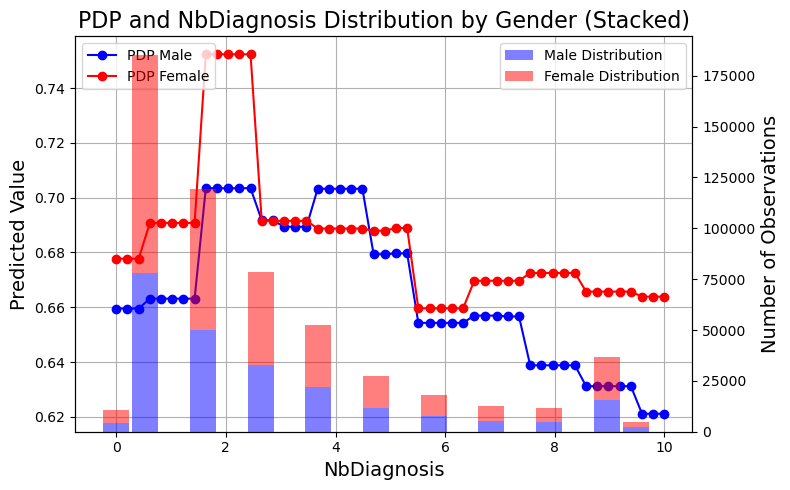

In [196]:
import matplotlib.pyplot as plt

# Modèle choisi (Random Forest optimisé)
model = best_rf

# Prédictions pour les données synthétiques
preds_male = model.predict_proba(diagnosis_male)[:, 1]
preds_female = model.predict_proba(diagnosis_female)[:, 1]

# Comptage des valeurs de NbDiagnosis dans le dataset original pour chaque sexe, en utilisant les mêmes bins
bins = np.linspace(df['NbDiagnosis'].min(), df['NbDiagnosis'].max(), 20)
diagnosis_counts_male = np.histogram(df[df['Gender'] == 1]['NbDiagnosis'].dropna(), bins=bins)[0]
diagnosis_counts_female = np.histogram(df[df['Gender'] == 2]['NbDiagnosis'].dropna(), bins=bins)[0]

# Graphique
fig, ax1 = plt.subplots(figsize=(8, 5))

# PDP pour les hommes
ax1.plot(diagnosis_male['NbDiagnosis'], preds_male, color='blue', label='PDP Male', marker='o')
# PDP pour les femmes
ax1.plot(diagnosis_female['NbDiagnosis'], preds_female, color='red', label='PDP Female', marker='o')

ax1.set_xlabel('NbDiagnosis', fontsize=14)
ax1.set_ylabel('Predicted Value', fontsize=14)
ax1.legend(loc='upper left')
ax1.grid(True)

# Bar plot pour la distribution des NbDiagnosis empilée
ax2 = ax1.twinx()

bar_width = (bins[1] - bins[0]) * 0.9
ax2.bar(bins[:-1], diagnosis_counts_male, color='blue', alpha=0.5, width=bar_width, label='Male Distribution')
ax2.bar(bins[:-1], diagnosis_counts_female, color='red', alpha=0.5, width=bar_width, label='Female Distribution', bottom=diagnosis_counts_male)

ax2.set_ylabel('Number of Observations', fontsize=14)
ax2.legend(loc='upper right')

plt.title('PDP and NbDiagnosis Distribution by Gender (Stacked)', fontsize=16)
plt.tight_layout()
plt.show()


C:\Users\emmad\AppData\Local\Temp\ipykernel_14224\2565838033.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




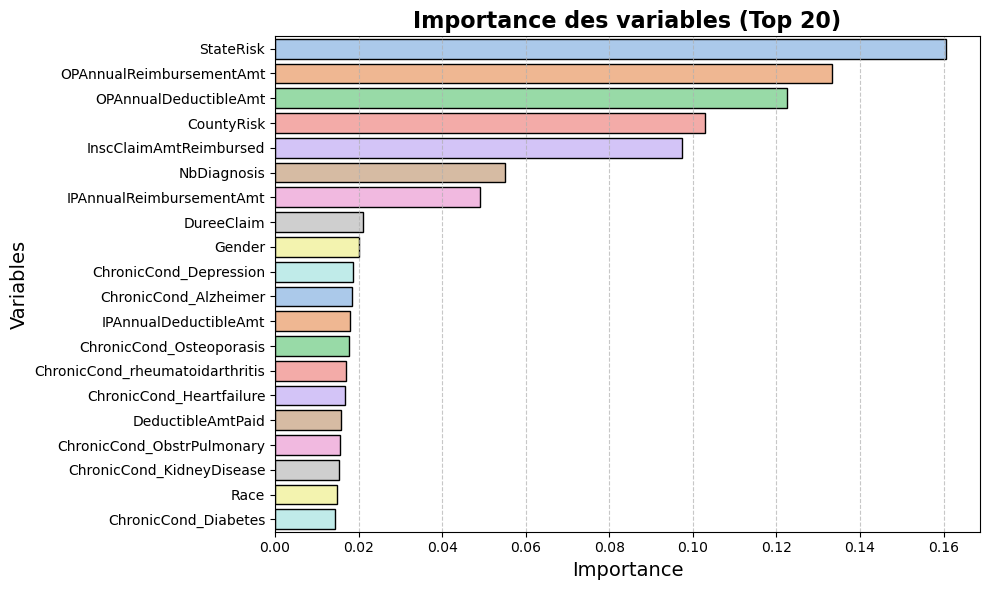

In [197]:
import matplotlib.pyplot as plt
import seaborn as sns

# Affichage des 10 variables les plus importantes
top_features = feature_importance.head(20)

# Création du graphique
plt.figure(figsize=(10, 6))
sns.barplot(
    x='importance', 
    y='feature', 
    data=top_features, 
    palette='pastel', 
    edgecolor='black'
)

# Ajout des titres et labels
plt.title('Importance des variables (Top 20)', fontsize=16, fontweight='bold')
plt.xlabel('Importance', fontsize=14)
plt.ylabel('Variables', fontsize=14)

# Ajustement de l'affichage
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()

# Affichage du graphique
plt.show()


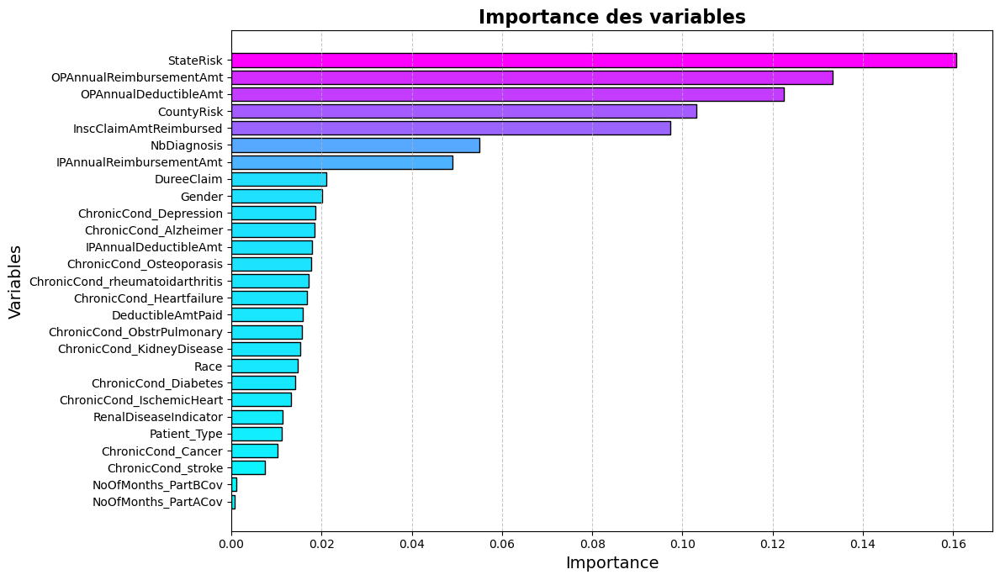

In [198]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Normalisation des importances pour créer un dégradé
normalized_importance = feature_importance['importance'] / feature_importance['importance'].max()

# Création de la palette en dégradé (tons bleu-violet)
colors = sns.color_palette("cool", as_cmap=True)(normalized_importance)

# Création du graphique
plt.figure(figsize=(12, 7))
plt.barh(
    y=feature_importance['feature'], 
    width=feature_importance['importance'], 
    color=colors, 
    edgecolor='black'
)

# Ajout des titres et labels
plt.title('Importance des variables', fontsize=16, fontweight='bold')
plt.xlabel('Importance', fontsize=14)
plt.ylabel('Variables', fontsize=14)

# Ajustement de l'affichage
plt.gca().invert_yaxis()  # Inversion pour afficher les plus importantes en haut
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()

# Affichage du graphique
plt.show()


In [199]:
"""# Exemple d'implémentation des modèles de classification avec validation croisee et optimisation des hyperparamètres

# Importation des bibliothèques nécessaires
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score

# Importation des modèles
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.linear_model import LogisticRegression

# 1. KNeighborsClassifier (déjà implémenté)
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
param_grid_knn = {
    'n_neighbors': [3, 5],
    'weights': ['uniform', 'distance']
}
grid_search_knn = GridSearchCV(estimator=knn, param_grid=param_grid_knn, cv=3, scoring='accuracy', verbose=1, n_jobs=-1)
grid_search_knn.fit(X_train, y_train)
y_pred_knn = grid_search_knn.best_estimator_.predict(X_test)
print("KNN Rapport de classification :")
print(classification_report(y_test, y_pred_knn))

# 2. SVM
svc = SVC()
param_grid_svc = {
    'C': [0.1, 1],
    'kernel': ['linear', 'rbf']
}
grid_search_svc = GridSearchCV(estimator=svc, param_grid=param_grid_svc, cv=3, scoring='accuracy', verbose=1, n_jobs=-1)
grid_search_svc.fit(X_train, y_train)
y_pred_svc = grid_search_svc.best_estimator_.predict(X_test)
print("SVM Rapport de classification :")
print(classification_report(y_test, y_pred_svc))

# 3. Gaussian Process
gpc = GaussianProcessClassifier()
kernel = 1.0 * RBF(length_scale=1.0)  # Exemple de noyau prédéfini
param_grid_gpc = {
    'max_iter_predict': [50, 100]
}
grid_search_gpc = GridSearchCV(estimator=gpc, param_grid=param_grid_gpc, cv=3, scoring='accuracy', verbose=1, n_jobs=-1)
grid_search_gpc.fit(X_train, y_train)
y_pred_gpc = grid_search_gpc.best_estimator_.predict(X_test)
print("Gaussian Process Rapport de classification :")
print(classification_report(y_test, y_pred_gpc))

# 4. Decision Tree
dt = DecisionTreeClassifier()
param_grid_dt = {
    'max_depth': [None, 10, 20]
}
grid_search_dt = GridSearchCV(estimator=dt, param_grid=param_grid_dt, cv=3, scoring='accuracy', verbose=1, n_jobs=-1)
grid_search_dt.fit(X_train, y_train)
y_pred_dt = grid_search_dt.best_estimator_.predict(X_test)
print("Decision Tree Rapport de classification :")
print(classification_report(y_test, y_pred_dt))

# 5. Random Forest
rf = RandomForestClassifier()
param_grid_rf = {
    'n_estimators': [50, 100],
    'max_depth': [None, 10]
}
grid_search_rf = GridSearchCV(estimator=rf, param_grid=param_grid_rf, cv=3, scoring='accuracy', verbose=1, n_jobs=-1)
grid_search_rf.fit(X_train, y_train)
y_pred_rf = grid_search_rf.best_estimator_.predict(X_test)
print("Random Forest Rapport de classification :")
print(classification_report(y_test, y_pred_rf))

# 6. Neural Network
nn = MLPClassifier()
param_grid_nn = {
    'hidden_layer_sizes': [(50,), (100,)]
}
grid_search_nn = GridSearchCV(estimator=nn, param_grid=param_grid_nn, cv=3, scoring='accuracy', verbose=1, n_jobs=-1)
grid_search_nn.fit(X_train, y_train)
y_pred_nn = grid_search_nn.best_estimator_.predict(X_test)
print("Neural Network Rapport de classification :")
print(classification_report(y_test, y_pred_nn))

# 7. AdaBoost
ab = AdaBoostClassifier()
param_grid_ab = {
    'n_estimators': [50, 100]
}
grid_search_ab = GridSearchCV(estimator=ab, param_grid=param_grid_ab, cv=3, scoring='accuracy', verbose=1, n_jobs=-1)
grid_search_ab.fit(X_train, y_train)
y_pred_ab = grid_search_ab.best_estimator_.predict(X_test)
print("AdaBoost Rapport de classification :")
print(classification_report(y_test, y_pred_ab))

# 8. Naive Bayes (Pas d'optimisation d'hyperparamètres, car simple)
nb = GaussianNB()
nb.fit(X_train, y_train)
y_pred_nb = nb.predict(X_test)
print("Naive Bayes Rapport de classification :")
print(classification_report(y_test, y_pred_nb))

# 9. QDA
qda = QDA()
qda.fit(X_train, y_train)
y_pred_qda = qda.predict(X_test)
print("QDA Rapport de classification :")
print(classification_report(y_test, y_pred_qda))

# 10. LDA
lda = LDA()
lda.fit(X_train, y_train)
y_pred_lda = lda.predict(X_test)
print("LDA Rapport de classification :")
print(classification_report(y_test, y_pred_lda))

# 11. Logistic Regression
lr = LogisticRegression()
param_grid_lr = {
    'C': [0.1, 1]
}
grid_search_lr = GridSearchCV(estimator=lr, param_grid=param_grid_lr, cv=3, scoring='accuracy', verbose=1, n_jobs=-1)
grid_search_lr.fit(X_train, y_train)
y_pred_lr = grid_search_lr.best_estimator_.predict(X_test)
print("Logistic Regression Rapport de classification :")
print(classification_report(y_test, y_pred_lr))

# 12. Gradient Boosting
gb = GradientBoostingClassifier()
param_grid_gb = {
    'n_estimators': [50, 100],
    'learning_rate': [0.05, 0.1]
}
grid_search_gb = GridSearchCV(estimator=gb, param_grid=param_grid_gb, cv=3, scoring='accuracy', verbose=1, n_jobs=-1)
grid_search_gb.fit(X_train, y_train)
y_pred_gb = grid_search_gb.best_estimator_.predict(X_test)
print("Gradient Boosting Rapport de classification :")
print(classification_report(y_test, y_pred_gb))"""


'# Exemple d\'implémentation des modèles de classification avec validation croisee et optimisation des hyperparamètres\n\n# Importation des bibliothèques nécessaires\nfrom sklearn.model_selection import GridSearchCV\nfrom sklearn.metrics import classification_report, accuracy_score\n\n# Importation des modèles\nfrom sklearn.svm import SVC\nfrom sklearn.gaussian_process import GaussianProcessClassifier\nfrom sklearn.gaussian_process.kernels import RBF\nfrom sklearn.tree import DecisionTreeClassifier\nfrom sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier\nfrom sklearn.neural_network import MLPClassifier\nfrom sklearn.naive_bayes import GaussianNB\nfrom sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA\nfrom sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA\nfrom sklearn.linear_model import LogisticRegression\n\n# 1. KNeighborsClassifier (déjà implémenté)\nfrom sklearn.neighbors import KNeighborsCla

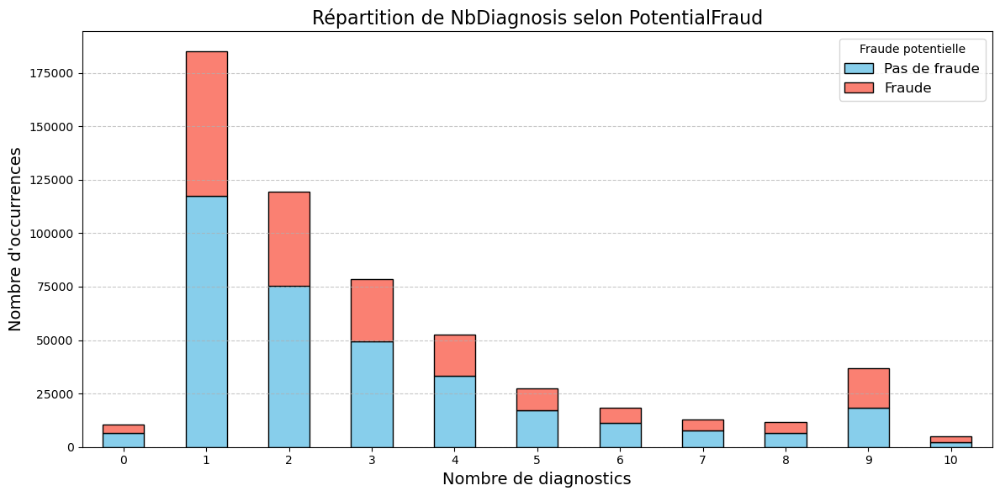

In [200]:
import matplotlib.pyplot as plt
import seaborn as sns

# Préparation des données pour la répartition de PotentialFraud par NbDiagnosis
fraud_counts = data.groupby(['NbDiagnosis', 'PotentialFraud']).size().unstack(fill_value=0)

# Création de la figure
plt.figure(figsize=(12, 6))

# Tracer les barres empilées
fraud_counts.plot(
    kind='bar',
    stacked=True,
    color=['skyblue', 'salmon'],  # Couleurs pour 'No' et 'Yes' dans PotentialFraud
    edgecolor='black',
    ax=plt.gca()
)

# Titre et labels
plt.title('Répartition de NbDiagnosis selon PotentialFraud', fontsize=16)
plt.xlabel('Nombre de diagnostics', fontsize=14)
plt.ylabel('Nombre d\'occurrences', fontsize=14)
plt.xticks(rotation=0)
plt.legend(title='Fraude potentielle', labels=['Pas de fraude', 'Fraude'], fontsize=12)

# Grille pour l'axe Y
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Affichage
plt.tight_layout()
plt.show()
